In [26]:
# ! source /global/home/users/sanjitsbatra/.bash_profile
# ! conda init bash
# # ! source /global/home/users/sanjitsbatra/.condarc
# ! conda activate gpu_env
# ! python -m pip install --user numpy==1.17.0
! python -m pip install --user -U matplotlib

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7.
     |################################| 12.8MB 14.7MB/s eta 0:00:01
     |################################| 102kB 2.8MB/s eta 0:00:01
     |################################| 102kB 3.0MB/s eta 0:00:01
  Stored in directory: /global/home/users/sanjitsbatra/.cache/pip/wheels/68/39/1a/5e402bdfdf004af1786c8b853fd92f8c4a04f22aad179654d1
Successfully built subprocess32
ERROR: pylint 1.8.2 requires configparser, which is not installed.
ERROR: astroid 1.6.1 has requirement enum34>=1.1.3, but you'll have enum34 1.0.4 which is incompatible.


In [1]:
import sys, os
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error
from scipy.stats import spearmanr, pearsonr
import seaborn as sns
import matplotlib.pyplot as plt
import random
import itertools
import warnings
from tqdm import tqdm
warnings.filterwarnings('ignore')

RESOLUTION = 25
window_size = 401

ALL_CELL_TYPES = ["T{0:0=2d}".format(x) for x in [1,2,3,4,5,6,7,8,9,10,11,12,13]]
assays = ['H3K36me3', 'H3K27me3', 'H3K27ac', 'H3K4me1', 'H3K4me3', 'H3K9me3', 'MNase']

model_type_rename_dict = {"linear":"Ridge", "maxpool":"CNN"}

num_layers_dict = {9:2, 13:2, 17:2, 21:2, 25:2,
                   31:3, 41:3, 51:3, 61:3, 71:3,
                   81:4, 101:4, 121:4, 141:4, 161:4, 181:4, 201:4, 221:4, 241:4,
                   261:5, 281:5, 301:5, 321:5, 341:5, 361:5, 381:5, 401:5}

def convert_to_2D(idx, nrows, ncols):
    return idx//ncols, idx%ncols


In [2]:
colnames = ["pos_" + str(x) for x in list(range(-(window_size//2), (window_size//2) + 1))]
colnames = colnames + ["log10p1(TPM)", "cell_type", "chrom", "position", "strand", "assay_index"] 

# df = pd.read_csv('../../../Data/Original.Training_Data.csv.sorted', sep=",", names=colnames, low_memory=False)
df = pd.read_csv('../../../Data/Transformed.Training_Data.csv.sorted', sep=",", names=colnames, low_memory=False)

df

,pos_-200,pos_-199,pos_-198,pos_-197,pos_-196,pos_-195,pos_-194,pos_-193,pos_-192,pos_-191,...,pos_197,pos_198,pos_199,pos_200,log10p1(TPM),cell_type,chrom,position,strand,assay_index
0,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,0.404711,...,0.404711,0.404711,0.404711,0.404711,0.0,T01,chr1,27466,-,2
1,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,0.352197,...,0.352197,0.352197,0.352197,0.352197,0.0,T01,chr1,27466,-,3
2,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,0.345510,...,0.345510,0.345510,0.345510,0.345510,0.0,T01,chr1,27466,-,4
3,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,0.342030,...,0.342030,0.342030,0.342030,0.342030,0.0,T01,chr1,27466,-,5
4,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,0.351294,...,0.351294,0.351294,0.351294,0.351294,0.0,T01,chr1,27466,-,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
828433,0.357446,0.412326,0.407789,0.398536,0.404581,0.324968,0.313034,0.313752,0.338428,0.356020,...,0.347971,0.348321,0.322026,0.332254,0.0,T13,chr22,2019474,+,3
828434,0.802335,1.133210,1.049832,1.049832,1.124592,1.226962,1.226962,1.442706,1.463740,1.378121,...,0.316077,0.316077,0.316077,0.316077,0.0,T13,chr22,2019474,+,4
828435,0.437168,0.358530,0.379583,0.379583,0.379583,0.379583,0.364877,0.437965,0.630581,0.567302,...,0.604903,0.509733,0.451201,0.489364,0.0,T13,chr22,2019474,+,5
828436,0.756888,0.813601,1.089862,1.102051,1.104208,1.061381,1.016406,0.747131,0.631313,0.512288,...,0.381220,0.381220,0.413746,0.453687,0.0,T13,chr22,2019474,+,6


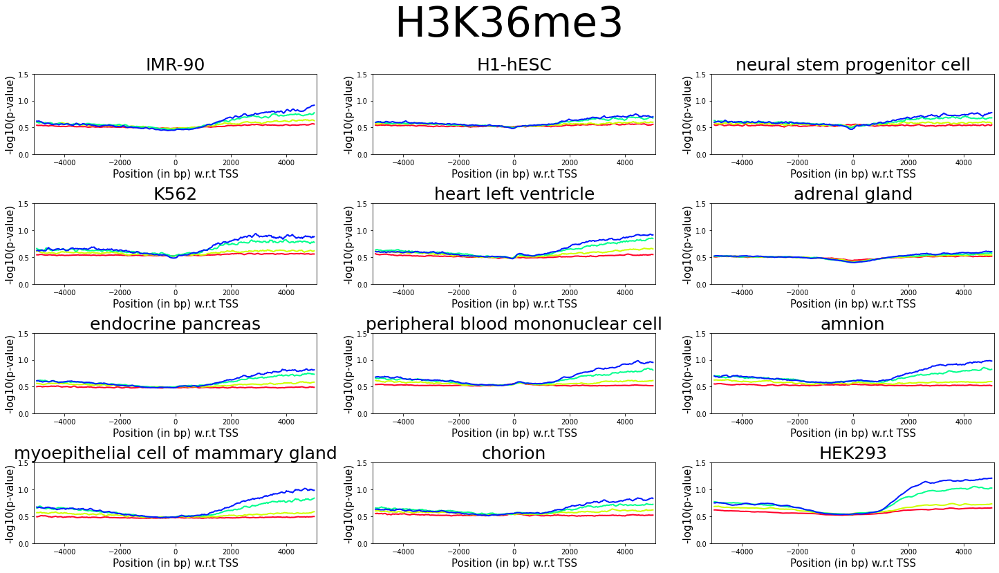

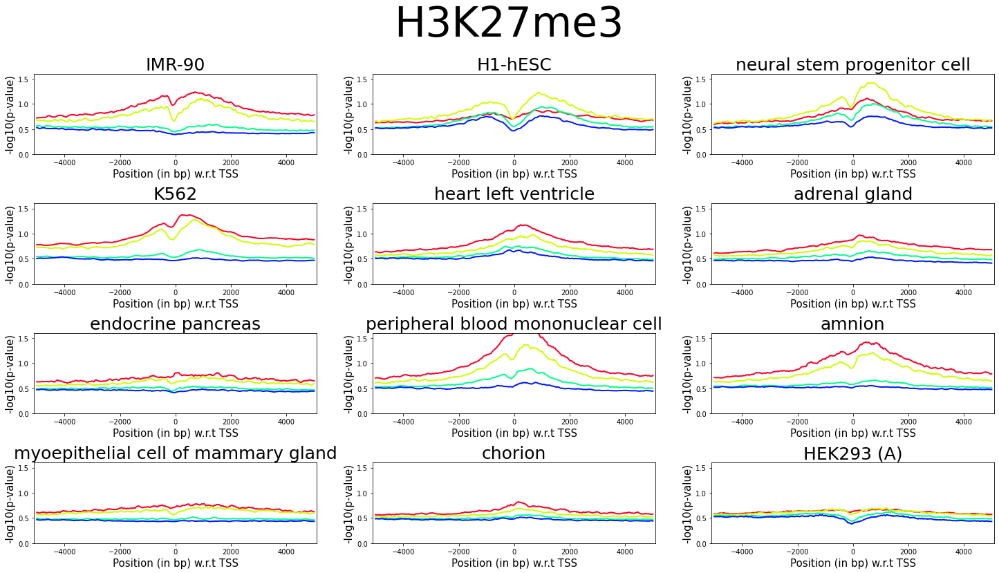

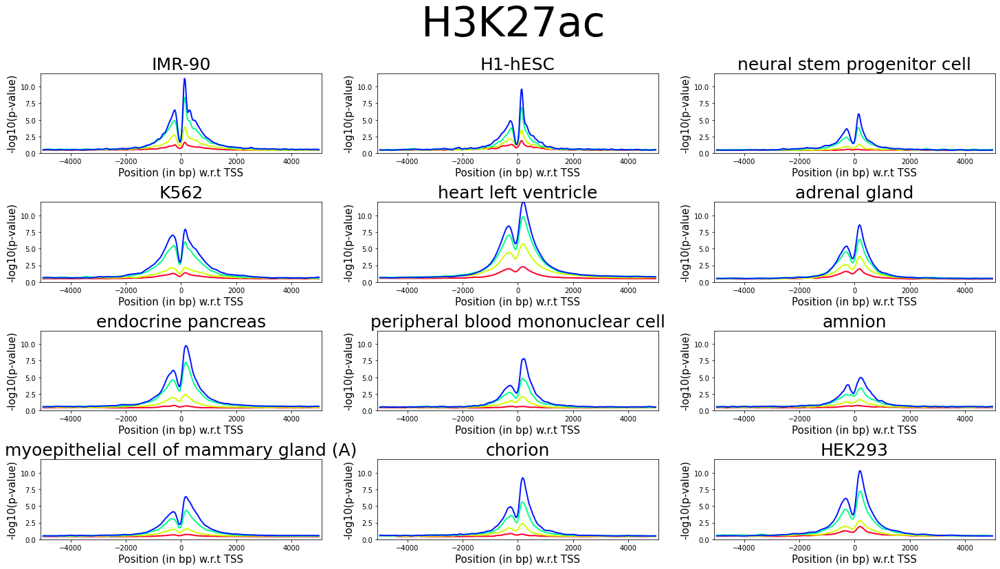

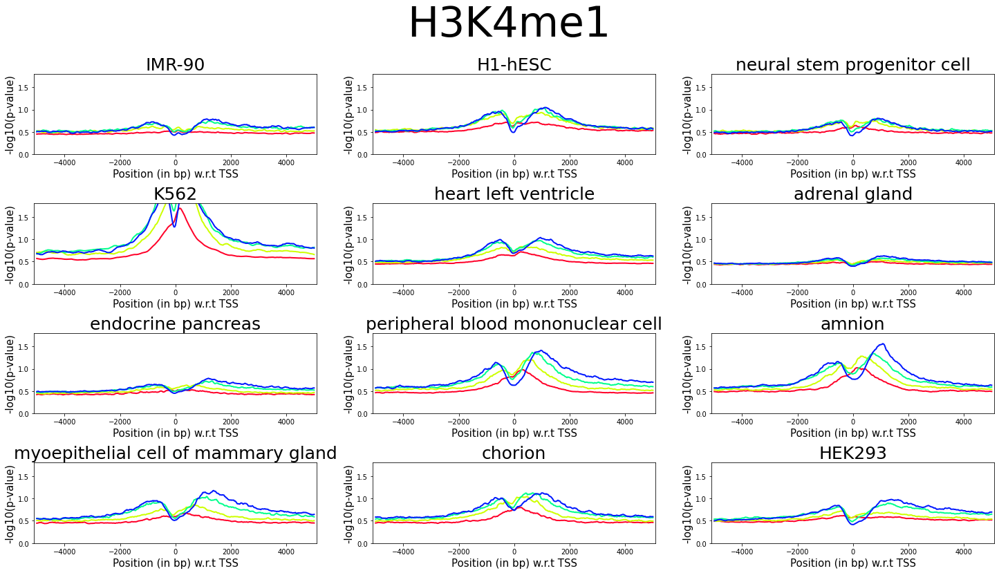

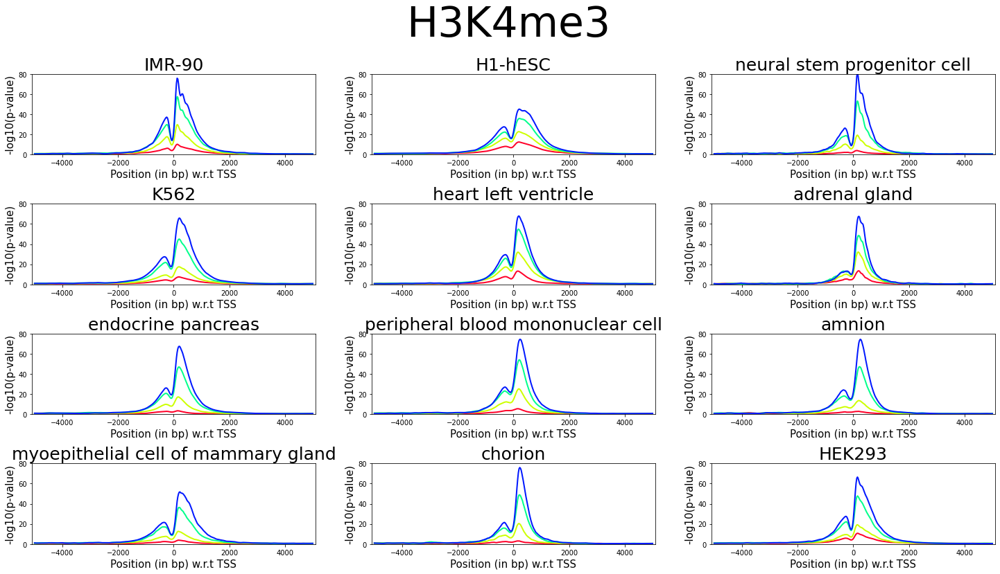

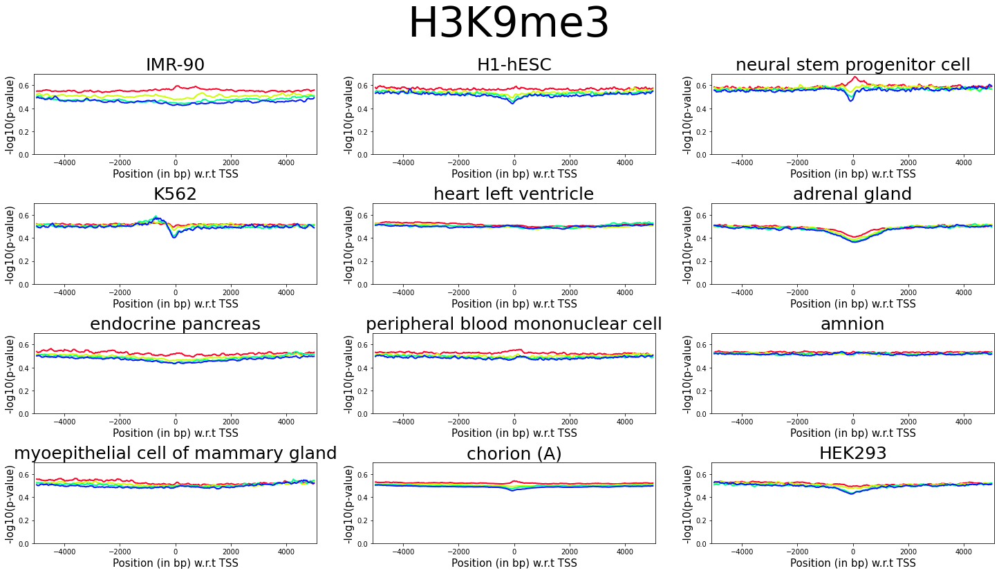

In [3]:
plt.rcParams["figure.figsize"] = (80, 20)
xticklabels = [RESOLUTION*x for x in range(-(window_size//2), (window_size//2)+1)]

Avocado_list = ["T11_A04", "T12_A07", "T13_A03"]

# Step-0: Subset dataframe to cell type and assay type
cell_types = ["T{0:0=2d}".format(x) for x in [1,2,4,5,6,7,8,9,10,11,12,13]]

cell_type_names = {'T01':'IMR-90', 
                   'T02':'H1-hESC', 
                   'T03':'trophoblast cell', 
                   'T04':'neural stem progenitor cell', 
                   'T05':'K562', 
                   'T06':'heart left ventricle',
                   'T07':'adrenal gland',
                   'T08':'endocrine pancreas',
                   'T09':'peripheral blood mononuclear cell',
                   'T10':'amnion',
                   'T11':'myoepithelial cell of mammary gland',
                   'T12':'chorion',
                   'T13':'HEK293'}

assay_type_ylim = {2:1.5, 3:1.6, 4:12, 5:1.8, 6:80, 7:0.7}

for assay_type in range(2, 8):
    assay_name = "A{0:0=2d}".format(assay_type)
        
    num_rows = 4
    num_cols = 3
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 10), sharey=False)
    fig.tight_layout(pad=1, w_pad=5, h_pad=5)
    
    for idx, cell_type in enumerate(cell_types):
        
        if((cell_type+"_"+assay_name) in Avocado_list):
            Avocado_flag = " (A)"
        else:
            Avocado_flag = ""

        idx_x, idx_y = convert_to_2D(idx, nrows=num_rows, ncols=num_cols)
#         print(idx, idx_x, idx_y)
        ax = axes[idx_x, idx_y]
        
        df_analysis = df[(df["assay_index"] == assay_type) & (df["cell_type"] == cell_type)]

#         Step-1: Define gene expression quantiles
        number_of_quantiles = 5
        log10p1_tpm_non_zero = [x for x in df_analysis["log10p1(TPM)"] if x > 0]
        quantiles = [np.quantile(log10p1_tpm_non_zero, x) for x in np.arange(0, 1, 1.0/(number_of_quantiles*1.0))]
        quantiles = [-1] + quantiles + [np.inf]
#         print(quantiles)
        colors = plt.cm.gist_rainbow(np.linspace(0, 1, number_of_quantiles))        

        # Step-2: Group features by their quantile
        df_quantiles = {}
        for i in range(1, number_of_quantiles):
            df_quantiles[i] = df_analysis[(df_analysis["log10p1(TPM)"] >= quantiles[i-1]) & (df_analysis["log10p1(TPM)"] < quantiles[i])]

            # Step-3: Create sausage plot for each quantile within df_quantile
            y_values = np.expm1(df_quantiles[i].iloc[:, :window_size])
            y_corrected_values = y_values
            y_means = y_corrected_values.mean()
            y_stds = y_corrected_values.std()

            ax.plot(xticklabels, y_means, color=colors[i-1],
#                      label=str(df_quantiles[i].shape[0])+" genes have TPM in ["+str(max(0.0, round(np.power(10, quantiles[i-1])-1,2)))+", "+str(round(np.power(10, quantiles[i])-1,2))+")",
                            linewidth=2)
#             ax.fill_between(xticklabels,
# #         #                     range(-(window_size//2), (window_size//2)+1),
#                              df_quantiles[i].iloc[:, :window_size].mean()-df_quantiles[i].iloc[:, :window_size].std(), 
#                              df_quantiles[i].iloc[:, :window_size].mean()+df_quantiles[i].iloc[:, :window_size].std(),
#                              alpha=0.3)
        ax.set_title(str(cell_type_names[cell_type]) + Avocado_flag, fontsize=25)
#         ax.set_title(str(assays[assay_type-1]), fontsize=25)

        ax.set_xlim(-5100, 5100)
        ax.set_ylim(0, assay_type_ylim[assay_type])

        ax.tick_params(axis='both', which='major', labelsize=10)
        ax.tick_params(axis='both', which='minor', labelsize=10)
        ax.set_xlabel("Position (in bp) w.r.t TSS", size=15)
        ax.set_ylabel("-log10(p-value)", size=15)

    handles, labels = ax.get_legend_handles_labels()
#     fig.legend(handles, labels, loc='upper center', prop={'size': 10}, ncol=2)
    fig.suptitle(""+str(assays[assay_type-2]), fontsize=60,  y=1.12)
#     fig.savefig(str(assays[assay_type-2]) + ".transformed_data.pdf", dpi=fig.dpi, bbox_inches = 'tight')
    plt.show()
    plt.close()

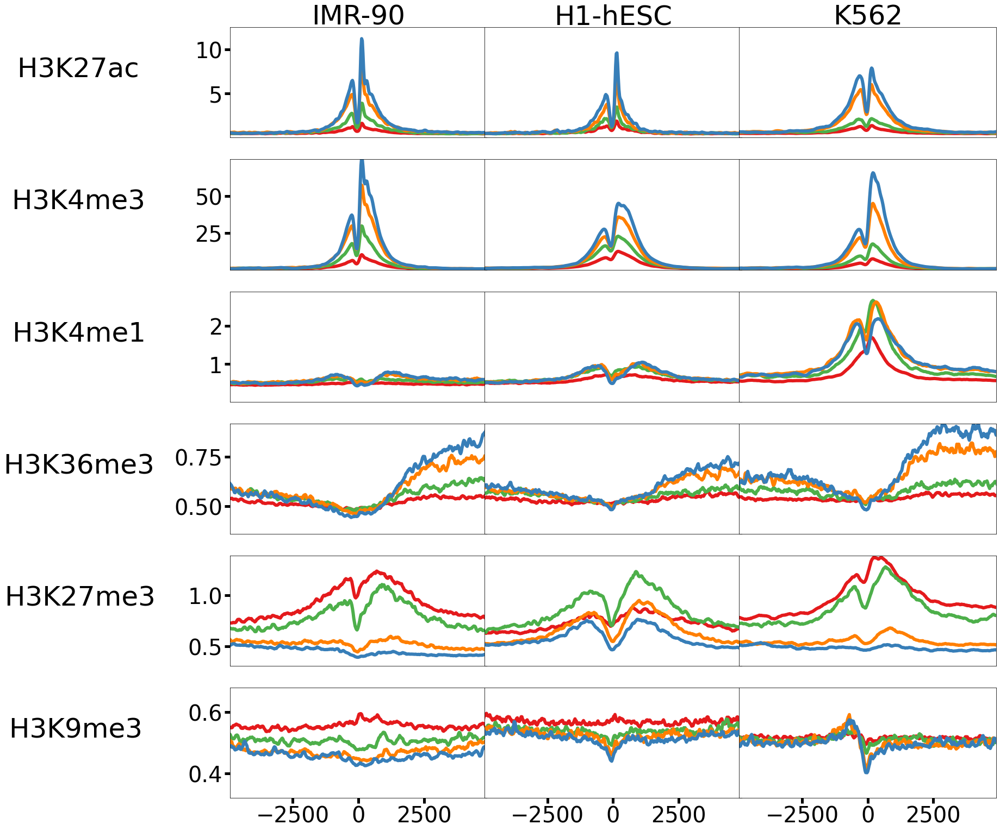

In [4]:
# For Figure 1 we show the six assay of HEK293
num_rows = 6
num_cols = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 20), sharex='col', sharey='row')
fig.tight_layout(pad=0, w_pad=-2, h_pad=3)    

assay_type_ylim_min = {2:0.36, 3:0.31, 4:0.01, 5:0.01, 6:0.01, 7:0.32}
assay_type_ylim_max = {2:0.92, 3:1.39, 4:12.51, 5:2.9, 6:74.9, 7:0.68}

special_cell_types = [cell_types[0], cell_types[1], cell_types[3]]


for idx, assay_type in enumerate([4, 6, 5, 2, 3, 7]): #  range(2, 8)):
    assay_name = "A{0:0=2d}".format(assay_type)
        
    for jjj, cell_type in enumerate(special_cell_types):
        
        if((cell_type+"_"+assay_name) in Avocado_list):
            Avocado_flag = " (A)"
        else:
            Avocado_flag = "" # Corresponds to HEK293 instead of HEK293T

#         idx_x, idx_y = convert_to_2D(idx, nrows=num_rows, ncols=num_cols)
#         print(idx, idx_x, idx_y)

        idx_x = idx
        idx_y = jjj

        ax = axes[idx_x, idx_y]
        
        df_analysis = df[(df["assay_index"] == assay_type) & (df["cell_type"] == cell_type)]
        
#         Step-1: Define gene expression quantiles
        number_of_quantiles = 5
        log10p1_tpm_non_zero = [x for x in df_analysis["log10p1(TPM)"] if x > 0]
        quantiles = [np.quantile(log10p1_tpm_non_zero, x) for x in np.arange(0, 1, 1.0/(number_of_quantiles*1.0))]
        quantiles = [-1] + quantiles + [np.inf]
#         print(quantiles)

#         colors = plt.cm.gist_rainbow(np.linspace(0, 1, number_of_quantiles))        
        colors = ['#e41a1c', '#4daf4a', '#ff7f00', '#377eb8']

        # Step-2: Group features by their quantile
        df_quantiles = {}
        for i in range(1, number_of_quantiles):
            df_quantiles[i] = df_analysis[(df_analysis["log10p1(TPM)"] >= quantiles[i-1]) & (df_analysis["log10p1(TPM)"] < quantiles[i])]

            # Step-3: Create sausage plot for each quantile within df_quantile
            y_values = np.expm1(df_quantiles[i].iloc[:, :window_size])
            y_corrected_values = y_values
            y_means = y_corrected_values.mean()
            y_stds = y_corrected_values.std()

            ax.plot(xticklabels, y_means, color=colors[i - 1],
#                      label=str(df_quantiles[i].shape[0])+" genes have TPM in ["+str(max(0.0, round(np.power(10, quantiles[i-1])-1,2)))+", "+str(round(np.power(10, quantiles[i])-1,2))+")",
                            linewidth=6)
#             ax.fill_between(xticklabels,
# #         #                     range(-(window_size//2), (window_size//2)+1),
#                              df_quantiles[i].iloc[:, :window_size].mean()-df_quantiles[i].iloc[:, :window_size].std(), 
#                              df_quantiles[i].iloc[:, :window_size].mean()+df_quantiles[i].iloc[:, :window_size].std(),
#                              alpha=0.3)
#         ax.set_title(str(cell_type_names[cell_type]) + ": " + str(assays[idx]) + Avocado_flag, fontsize=25)
#         ax.set_title(str(assays[assay_type-1]), fontsize=25)

        ax.set_xlim(-4900, 4900)
        ax.set_ylim(assay_type_ylim_min[assay_type], assay_type_ylim_max[assay_type])

        ax.tick_params(axis='x', which='major', labelsize=40, rotation=0, width=5, size=10)
        ax.tick_params(axis='y', which='major', labelsize=40, width=5, size=10)
            
        if( (idx_y == 0) and (idx_x < 5) ):
            ax.xaxis.set_ticks_position('none')
        elif( (idx_y == 0) and (idx_x == 5) ):
            pass
        elif( (idx_y > 0) and (idx_x < 5) ):
            ax.xaxis.set_ticks_position('none')
            ax.yaxis.set_ticks_position('none')
        elif( (idx_y > 0) and (idx_x == 5) ):
            ax.yaxis.set_ticks_position('none')
            
#         ax.set_xlabel("Position (in bp) w.r.t TSS", size=15)
#         ax.set_ylabel("-log10(p-value)", size=15)

column_headers=["IMR-90", "H1-hESC", "K562"]
row_headers=["H3K27ac                           ", 
             "H3K4me3                           ", 
             "H3K4me1                              ", 
             "H3K36me3                      ", 
             "H3K27me3                         ", 
             "H3K9me3                          "]




for ax, col in zip(axes[0], column_headers):
    ax.set_title(col, fontsize=50)

for ax, row in zip(axes[:,0], row_headers):
    ax.set_ylabel(row, rotation=0, fontsize=50, labelpad=0)    

for ax in plt.gcf().axes:
    try:
        ax.label_outer()
    except:
        pass    
    
handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper center', prop={'size': 10}, ncol=2)
fig.suptitle("", fontsize=40,  y=1.08)
fig.savefig("Figure_2.pdf", dpi=200, bbox_inches = 'tight')
plt.show()
plt.close()

In [5]:
matplotlib.__version__

NameError: name 'matplotlib' is not defined

In [4]:
# The p-value correction figure will come from the p-values_normalization notebook

In [6]:
# Now we discuss Figure 2, where we want to showcase a model that predicts gene expression from histone marks
# First we train 10 replicates each for linear and maxpool CNN models, on training chromosomes of all 13 cell types
# We then compute the spearman across all cell types as a function of input context length
import os 
sc_dict = {}
for model_type in ["linear", "maxpool"]:
    sc_dict[model_type] = []
    for context_length in tqdm(range(31, 402, 10)):
        sc_list = []
        for replicate in range(1, 11):
        
            num_layers = 3
            if( (context_length > 101) and (context_length <= 241) ):
                num_layers = 4
            elif(context_length >= 251):
                num_layers = 5
          
            if(context_length > 201):
                replicate = str(replicate) + ".all_cell_type"
        
            f_name = "../../../old_slow_Logs/manuscript.R8.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_length)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1.testing_metrics.tsv"
            
            if(os.path.exists(f_name)):         
                df_testing = pd.read_csv(f_name, sep="\t", header=None)
                sc = spearmanr(list(df_testing.iloc[:, 5]), list(df_testing.iloc[:, 6]))[0]
            else:
                sc = -100
                
            sc_list.append(sc)

        sc_dict[model_type].append((context_length, np.mean(sc_list), np.std(sc_list)))

sc_dict

100%|██████████| 38/38 [00:40<00:00,  1.05s/it]


{'linear': [(31, 0.6690299071906269, 0.00046024096480949976),
  (41, 0.6792023382269577, 0.00045156548442178753),
  (51, 0.682834208829177, 0.0009690157693024862),
  (61, 0.684578058346348, 0.0007366194776985587),
  (71, 0.6893575288676705, 0.000687985872190827),
  (81, 0.6902744989910012, 0.0007628435019214222),
  (91, 0.6917224273273724, 0.0007979905319446535),
  (101, 0.6937867274738241, 0.0011518211353132675),
  (111, 0.695737536895431, 0.0007903423405160085),
  (121, 0.6973862899871996, 0.0013349188153251761),
  (131, 0.6982009871978282, 0.0013807446422125702),
  (141, 0.7002088592759111, 0.0007736660595768267),
  (151, 0.701883006987103, 0.001147929761609922),
  (161, 0.7024593275443674, 0.0014973433545694482),
  (171, 0.7034213148890336, 0.0004972397278192912),
  (181, 0.7038035205193852, 0.0014847507840147732),
  (191, 0.7036159285648016, 0.0009842403719423497),
  (201, 0.7049467388378626, 0.001018215103973834),
  (211, 0.7060310241316051, 0.000807390120555083),
  (221, 0.70752

In [27]:
# Now we pick the model with the longest context size (401 = 10Kb = 5Kb on either side of TSS)
# and train 10 replicates for linear and maxpool models
# We train on training chromosomes of all but one cell types and test on the remaining cell type
import seaborn as sns

sd_dict = {}
ct_sc_dict = {}
results_list = []
for cell_type_index in range(len(ALL_CELL_TYPES)):
    cell_type = ALL_CELL_TYPES[cell_type_index]
    ct_sc_dict[cell_type] = {}    
    for model_type in ["maxpool", "linear"]:
        ct_sc_dict[cell_type][model_type] = []

        for replicate in tqdm(range(1, 11)):
            yTrue = []
            yPred = []

            f_name = "../../../old_slow_Logs/manuscript.R10.leave_one_out_cell_type_training.replicate_"+str(replicate)+"_0_transcriptome_401_5_32_"+model_type+"_mse_1_"+str(cell_type_index)+".testing_metrics.tsv"
            f_results = open(f_name, 'r')
            for line in f_results:
                vec = line.rstrip("\n").split("\t")
                if(vec[3] != cell_type):
                    continue
                else:
                    yTrue.append(float(vec[5]))
                    yPred.append(float(vec[6]))
            f_results.close()
            sc = np.nan_to_num(spearmanr(yTrue, yPred)[0])
            ct_sc_dict[cell_type][model_type].append(sc)

        results_list.append((cell_type_names[cell_type],
                             model_type_rename_dict[model_type],
                             np.mean(ct_sc_dict[cell_type][model_type]),
                             np.std(ct_sc_dict[cell_type][model_type])))
        
        sd_dict[np.mean(ct_sc_dict[cell_type][model_type])] = np.std(ct_sc_dict[cell_type][model_type])

# ct_sc_dict
# results_list
df_results = pd.DataFrame(results_list, columns=["cell_type", "model", "spearman_mean", "spearman_std"])


short_name = {'IMR-90':'IMR-90', 
                   'H1-hESC':'H1-hESC', 
                   'trophoblast cell':'trophoblast',
                   'neural stem progenitor cell':'neural',
                   'K562':'K562',
                   'heart left ventricle':'heart',
                   'adrenal gland':'adrenal',
                   'endocrine pancreas':'pancreas',
                   'peripheral blood mononuclear cell':'PBMC',
                   'amnion':'amnion',
                   'myoepithelial cell of mammary gland':'mammary',
                   'chorion':'chorion',
                   'HEK293':'HEK293'}

df_results["cell_type_short_name"] = [short_name[x] for x in list(df_results["cell_type"])]

df_results

100%|██████████| 10/10 [00:00<00:00, 57.74it/s]


,cell_type,model,spearman_mean,spearman_std,cell_type_short_name
0,IMR-90,CNN,0.757277,0.005886,IMR-90
1,IMR-90,Ridge,0.728393,0.001238,IMR-90
2,H1-hESC,CNN,0.679273,0.003019,H1-hESC
3,H1-hESC,Ridge,0.653406,0.002621,H1-hESC
4,trophoblast cell,CNN,0.743651,0.008337,trophoblast
5,trophoblast cell,Ridge,0.722843,0.001520,trophoblast
6,neural stem progenitor cell,CNN,0.733774,0.024052,neural
7,neural stem progenitor cell,Ridge,0.730600,0.002133,neural
8,K562,CNN,0.743879,0.005815,K562
9,K562,Ridge,0.711087,0.002243,K562


100%|██████████| 10/10 [00:17<00:00,  1.70s/it]


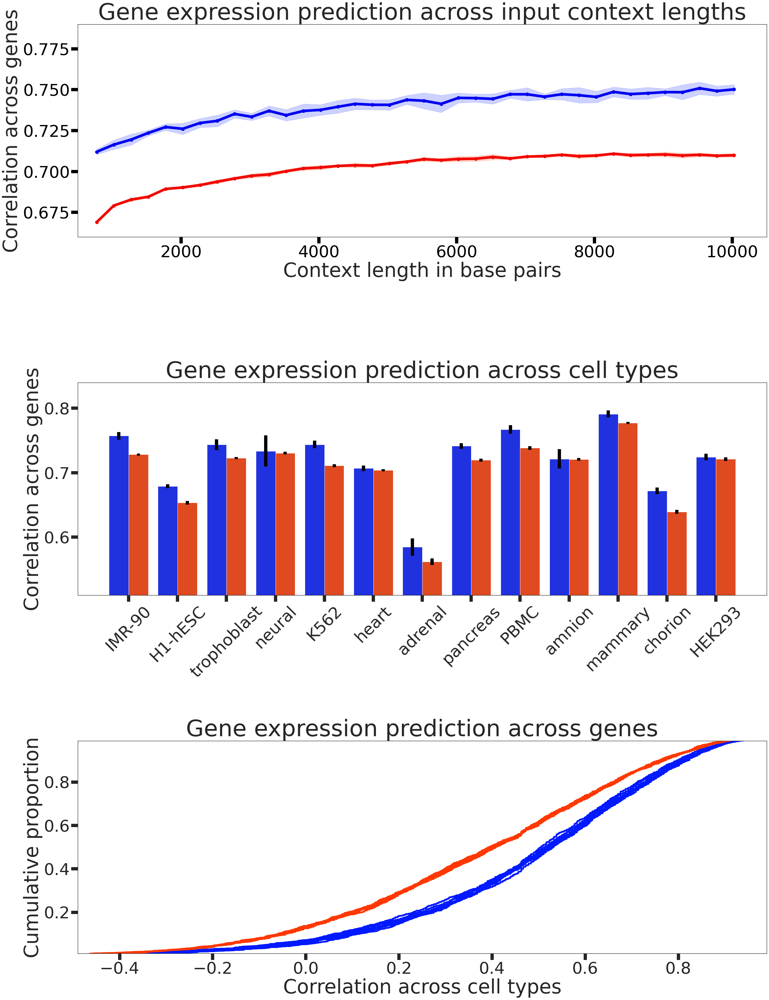

In [59]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 40))
fig.tight_layout(pad=1, w_pad=0, h_pad=35)    

# Figure 3a
ax = axes[0]

# plt.rcParams["figure.figsize"] = (30, 10)
colors = plt.cm.jet(np.linspace(0.1, 0.9, 2))
fill_colors = plt.cm.jet(np.linspace(0.15, 0.85, 2))
for i, model_type in enumerate(["maxpool", "linear"]):
    y_means = [x[1] for x in sc_dict[model_type]]
    y_lower = [x[1] - x[2] for x in sc_dict[model_type]]
    y_upper = [x[1] + x[2] for x in sc_dict[model_type]]
    
    ax.plot([25*x for x in list(range(31, 402, 10))], y_means, 'o-', color=colors[i], markersize=10, linewidth=8, label=model_type_rename_dict[model_type])
    ax.fill_between([25*x for x in list(range(31, 402, 10))], y_lower, y_upper, color=fill_colors[i], alpha = 0.2)
    ax.set_xlim(500, 10500)
    ax.set_ylim(0.66, 0.79)
    ax.set_xlabel("Context length in base pairs", fontsize=60)
    ax.set_ylabel("Correlation across genes", fontsize=60)
    ax.tick_params(axis='x', which='major', labelsize=50, rotation=0, width=10, size=20, colors="black")
    ax.tick_params(axis='y', which='major', labelsize=50, width=10, size=20, colors="black")
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

ax.set_title("Gene expression prediction across input context lengths", fontsize=70)
# plt.legend(loc="lower center", ncol=2, fontsize=50)

# plt.savefig("Figure_3a.pdf", dpi=200, bbox_inches = 'tight')
# plt.show()
# plt.close()


# Figure 3b
ax = axes[1]

# sns.set(style="white")
# plt.rcParams.update({'figure.autolayout':True})
# fig, ax = plt.subplots(figsize=(30, 16))
# df_results.plot.bar(x='cell_type', ax=ax)
sns.set_palette(sns.color_palette(plt.cm.jet(np.linspace(0.15, 0.85, 2))))
g = sns.barplot(x='cell_type_short_name', y='spearman_mean', hue='model', data=df_results, ax=ax)
g.legend_.remove()

ax.set_ylim(0.51, 0.84)
ax.set_xlabel("", fontsize=40)
ax.set_ylabel("Correlation across genes", fontsize=60)
ax.tick_params(axis='x', which='major', labelsize=50, rotation=45, width=10, size=20)
ax.tick_params(axis='y', which='major', labelsize=50, width=10, size=20)
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

# plt.legend(loc='upper center', ncol=2, fontsize=50)
ax.set_title("Gene expression prediction across cell types", fontsize=70)

x_coords = [p.get_x() + 0.5*p.get_width() for p in ax.patches]
y_coords = [p.get_height() for p in ax.patches]
y_err = [sd_dict[y] for y in y_coords]
ax.errorbar(x=x_coords, y=y_coords, yerr=y_err, fmt="o", c="black", linewidth=10)

# fig.savefig("Figure_3b.pdf", dpi=200, bbox_inches = 'tight')
# plt.show()
# plt.close()


# Figure 3c
ax = axes[2]

# Is there a model-independent way of showing the source of this difference between cell types
# Compare between cell types using some metric (perhaps correlation; or pca?) and show that adrenal gland is an outlier

# In addition, we also create CDFs of spearmans for genes across cell types in all four of these models with error bars
leg = ""
for replicate in tqdm(range(1, 11)):

    transcript_sc_dict = {}
    transcript_results_dict = {}

    for model_type in ["maxpool", "linear"]:
        transcript_sc_dict[model_type] = {}
        yTrue = {}
        yPred = {}

        f_name = "../../../old_slow_Logs/manuscript.R11.cross_cell_type_correlation.replicate_"+str(replicate)+"_0_transcriptome_401_5_32_"+model_type+"_mse_1_-1.testing_metrics.tsv"
        f_results = open(f_name, 'r')
        for line in f_results:
            vec = line.rstrip("\n").split("\t")
            transcript = vec[4]
            if(transcript in yTrue):
                yTrue[transcript].append(float(vec[5]))
                yPred[transcript].append(float(vec[6]))
            else:
                yTrue[transcript] = [float(vec[5])]
                yPred[transcript] = [float(vec[6])]

        f_results.close()
        for transcript in list(yTrue.keys()):                
            sc = spearmanr(yTrue[transcript], yPred[transcript])[0]

            if(transcript in transcript_sc_dict[model_type]):
                transcript_sc_dict[model_type][transcript].append(sc)
            else:
                transcript_sc_dict[model_type][transcript] = [sc]

        transcript_results_dict[model_type_rename_dict[model_type]] = []
        for transcript in list(transcript_sc_dict[model_type].keys()):
            mean_value = np.mean(transcript_sc_dict[model_type][transcript])

            # There are some genes with 0 correlation due to most yTrue being 0s: ignore them
            if(mean_value == 0):                
                # print(transcript, transcript_sc_dict[model_type][transcript],
                #       yTrue[transcript], yPred[transcript])
                continue
            
            transcript_results_dict[model_type_rename_dict[model_type]].append(mean_value)
            
    # transcript_sc_dict
    # transcript_results_dict

#     if(replicate == 2):
#         leg = plt.legend(loc='upper center', ncol=2, fontsize=60)
#         for legobj in leg.legendHandles:
#             legobj.set_linewidth(20)

#     plt.rcParams["figure.figsize"] = (30, 10)
#     sns.set_style('white')
    sns.set_palette(sns.color_palette(plt.cm.jet(np.linspace(0.15, 0.85, 2))))
    for k in list(transcript_results_dict.keys()):
        sns.ecdfplot(np.array(transcript_results_dict[k]), linewidth=5, label=k)

    
ax.set_xlim(-0.49, 0.99)
ax.set_ylim(0.01, 0.99)
ax.set_xlabel("Correlation across cell types", fontsize=60)
ax.set_ylabel("Cumulative proportion", fontsize=60)
ax.tick_params(axis='x', which='major', labelsize=50, rotation=0, width=10, size=20)
ax.tick_params(axis='y', which='major', labelsize=50, width=10, size=20)
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

ax.set_title("Gene expression prediction across genes", fontsize=70)

plt.savefig("Figure_3.pdf", dpi=400, bbox_inches = 'tight')
plt.show()
plt.close()




In [2]:
# Up until here use the python3.6 kernel and then switch over to the python3.6-tf1.12 kernel and import below
from tensorflow.keras.models import load_model
import sys
sys.path.insert(1, '../../../Code/deepENCODE/')
from chrmt_inference import perturb_x
from tensorflow.keras import backend as K

100%|██████████| 100/100 [00:23<00:00,  4.19it/s]


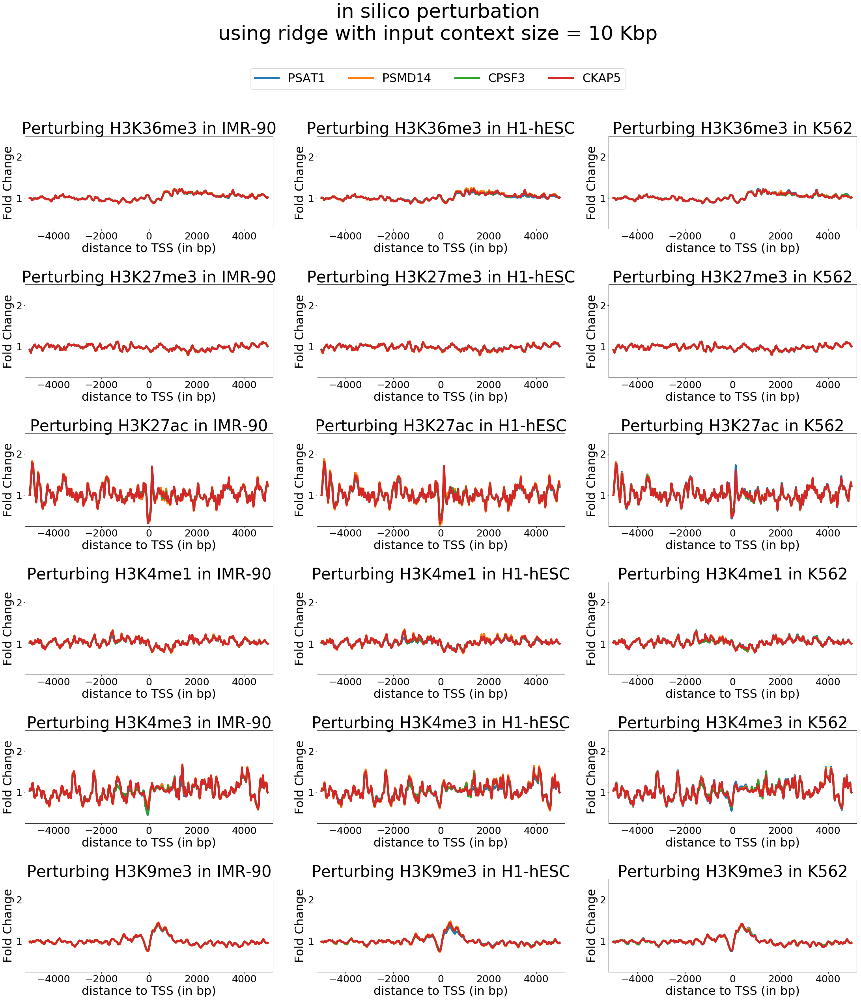

In [34]:
# For Figure 3, the goal is to gain an understanding of what the models have learnt by perforing in silico perturbations on each assay

num_rows = 6
num_cols = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 30), sharey=False, sharex=False)
fig.tight_layout(pad=1, w_pad=8, h_pad=12)

transcript_list = ["ENST00000376588.3", "ENST00000409682.7", "ENST00000238112.7", "ENST00000312055.9"]
gene_list = ["PSAT1", "PSMD14", "CPSF3", "CKAP5"]

# transcript_list = ["ENST00000233146.6", "ENST00000040877.1", "ENST00000347703.7", "ENST00000497473.5", "ENST00000259477.6", "ENST00000371208.3", "ENST00000295304.4"]

max_dict = {'H3K36me3':2, 'H3K27me3':10, 'H3K27ac':100, 'H3K4me1':10, 'H3K4me3':200, 'H3K9me3':3}

for idx, perturbed_assay_index in enumerate(range(6)):

    cell_type_index_dict = {0:-13, 1:-12, 2:-9}
    
    for jjj, cell_type in enumerate(special_cell_types):
        
        for iiii, model_type in enumerate(["linear"]):

#             idx_x, idx_y = convert_to_2D(idx, nrows=num_rows, ncols=num_cols)
    #         print(idx, idx_x, idx_y)
            idx_x = idx
            idx_y = jjj
            ax = axes[idx_x, idx_y]

    #         ax = axes[perturbed_assay_index, iiii]

            inserted_peak_width = 6
            gaussian_bandwidth = None
            inserted_scalar = 2500 
            maximum_inserted_minuslog10_p_value = max_dict[assays[perturbed_assay_index]]

            nucleosome_lambda = None
            stranded_MNase_offset = 0

            ise_radius = 200
            bin_wrt_tss_choices = list(range(-ise_radius, ise_radius)) # region where we perform ISE

            for transcript_index in np.arange(len(transcript_list)):

                transcript = transcript_list[transcript_index]
                gene = gene_list[transcript_index]

                epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type_index_dict[jjj])+".npy")
                TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type_index_dict[jjj])+".TPM.npy")) - 1)[0][0]    

    #             MNase = np.expm1(epigenetic_features[0, :, -1]) # after the expm1, the MNase is now coverage

    #             min_MNase = np.min(MNase)
    #             max_MNase = np.max(MNase)            

                for context_size in [401]: #  81, 161, 241, 321, list(num_layers_dict.keys())[16:]:
                    half_window = context_size // 2

                    num_layers = num_layers_dict[context_size]

                    fold_change_dict = {}
                    native_TPM_list = []

                    for replicate in tqdm(range(1, 101, 1), position=0, leave=True):

                        K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                        trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                        key = (model_type, transcript, context_size)

                        fold_change_list = []

                        predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # This is 200 because of the size of the loaded epigenetic features numpy array

                        for bin_wrt_tss in bin_wrt_tss_choices:
                            perturbed_epigenetic_features = perturb_x(epigenetic_features, bin_wrt_tss, inserted_peak_width, inserted_scalar, stranded_MNase_offset, maximum_inserted_minuslog10_p_value, gaussian_bandwidth, nucleosome_lambda, 0, 1, "False", "False", "False", "True", perturbed_assay_index)
                            predicted_log10p1_TPM = trained_model.predict(perturbed_epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0] # Same reason for 200, as above
                            predicted_TPM = np.power(10, predicted_log10p1_TPM) - 1
                            fold_change_list.append(predicted_TPM / predicted_native_TPM)
    #                     native_TPM_list.append(predicted_native_TPM)

                        if(key in fold_change_dict):
                            fold_change_dict[key].append(fold_change_list)
                        else:
                            fold_change_dict[key] = [fold_change_list]

        #                 # Visualize epigenetic tracks before and after perturbation 
        #                 if(model_type == "linear"):
        #                     ax.plot(range(-40, 40 + 1), np.expm1(epigenetic_features[0, 200-40:200+40+1, perturbed_assay_index]), '-', linewidth=3)
        #                 else:
        #                     print(bin_wrt_tss, perturbed_assay_index, maximum_inserted_minuslog10_p_value)
        #                     ax.plot(range(-40, 40 + 1), np.expm1(perturbed_epigenetic_features[0, 200-40:200+40+1, perturbed_assay_index]), '-', linewidth=3)                        

                    mean_fold_change_list = np.mean(fold_change_dict[key], axis=0)
        #             mean_fold_change_list = [(x - np.amin(fold_change_dict[key])) / (np.amax(fold_change_dict[key]) - np.amin(fold_change_dict[key])) for x in mean_fold_change_list]
                    stdev_fold_change_list = np.std(fold_change_dict[key], axis=0)

                    mean_native_TPM = np.mean(native_TPM_list)
                    stdev_native_TPM = np.std(native_TPM_list)

                    ax.plot([RESOLUTION * x for x in bin_wrt_tss_choices], mean_fold_change_list, '-', linewidth=5
                             ,label=gene
            #                   ,label=str(context_size)+"_"+str(inserted_peak_width)+"_"+str(inserted_lnp1_minuslog10_p_value)
                            )

        #             y_lower = [x[0] - x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]
        #             y_upper = [x[0] + x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]

        #             plt.fill_between([RESOLUTION * x for x in bin_wrt_tss_choices], y_lower, y_upper, alpha = 0.2, label='')

                    ax.set_xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
                    ax.set_ylim(0.25, 2.5)
            #         plt.ylim(0.5, 2)

    #         ax.set_yticklabels([100, 150])    
            ax.tick_params(axis='x', labelrotation=0, labelsize=25)
            ax.tick_params(axis='y', labelrotation=0, labelsize=25)
            ax.set_ylabel("Fold Change", fontsize=30)
            ax.set_xlabel("distance to TSS (in bp)", fontsize=30)

    #         ax.legend(loc="upper center", ncol=4, fontsize=30)
            ax.set_title("Perturbing " + assays[perturbed_assay_index] + " in " + cell_type_names[cell_type]
    #                      + " with " + str(model_type_rename_dict[model_type]) + " and " +
    #                      str( int( ((context_size-1) * RESOLUTION / 1000) ) ) + "Kb context"
                          , fontsize=40)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, labels, loc = 'upper center', ncol=5, bbox_to_anchor = (0, 0.08, 1, 1), fontsize=30,
            bbox_transform = plt.gcf().transFigure )

fig.suptitle("in silico perturbation\nusing " + str(model_type_rename_dict[model_type]) +
             " with input context size = " + str( int( ((context_size-1) * RESOLUTION / 1000) ) ) + " Kbp",
             fontsize=50,  y=1.15)
fig.savefig("Figure_3.updated.linear.pdf", dpi=fig.dpi, bbox_inches = 'tight')

plt.show()
plt.close()

100%|██████████| 475/475 [00:00<00:00, 482.21it/s]


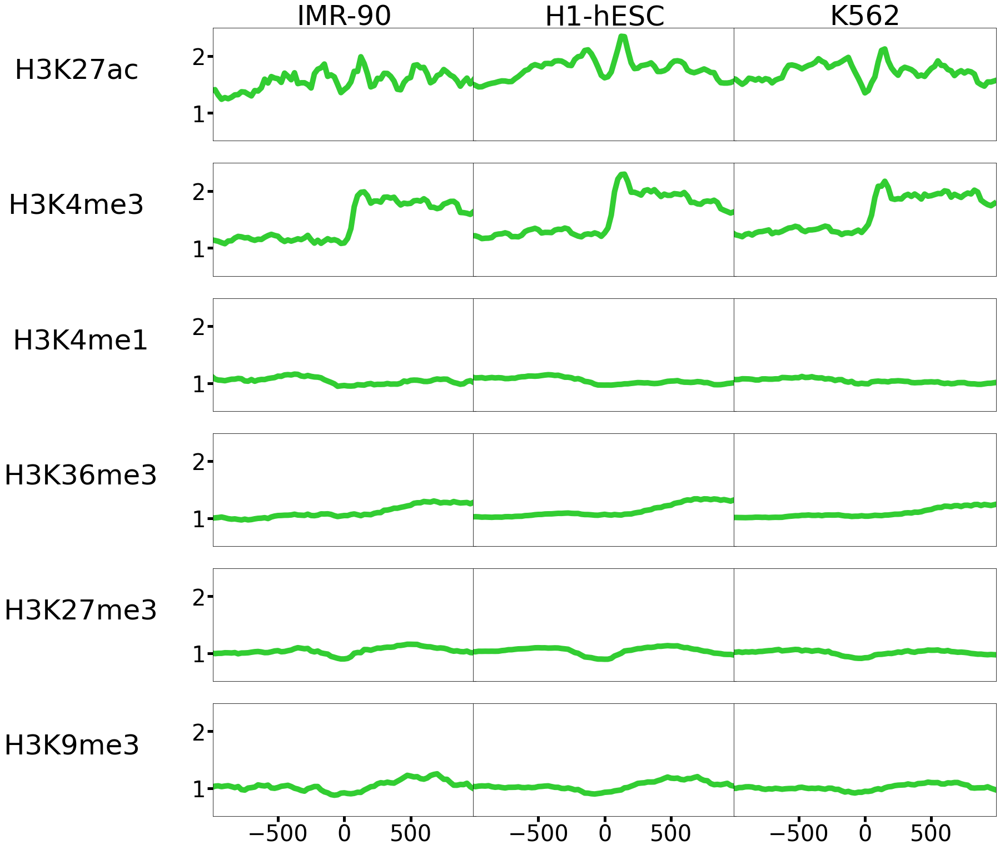

In [54]:
# We precomputed the perturbations for lots of genes for the 3 cell types and all 6 assays
with open('../../../Logs/Figure_3_475_gene_ISE_data/transcript_names.txt') as f_transcript_names:
    transcript_names = [line.rstrip('\n') for line in f_transcript_names]

perturbation_dict = {}

for ct in ["T01", "T02", "T05"]:
    for assay_number in range(6):
        perturbation_list = []
        for t in tqdm(transcript_names):
            x = np.load("../../../Logs/Figure_3_475_gene_ISE_data/" + t + "." + ct + "." + str(assay_number) + ".npy")
            perturbation_list.append(x)

        mean_perturbation = np.mean(perturbation_list, axis=0)
        stdev_perturbation = np.std(perturbation_list, axis=0)
        
        assert( (mean_perturbation.shape[0], stdev_perturbation.shape[0]) == (80, 80) )
        
        perturbation_dict[(ct, assay_number)] = (mean_perturbation, stdev_perturbation)
        
perturbation_dict

xticklabels = [RESOLUTION*x for x in range(-40, 40)]

num_rows = 6
num_cols = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 20), sharex='col', sharey='row')
fig.tight_layout(pad=0, w_pad=-2, h_pad=3)    

colors = plt.cm.gist_rainbow(np.linspace(0, 1, 18))        

ci = 0
for idx_x, assay_number in enumerate([2, 4, 3, 0, 1, 5]):        
    for idx_y, ct in enumerate(["T01", "T02", "T05"]):
        
        ax = axes[idx_x, idx_y]
        ax.plot(xticklabels, perturbation_dict[(ct, assay_number)][0], linewidth=10, color="limegreen") # colors[ci])
        ci += 1
        ax.set_xlim(-990, 990)
        ax.set_ylim(0.51, 2.49)

        ax.tick_params(axis='x', which='major', labelsize=40, width=5, size=10)
        ax.tick_params(axis='y', which='major', labelsize=40, width=5, size=10)

        if( (idx_y == 0) and (idx_x < 5) ):
            ax.xaxis.set_ticks_position('none')
        elif( (idx_y == 0) and (idx_x == 5) ):
            pass
        elif( (idx_y > 0) and (idx_x < 5) ):
            ax.xaxis.set_ticks_position('none')
            ax.yaxis.set_ticks_position('none')
        elif( (idx_y > 0) and (idx_x == 5) ):
            ax.yaxis.set_ticks_position('none')
        
        
#         ax.set_xlabel("Position (in bp) w.r.t TSS", size=15)
#         ax.set_ylabel("-log10(p-value)", size=15)

column_headers=["IMR-90", "H1-hESC", "K562"]
row_headers=["H3K27ac                          ", 
             "H3K4me3                          ", 
             "H3K4me1                         ", 
             "H3K36me3                         ", 
             "H3K27me3                         ", 
             "H3K9me3                           "]

for ax, col in zip(axes[0], column_headers):
    ax.set_title(col, fontsize=50)

for ax, row in zip(axes[:,0], row_headers):
    ax.set_ylabel(row, rotation=0, fontsize=50, labelpad=0)    

handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper center', prop={'size': 10}, ncol=2)
fig.suptitle("", fontsize=50,  y=1.08)
fig.savefig("Figure_4.pdf", dpi=200, bbox_inches = 'tight')
plt.show()
plt.close()


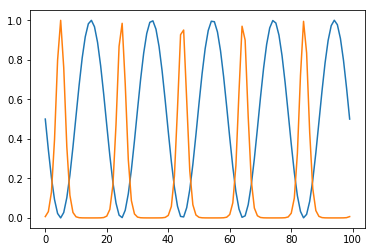

In [3]:
x = (np.sin(np.linspace(-5*np.pi,5*np.pi,100)) + 1) / 2
y = np.exp(-10 * x)
plt.plot(x)
plt.plot(y)
plt.show()

In [2]:
# Figure 5 perturbs H3K27ac in silico, to model CRISPRa epigenome editing experiments
# The perturbation function is parametrized by the following parameters:
# a gaussian kernel centered at the gRNA target site with a bandwidth ( = 2 * \sigma)
# the inserted p-value
# the maximum inserted p-value
# nucleosome lambda determining how much we multiply the 
# We create a pipeline to predict the correlation with Alan's data (near the TSS within +-250bp)
# And analyze if we can overfit to what the perturbation should be like?



In [2]:
! pip install --user pyranges

  Using cached https://files.pythonhosted.org/packages/a9/76/0f624b7326f4458a249580c55e5654756084ec4572ce37a05f799b96bc24/natsort-8.1.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/92/4e/e5a13fdb3e6f81ce11893523ff289870c87c8f1f289a7369fb0e9840c3bb/tabulate-0.8.10-py3-none-any.whl
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


  0%|          | 0/100 [00:00<?, ?it/s]

CXCR4 0 40000


100%|██████████| 100/100 [11:34<00:00,  6.94s/it]
No handles with labels found to put in legend.
10 64
10 57
10 54
10 -17
10 -21
10 -27
10 -32
10 -36
10 -48
10 74
10 60
10 43
10 23
10 18
10 -19
10 -41
10 -28
10 -77


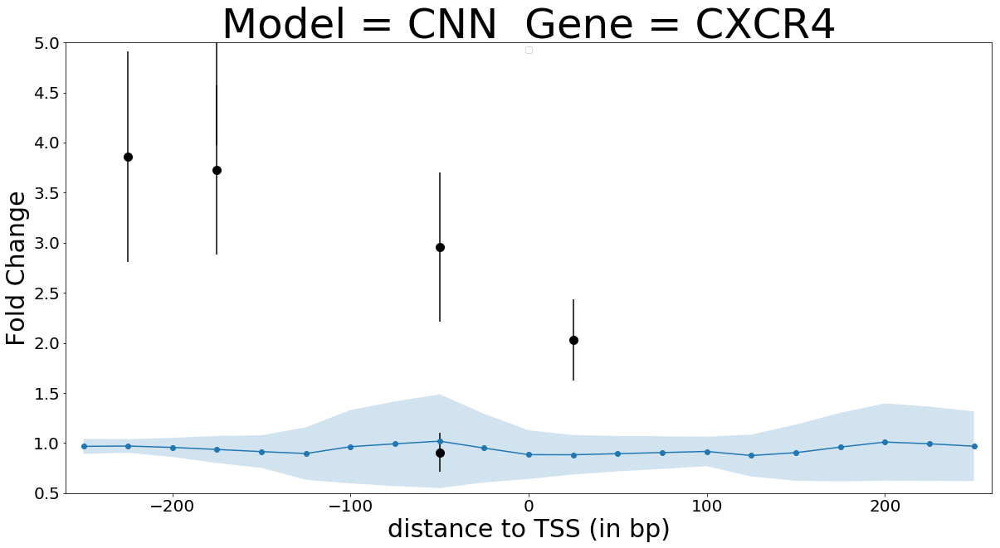

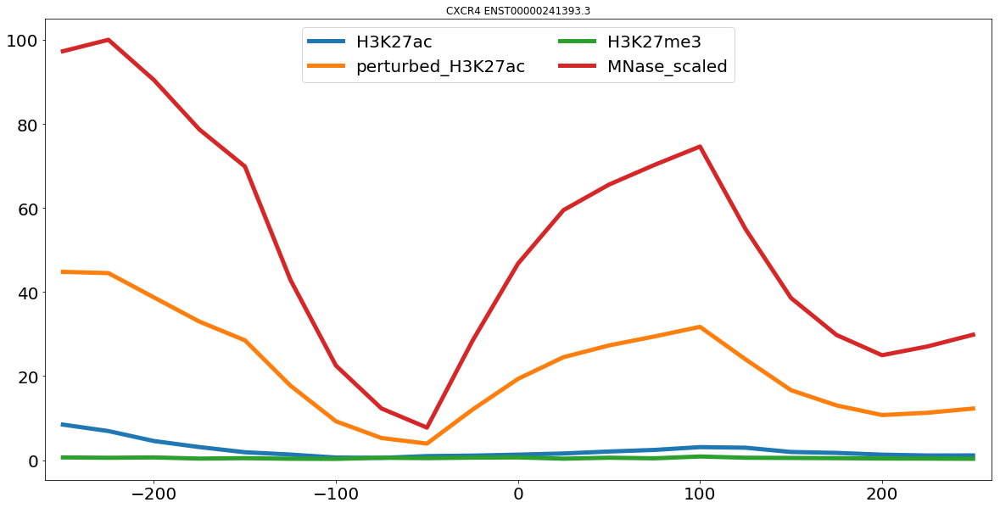

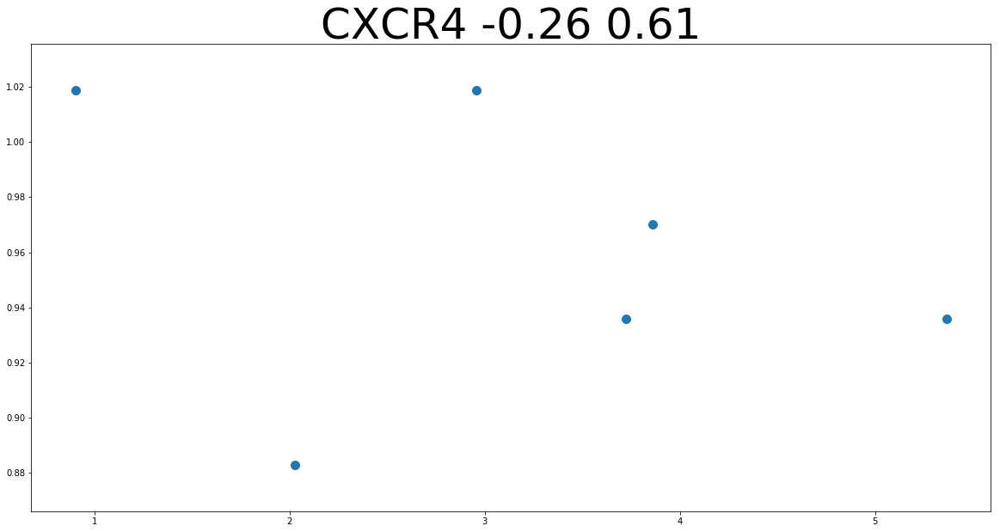

  0%|          | 0/100 [00:00<?, ?it/s]

TGFBR1 0 40000


100%|██████████| 100/100 [11:33<00:00,  6.93s/it]
No handles with labels found to put in legend.
10 -19
10 -20
10 -20
10 -25
10 -25
10 -30
10 -31
10 -41
10 75
10 58
10 41
10 -16
10 -40
10 -77
10 18
10 15
10 13
10 11


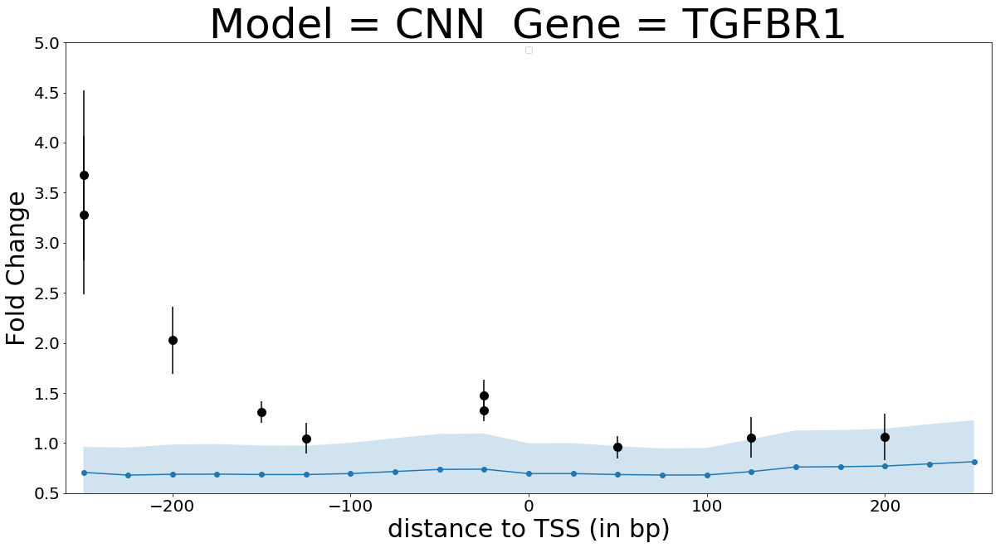

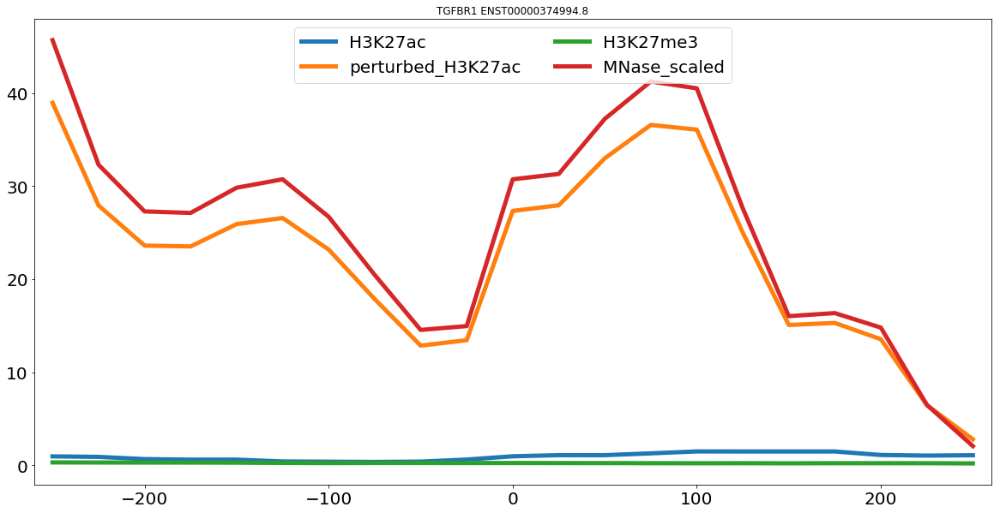

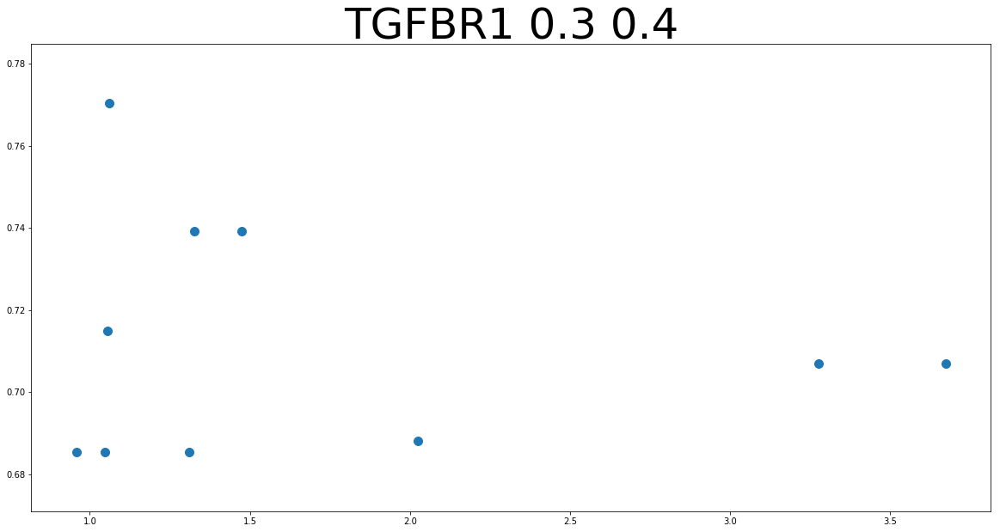

  0%|          | 0/100 [00:00<?, ?it/s]

C2CD4B 0 40000


100%|██████████| 100/100 [11:30<00:00,  6.91s/it]
No handles with labels found to put in legend.


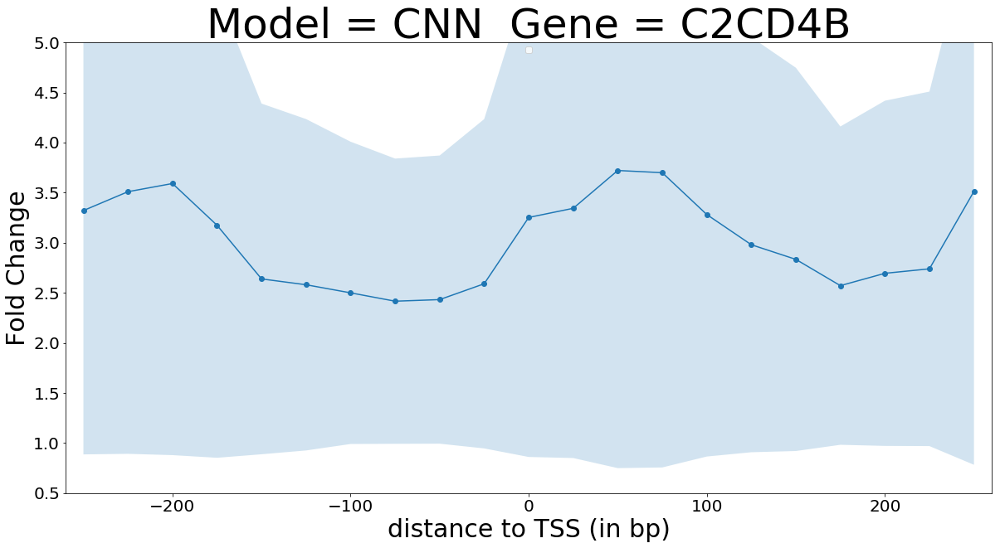

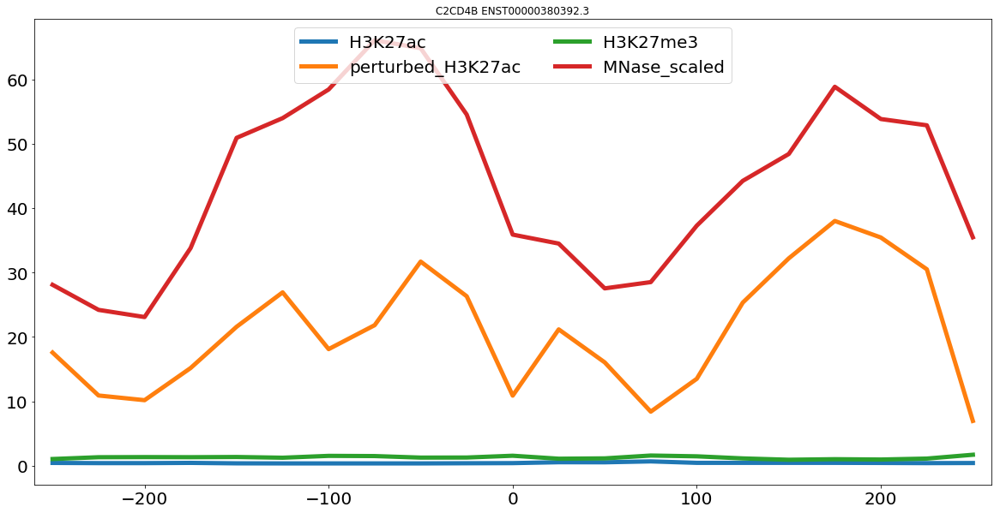

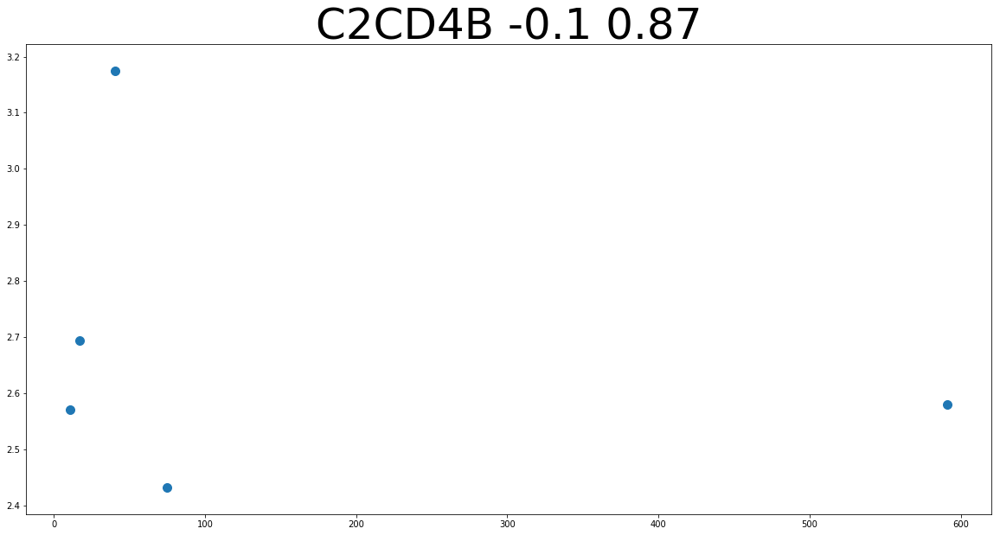

  0%|          | 0/100 [00:00<?, ?it/s]

CD79A 0 40000


100%|██████████| 100/100 [11:24<00:00,  6.85s/it]
No handles with labels found to put in legend.


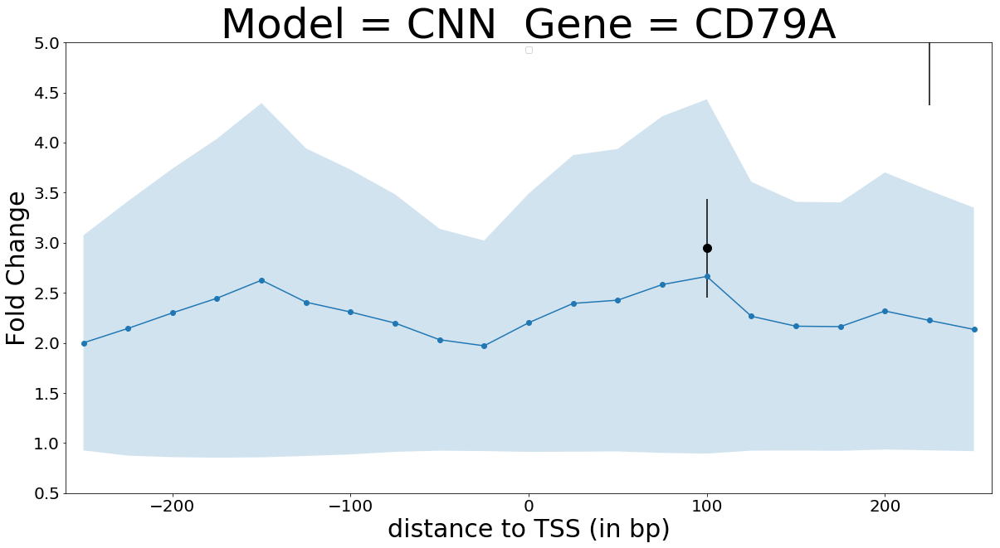

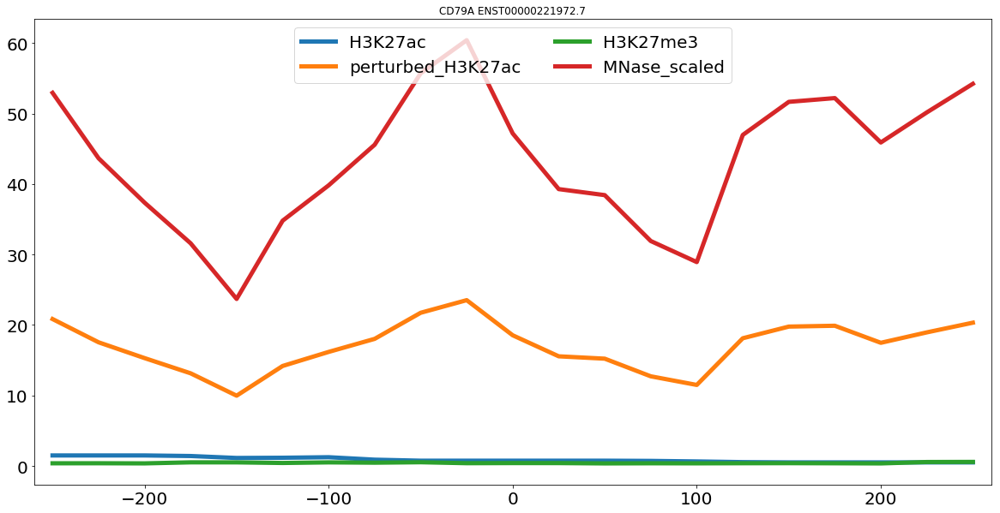

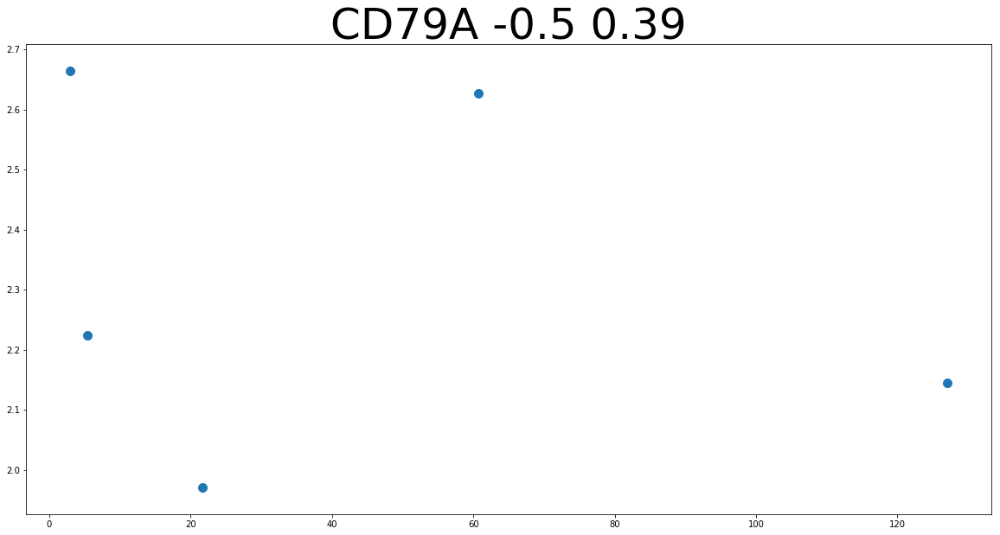

  0%|          | 0/100 [00:00<?, ?it/s]

CYP17A1 0 40000


100%|██████████| 100/100 [11:39<00:00,  6.99s/it]
No handles with labels found to put in legend.


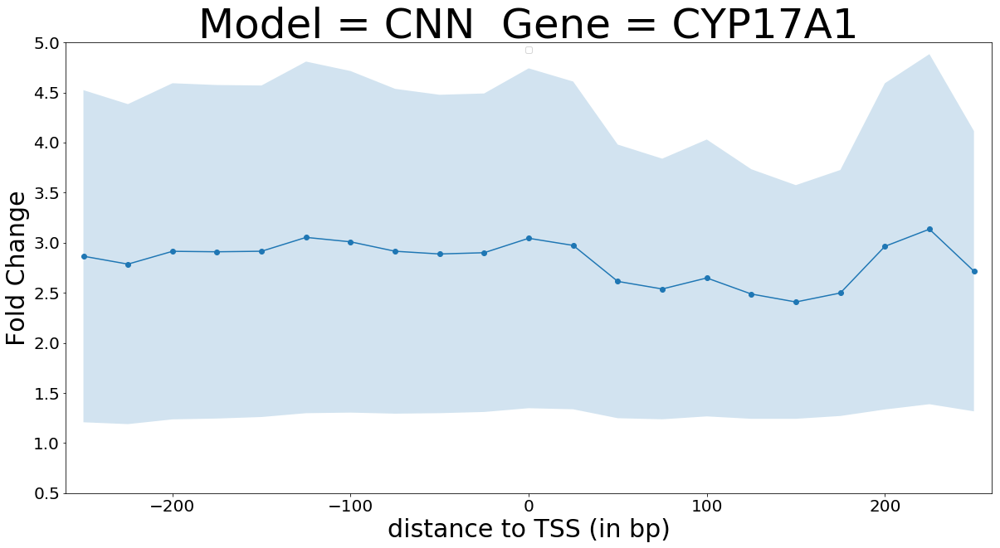

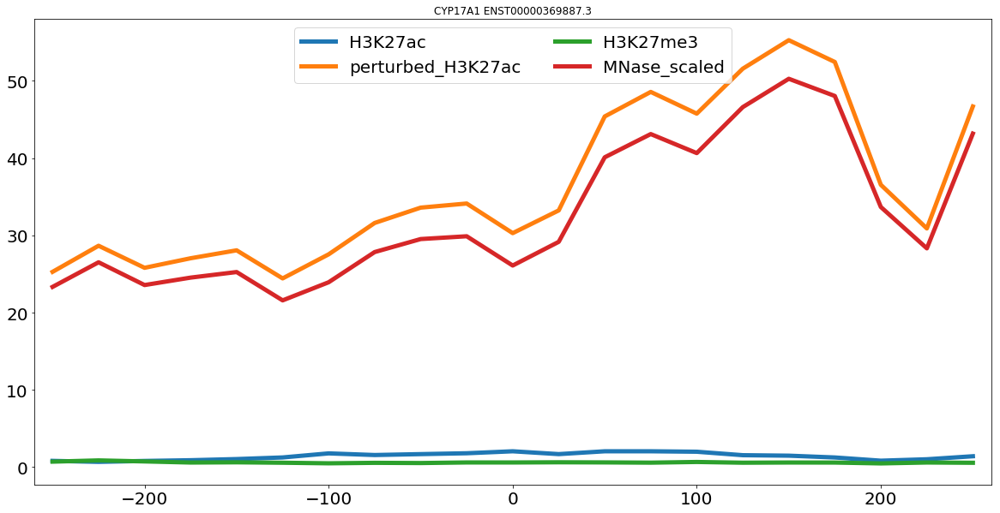

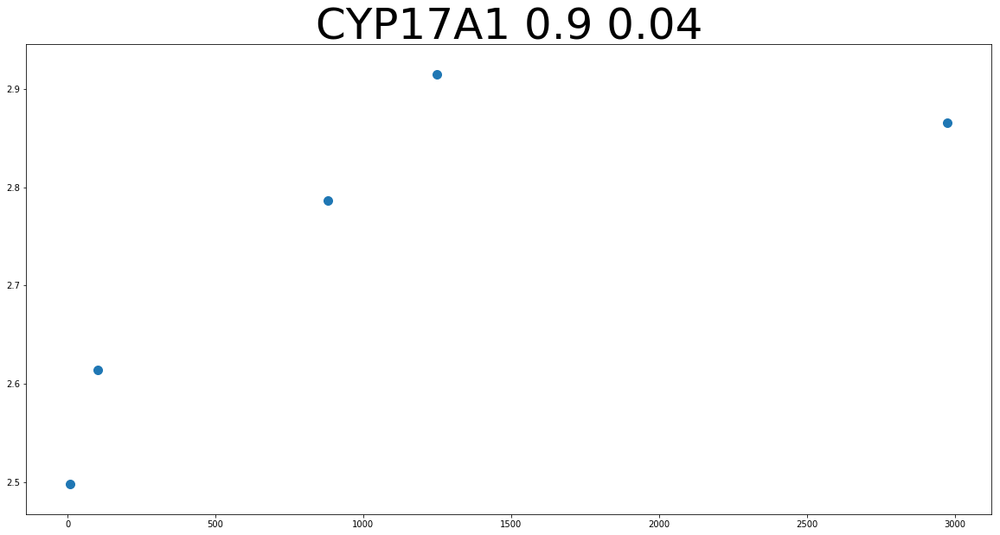

  0%|          | 0/100 [00:00<?, ?it/s]

MYO1G 0 40000


100%|██████████| 100/100 [11:51<00:00,  7.11s/it]
No handles with labels found to put in legend.


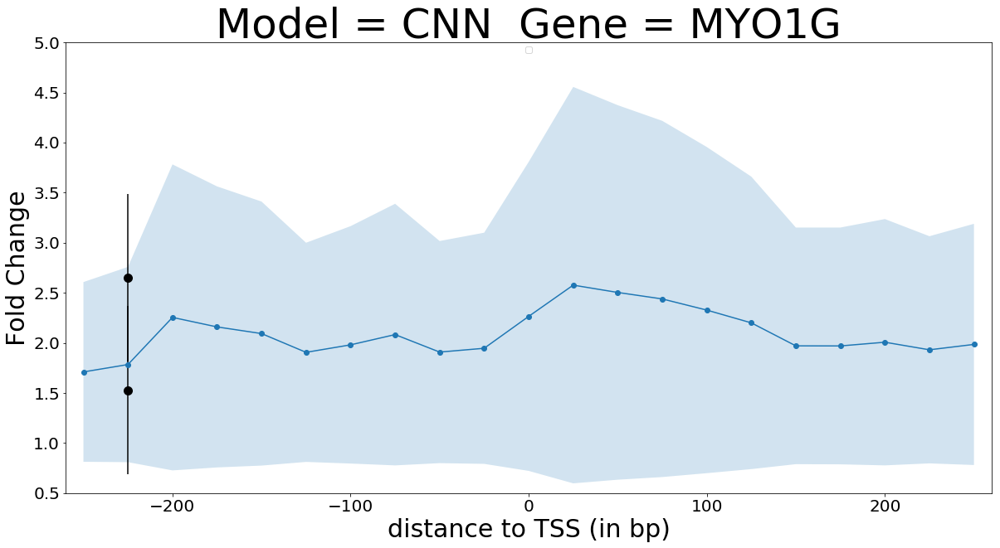

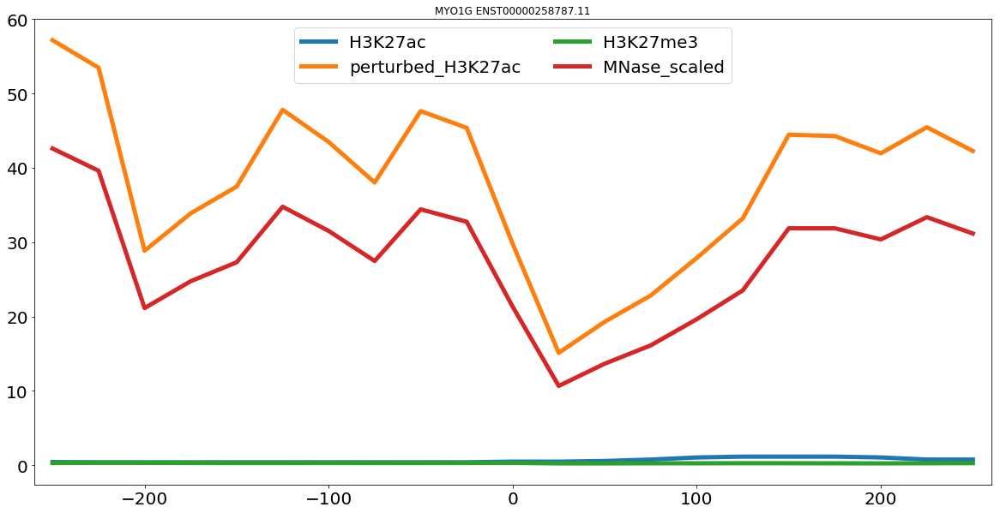

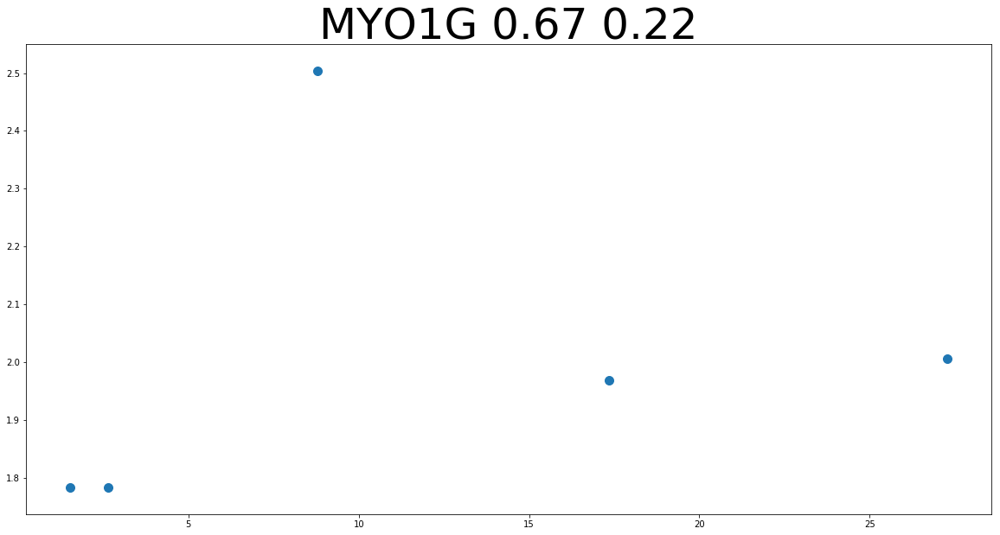

  0%|          | 0/100 [00:00<?, ?it/s]

PRSS12 0 40000


100%|██████████| 100/100 [11:51<00:00,  7.12s/it]
No handles with labels found to put in legend.


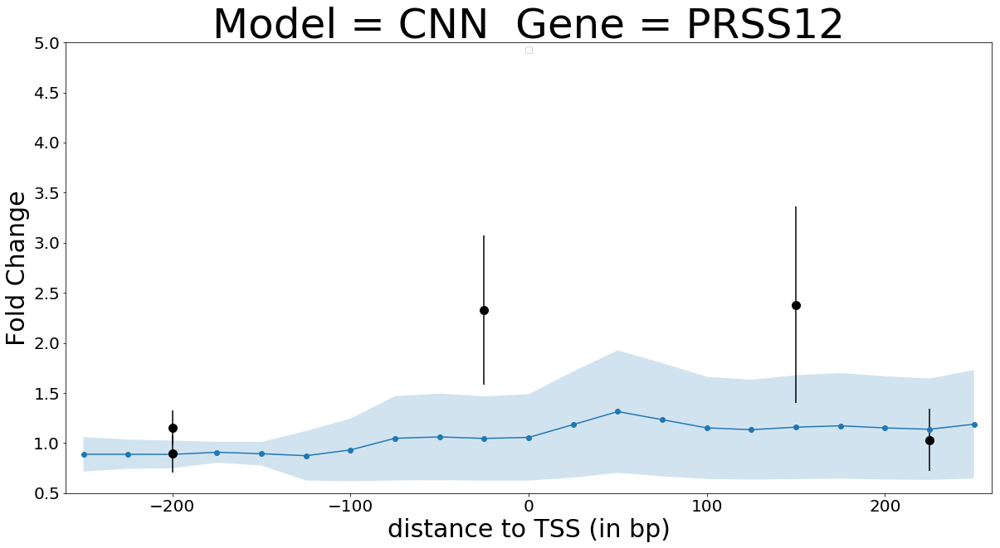

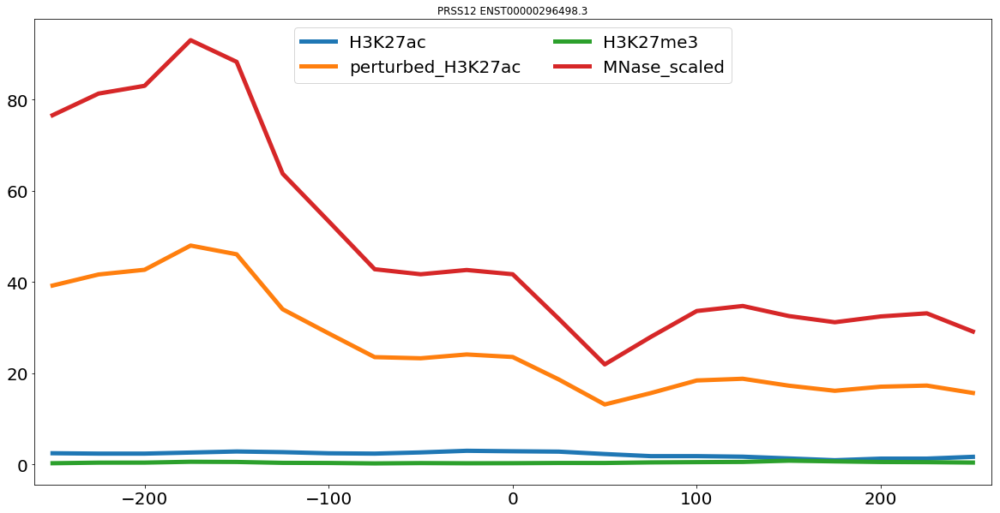

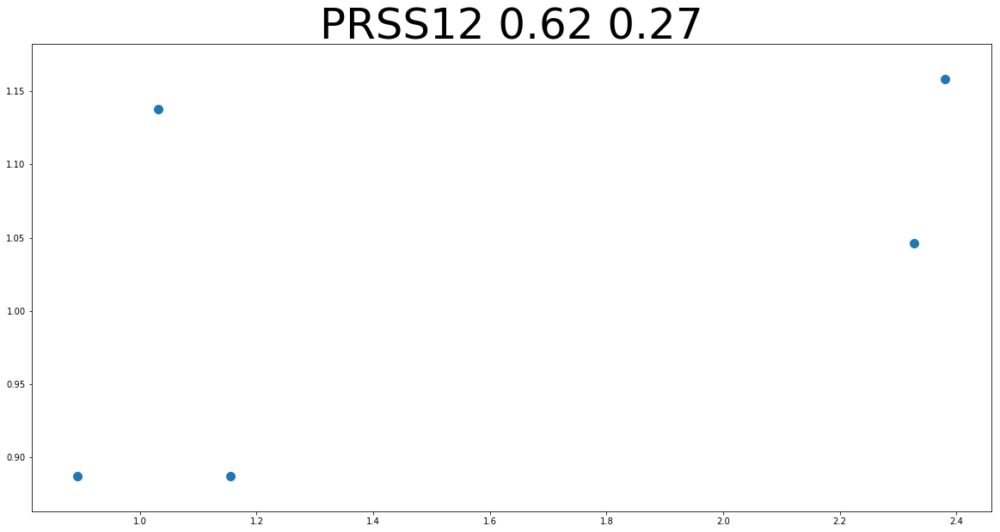

  0%|          | 0/100 [00:00<?, ?it/s]

SOX11 0 40000


100%|██████████| 100/100 [11:47<00:00,  7.07s/it]
No handles with labels found to put in legend.


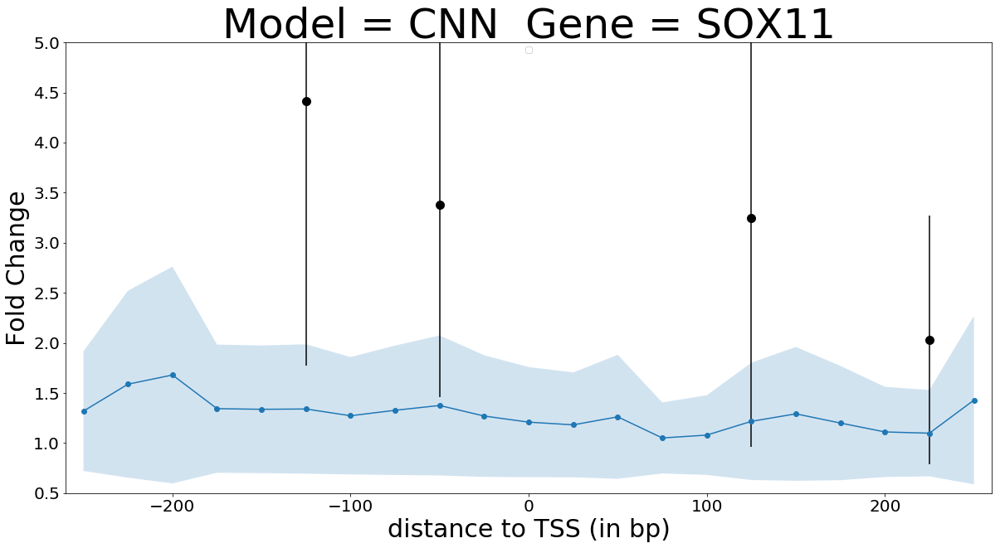

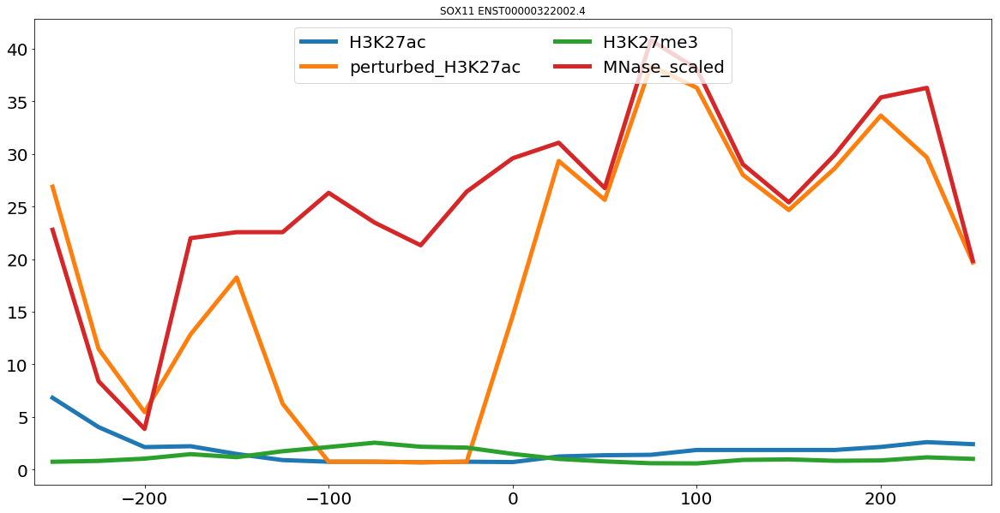

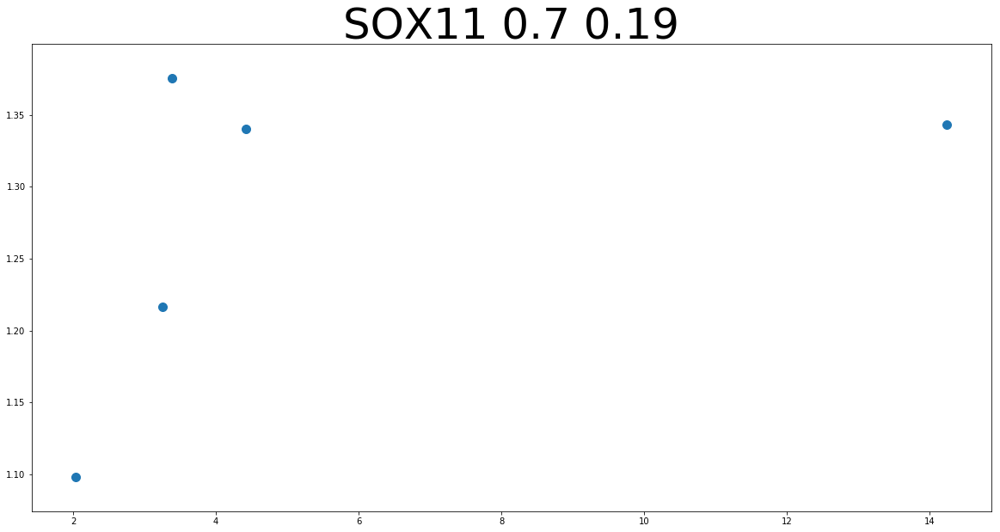

In [10]:
# Set plotting parameters
plt.rcParams["figure.figsize"] = (20, 10)
plt.gca().set_prop_cycle(None)


# First read Alan's data from the Google spreadsheet
sheet_name = "2kb_p300_Alan_Cabrera_epigenome_editing_dataset"
sheet_ID = "1rgbxJHon8Z6-Ke9hAK_uUzuR27SIZx8J5cZyz_jN2a8"
sheet_url = f"https://docs.google.com/spreadsheets/d/{sheet_ID}/gviz/tq?tqx=out:csv&sheet={sheet_name}"
df_p300 = pd.read_csv(sheet_url)

# Load Alan's data into a dict
p300_dict = {}

for gene in list(set(list(df_p300["p300 target gene"]))):
    p300_dict[gene] = {}
    for i in range(len(df_p300)):
        if(df_p300.iloc[i, 0] == gene):
            transcript = df_p300.iloc[i, 1]
            gRNA_ID = df_p300.iloc[i, 5]
            gRNA_bin_wrt_tss = int(df_p300.iloc[i, 14]) // RESOLUTION            
            measured_fold_change = float(df_p300.iloc[i, 6])
            
#             # Only consider bins within +-250bp of the TSS ########################################## CAREFUL
#             if(abs(gRNA_bin_wrt_tss) > 10):
#                 continue
            
            if((transcript, gRNA_ID, gRNA_bin_wrt_tss) in p300_dict[gene]):
                p300_dict[gene][(transcript, gRNA_ID, gRNA_bin_wrt_tss)].append(measured_fold_change)
            else:
                p300_dict[gene][(transcript, gRNA_ID, gRNA_bin_wrt_tss)] = [measured_fold_change]            


# Initialize some dicts
transcript_list = [
                   ("ENST00000241393.3", "CXCR4"),
                   ("ENST00000374994.8", "TGFBR1"),
                   ("ENST00000380392.3", "C2CD4B"),
                   ("ENST00000221972.7", "CD79A"),
                   ("ENST00000369887.3", "CYP17A1"),
                   ("ENST00000258787.11", "MYO1G"),
                   ("ENST00000296498.3", "PRSS12"),
                   ("ENST00000322002.4", "SOX11")
                  ]

# First thing we do is to load the MNase-seq data for each transcript and then visualize its distribution near the TSS of each gene
# We then estimate gene-specific normalization so that each gene's MNase data can be scaled to [0, 1]
# When performing the perturbation, we use this data as opposed to the raw MNase coverage. 
# This is because in the perturbation we want to scale amount of H3K27ac added, by P(nucleosome)

MNase_dict = {}
for transcript_index in np.arange(len(transcript_list)):

    transcript = transcript_list[transcript_index][0]
    gene = transcript_list[transcript_index][1]
    epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
    
    MNase = np.expm1(epigenetic_features[0, :, -1]) # after the expm1, the MNase is now coverage
    
    min_MNase = np.min(MNase)
    max_MNase = np.max(MNase)
    
    MNase_dict[gene] = (min_MNase, max_MNase)
    
    transformed_MNase = [(x - min_MNase) / (max_MNase - min_MNase) for x in MNase]
    
#     plt.plot(transformed_MNase)
# #     sns.kdeplot(x=MNase, fill=False, common_norm=False, palette="crest", alpha=.5, linewidth=3, cumulative=True)
# #     plt.ylim(0.8, 1.01)
#     plt.show()
#     plt.close()

ise_mean_fold_change_dict = {}
ise_stdev_fold_change_dict = {}

results_list = []

inserted_peak_width = 400
maximum_inserted_minuslog10_p_value = 100
nucleosome_lambda = 5
stranded_MNase_offset_choices = [0]
ise_radius = 10

inserted_scalar_choices = [40000]
gaussian_bandwidth = 40 

cross_gene_spearmans_list = []

for stranded_MNase_offset in stranded_MNase_offset_choices:
    for inserted_scalar in inserted_scalar_choices:        
        
        bin_wrt_tss_choices = list(range(-ise_radius, ise_radius+1)) # region where we perform ISE
        
        cross_gene_results_list = []
        
        # Then, for a particular transcript, we compute the ISE scores mean-ed across many models and compare with Alan's data
        for transcript_index in range(len(transcript_list)):
            
            for t_pair in [transcript_list[transcript_index]]:

                transcript = t_pair[0]
                gene = t_pair[1]

                key = (stranded_MNase_offset, inserted_scalar)
                print(gene, key[0], key[1])
                
                epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
                TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".TPM.npy")) - 1)[0][0]    
    #             print(epigenetic_features.shape, TPM)

                min_MNase = MNase_dict[gene][0]
                max_MNase = MNase_dict[gene][1]      
            
#                 print(gene, min_MNase, max_MNase)
    
                for model_type in ["maxpool"]:

                    for context_size in [401]: # list(num_layers_dict.keys())[16:]:
                        half_window = context_size // 2

                        num_layers = num_layers_dict[context_size]

                        fold_change_dict = {}
                        native_TPM_list = []

                        for replicate in tqdm(range(1, 101, 1)):  # [random.randint(1, 100)]):

                            K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                            trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                            fold_change_list = []

                            for bin_wrt_tss in bin_wrt_tss_choices:
                                perturbed_epigenetic_features = perturb_x(epigenetic_features, bin_wrt_tss, inserted_peak_width, inserted_scalar, stranded_MNase_offset, maximum_inserted_minuslog10_p_value, gaussian_bandwidth, nucleosome_lambda, min_MNase, max_MNase, "True", "True", "True", "True")
                                predicted_log10p1_TPM = trained_model.predict(perturbed_epigenetic_features[:, 200-half_window:200+half_window+1, :-1]) # This is 200 because of the size of the loaded epigenetic features numpy array
                                predicted_TPM = (np.power(10, predicted_log10p1_TPM) - 1)[0][0]
                                predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                                fold_change_list.append(predicted_TPM / predicted_native_TPM)
                            native_TPM_list.append(predicted_native_TPM)

#                             print("Here", context_size, gene, TPM, predicted_native_TPM)    
                                
                            if(key in fold_change_dict):
                                fold_change_dict[key].append(fold_change_list)
                            else:
                                fold_change_dict[key] = [fold_change_list]

                        mean_fold_change_list = np.mean(fold_change_dict[key], axis=0)
                        stdev_fold_change_list = np.std(fold_change_dict[key], axis=0)

                        mean_native_TPM = np.mean(native_TPM_list)
                        stdev_native_TPM = np.std(native_TPM_list)
                        
                        y_lower = [x[0] - x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]
                        y_upper = [x[0] + x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]

                        plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], mean_fold_change_list, 'o-')
#                                   label=str(context_size)+"_"+str(inserted_peak_width)+"_"+str(inserted_lnp1_minuslog10_p_value))
                        plt.fill_between([RESOLUTION * x for x in bin_wrt_tss_choices], y_lower, y_upper, alpha = 0.2, label='')

                        plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
                        plt.ylim(0.5, 5)

                        plt.xticks(fontsize=20)
                        plt.yticks(fontsize=20)    
                        plt.ylabel("Fold Change", fontsize=30)
                        plt.xlabel("distance to TSS (in bp)", fontsize=30)

                        plt.legend(loc="upper center", ncol=5)
                        plt.title("Model = " + str(model_type_rename_dict[model_type]) + "  Gene = " + str(gene), fontsize=50)

                        ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = (mean_fold_change_list, mean_native_TPM)
                        ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = (stdev_fold_change_list, stdev_native_TPM)

                        # Now we compare the model predictions w.r.t Alan's data

                        scatter_dict = {}                
                        scatter_dict[gene] = {}
                        scatter_dict[gene][model_type_rename_dict[model_type]] = []

                        max_fold_change = 1

                        for (transcript, gRNA, pos) in p300_dict[gene].keys():

                            # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore
                            if(abs(pos) > ise_radius):
                                print(ise_radius, pos, file=sys.stderr)
                                continue

                            fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]
                            mean_fold_change = np.mean(fold_change_list)
                            stdev_fold_change = np.std(fold_change_list)

                            plt.errorbar(x=RESOLUTION * pos, y=mean_fold_change, marker='o', markersize=10, yerr=stdev_fold_change, color="k")

                            if(mean_fold_change > max_fold_change):
                                max_fold_change = mean_fold_change

                            scatter_dict[gene][model_type_rename_dict[model_type]].append((mean_fold_change, ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][0][ise_radius + pos],
                                                                                           stdev_fold_change,
                                                                                           ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][1],
                                                                                           ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][0][ise_radius + pos],
                                                                                           ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][1],
                                                                                           gene, gRNA, pos))


                        plt.show()
                        plt.close()
                            
                            
                        # Then we overlay with the predictions from the models by creating a scatter plot and computing spearman
                        model_type_color_dict = {"linear":"red", "maxpool":"blue"}
                        mean_predictions = ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][0]
                        stdev_predictions = ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][0]

    #                     plt.errorbar(x=[RESOLUTION * x for x in range(-ise_radius, ise_radius)], y=[1.8 * x * max_fold_change for x in mean_predictions], yerr=[0.1 * x * max_fold_change for x in stdev_predictions], marker='o', color=model_type_color_dict[model_type], label=model_type_rename_dict[model_type])

    #                     Plot epigenetic features instead of model predictions
    #                     Load epigenetic features in HEK293T
                        epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
    #                     print(epigenetic_features.shape)
                        perturbed_epigenetic_features = perturb_x(epigenetic_features, 0, inserted_peak_width, inserted_scalar, stranded_MNase_offset, maximum_inserted_minuslog10_p_value, gaussian_bandwidth, nucleosome_lambda, min_MNase, max_MNase, "True", "True", "True", "True")

                        for assay_index in [2, 1, -1]:
                            if(assay_index == -1):
                                plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], [ (maximum_inserted_minuslog10_p_value) * (np.expm1(x) - min_MNase) / (max_MNase - min_MNase) for x in epigenetic_features[0, 200-ise_radius:200+ise_radius+1, assay_index]], '-', linewidth=5, label=assays[assay_index] + "_scaled")
                            else:
                                plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], [1 * np.expm1(x) * 1 for x in epigenetic_features[0, 200-ise_radius:200+ise_radius+1, assay_index]], '-', linewidth=5, label=assays[assay_index])

                            if(assay_index == 2):
                                plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], [1 * np.expm1(x) * 1 for x in perturbed_epigenetic_features[0, 200-ise_radius:200+ise_radius+1, assay_index]], '-', linewidth=5, label="perturbed_"+assays[assay_index])

                        plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
                        plt.xticks(fontsize=20)
                        plt.yticks(fontsize=20)
                        plt.title(gene + " " + transcript)
                        plt.legend(loc="upper center", fontsize=20, ncol=2)
                        plt.show()
                        plt.close()

                        scatter_x = [x[0] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]
                        scatter_y = [x[1] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]

                        plt.scatter(scatter_x, scatter_y, s=100)

                        sc, sp = spearmanr(scatter_x, scatter_y)
                        results_list.append([transcript, gene, round(key[0], 4), round(key[1], 4), model_type_rename_dict[model_type], round(sc, 2), round(sp, 2)])
    #     print(results_list)

                        plt.title(gene + " " + str(round(sc, 2)) + " " + str(round(sp, 2)), fontsize=50)
                        plt.show()
                        plt.close()

                        cross_gene_results_list.extend(scatter_dict[gene][model_type_rename_dict[model_type]])

        df_alan_predictions = pd.DataFrame(cross_gene_results_list, columns=["mean_qPCR", "mean_predicted_fold_change", "stdev_qPCR", "mean_predicted_endogenous_TPM", "stdev_predicted_fold_change", "stdev_predicted_endogenous_TPM", "gene", "gRNA", "bin_wrt_TSS"])

#         pred_values = []
#         pred_ranks = []
#         qpcr_ranks = []
#         qpcr_values = []
#         for gene in pd.unique(x.gene):
#             num_genes = (x.gene == gene).sum()
#             these_pred_ranks = x.loc[x.gene == gene, 'mean_predicted_fold_change'].rank()
#             these_pred_ranks -= np.mean(these_pred_ranks)
#             these_pred_ranks /= np.std(these_pred_ranks)
#             pred_ranks.extend([(gene, x) for x in these_pred_ranks])

#             pred_values.extend((gene, v) for v in x.loc[x.gene == gene, 'mean_predicted_fold_change'])

#             these_qpcr_ranks = x.loc[x.gene == gene, 'mean_qPCR'].rank()
#             these_qpcr_ranks -= np.mean(these_qpcr_ranks)
#             these_qpcr_ranks /= np.std(these_qpcr_ranks)
#             qpcr_ranks.extend([(gene, x) for x in these_qpcr_ranks])

#             qpcr_values.extend((gene, v) for v in x.loc[x.gene == gene, 'mean_qPCR'])
            
#         genes_list = [x[0] for x in pred_ranks]            
#         pred_values = [x[1] for x in pred_values]        
#         pred_ranks = [x[1] for x in pred_ranks] # np.array(pred_ranks).flatten()
#         qpcr_ranks = [x[1] for x in qpcr_ranks] # np.array(qpcr_ranks).flatten()
#         qpcr_values = [x[1] for x in qpcr_values]
    
#         cross_gene_spearmans_list.append((key, spearmanr(pred_ranks, qpcr_ranks))) 
                
#         colors = plt.cm.cool(np.linspace(0.0, 1.0, 8))
#         gene_2_index = {}
#         for i, x in enumerate(transcript_list):
#             gene_2_index[x[1]] = i

#         colors_list = [gene_2_index[gene] for gene in genes_list]    

#         sc_r, sp_r = spearmanr(qpcr_ranks, pred_ranks)
#         plt.scatter(qpcr_ranks, pred_ranks, s=100, c=colors_list)
#         plt.xlabel("qPCR ranks", fontsize=30)
#         plt.ylabel("model prediction ranks", fontsize=30)
#         plt.title("Spearman correlation = " + str(round(sc_r, 2)) + 
#                   " p-value = " + str(round(sp_r, 2)), fontsize=40)
#         plt.show()
#         plt.close()

#         sc_v, sp_v = spearmanr(qpcr_values, pred_values)
#         plt.scatter(qpcr_values, pred_values, s=100, c=colors_list)
#         plt.xlabel("qPCR values", fontsize=30)
#         plt.ylabel("model prediction values", fontsize=30)
#         plt.title("Spearman correlation = " + str(round(sc_v, 2)) + 
#                   " p-value = " + str(round(sp_v, 2)), fontsize=40)
#         plt.show()
#         plt.close()

        

In [11]:
df_alan_predictions

,mean_qPCR,mean_predicted_fold_change,stdev_qPCR,mean_predicted_endogenous_TPM,stdev_predicted_fold_change,stdev_predicted_endogenous_TPM,gene,gRNA,bin_wrt_TSS
0,5.365833,0.935858,1.392596,4.994159,0.135209,1.694778,CXCR4,gpJL111,-7
1,2.958333,1.018679,0.742528,4.994159,0.468661,1.694778,CXCR4,gpAC138,-2
2,0.905000,1.018679,0.194058,4.994159,0.468661,1.694778,CXCR4,gpAC137,-2
3,3.725000,0.935858,0.846064,4.994159,0.135209,1.694778,CXCR4,gpAC136,-7
4,3.858333,0.970241,1.053335,4.994159,0.067697,1.694778,CXCR4,gpAC127,-9
5,2.028333,0.882975,0.407612,4.994159,0.197119,1.694778,CXCR4,gpAC115,1
6,3.674812,0.707066,0.846244,2.400993,0.253904,0.483212,TGFBR1,gpAC171,-10
7,3.276746,0.707066,0.792877,2.400993,0.253904,0.483212,TGFBR1,gpAC170,-10
8,1.059698,0.770414,0.231186,2.400993,0.372744,0.483212,TGFBR1,gpAC082,8
9,1.055616,0.714971,0.201349,2.400993,0.324657,0.483212,TGFBR1,gpAC081,5


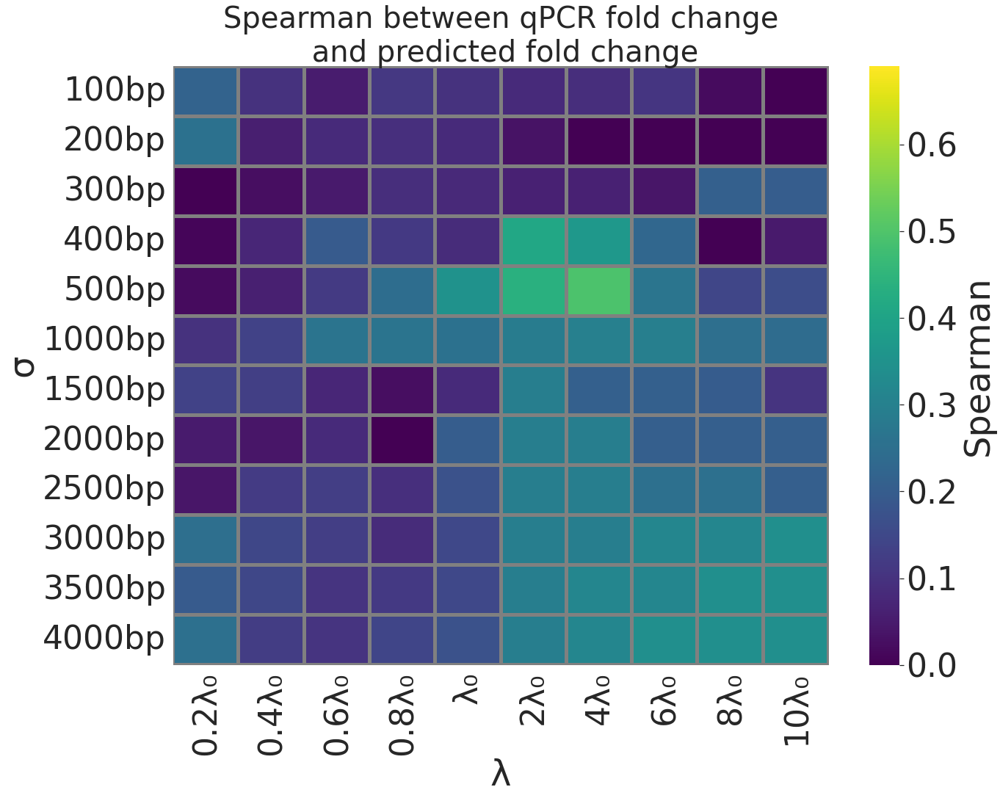

In [11]:
# Read in the hyperparameter sweep results and plot a heatmap (accompanying supplementary figure for Figure 6)        
df_v3 = pd.read_csv("../../../Logs/Figure_6_heatmaps/v3/v3.tsv", sep="\t", names=["\u03BB", "\u03C3", "rho"])

plt.rcParams["figure.figsize"] = (20, 15)
sns.set(font_scale=4)
sns.heatmap(df_v3.set_index(["\u03BB", "\u03C3"]).rho.unstack(0), linewidths=4, linecolor="grey",
            xticklabels=["0.2\u03BB\u2080", "0.4\u03BB\u2080", "0.6\u03BB\u2080", "0.8\u03BB\u2080", "\u03BB\u2080", "2\u03BB\u2080", "4\u03BB\u2080", "6\u03BB\u2080", "8\u03BB\u2080", "10\u03BB\u2080"],
            yticklabels=["100bp", "200bp", "300bp", "400bp", "500bp", "1000bp", "1500bp", "2000bp", "2500bp", "3000bp", "3500bp", "4000bp"],
            cmap=plt.cm.viridis, vmin=0, vmax=0.69, cbar_kws={'label': 'Spearman'})

plt.title("Spearman between qPCR fold change\n and predicted fold change", fontsize=40)

plt.savefig("Figure_6.Heatmap.pdf", dpi=300, bbox_inches = 'tight')

plt.show()
plt.close()


In [11]:
# Visualize the epigenetic features for each gene and its true vs predicted gene expression values
plt.rcParams["figure.figsize"] = (20, 10)
# plt.gca().set_prop_cycle(None)
colors = plt.cm.gist_rainbow(np.linspace(0.0, 1.0, len(ALL_CELL_TYPES)))

for i, t_pair in enumerate(transcript_list):

    fig,axes = plt.subplots(nrows=3, ncols=2, figsize=(30, 20), sharey=False, sharex=False)
    transcript = t_pair[0]
    gene = t_pair[1]

    vis_radius = 40
    
    for j, assay_index in enumerate(np.arange(0, 6)):

        idx_x, idx_y = convert_to_2D(j, nrows=3, ncols=2)
        ax = axes[idx_x, idx_y]

        for cell_type in np.arange(-len(ALL_CELL_TYPES), 0):

            epigenetic_features = np.expm1(np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".npy"))
            TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".TPM.npy")) - 1)[0][0]    
            
            ax.plot([RESOLUTION * x for x in range(-vis_radius, vis_radius + 1)], epigenetic_features[0, 200-vis_radius:200+vis_radius + 1, assay_index], '-', linewidth=5, color=colors[cell_type+len(ALL_CELL_TYPES)], label=1+cell_type+len(ALL_CELL_TYPES))

        
#     ax2 = ax.twinx()
#     for (t, gRNA, pos) in p300_dict[gene].keys():

#         # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore
#         if(abs(pos) > ise_radius):
#             print(ise_radius, pos, file=sys.stderr)
#             continue

#         if(t != transcript):
#             continue
            
#         fold_change_list = p300_dict[gene][(t, gRNA, pos)]
#         mean_fold_change = np.mean(fold_change_list)
#         stdev_fold_change = np.std(fold_change_list)
        
#         ax2.errorbar(x=RESOLUTION * pos, y=mean_fold_change, marker='o', markersize=10, yerr=stdev_fold_change, color="k")

        
        ax.set_xlim((RESOLUTION + 1) * -vis_radius, (RESOLUTION + 1) * vis_radius)
        if(j == 2):
            ax.set_ylim(0, 10)
        ax.grid(False)
        ax.tick_params(axis='both', which='major', labelsize=20)
#         ax.set_xticks(fontsize=20)
#         ax.set_yticks(fontsize=20)


        ax.set_xlabel("Position w.r.t TSS", fontsize=30)
        ax.set_ylabel("-log10(p-value)", fontsize=30)
#         ax.legend(loc="upper center", ncol=4, fontsize=30)
        ax.set_title(assays[assay_index], fontsize=40)

    fig.tight_layout() # pad=1, h_pad=5) # pad=1, w_pad=8, h_pad=12)        
    
    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, labels, loc = 'upper center', ncol=6, bbox_to_anchor = (0, +0.12, 1, 1), fontsize=30,
            bbox_transform = plt.gcf().transFigure)
        
    fig.suptitle(gene, fontsize=50) 
    fig.subplots_adjust(top=0.88)

    plt.show()
    plt.close()

NameError: name 'transcript_list' is not defined

100%|██████████| 10/10 [00:08<00:00,  1.12it/s]


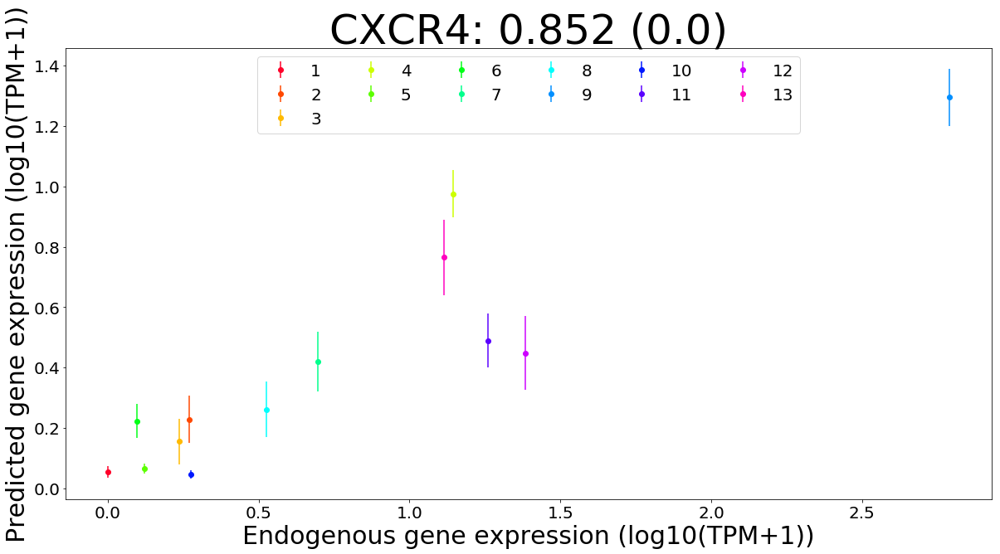

100%|██████████| 10/10 [00:07<00:00,  1.34it/s]


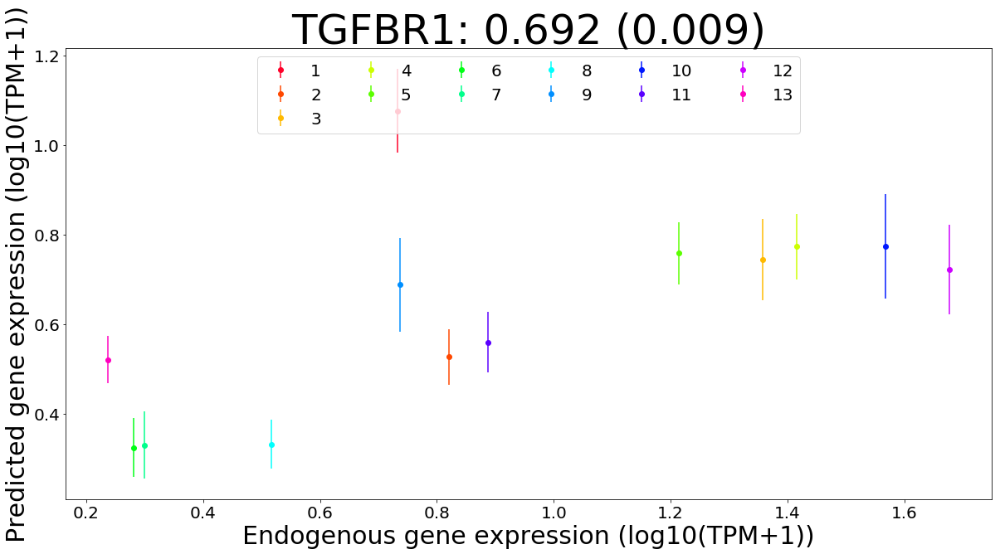

100%|██████████| 10/10 [00:07<00:00,  1.37it/s]


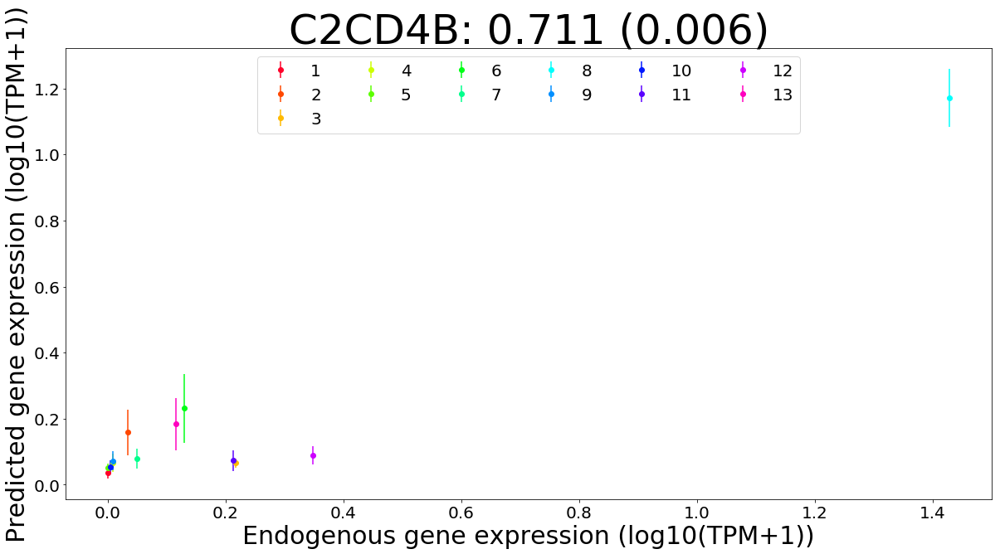

100%|██████████| 10/10 [00:07<00:00,  1.34it/s]


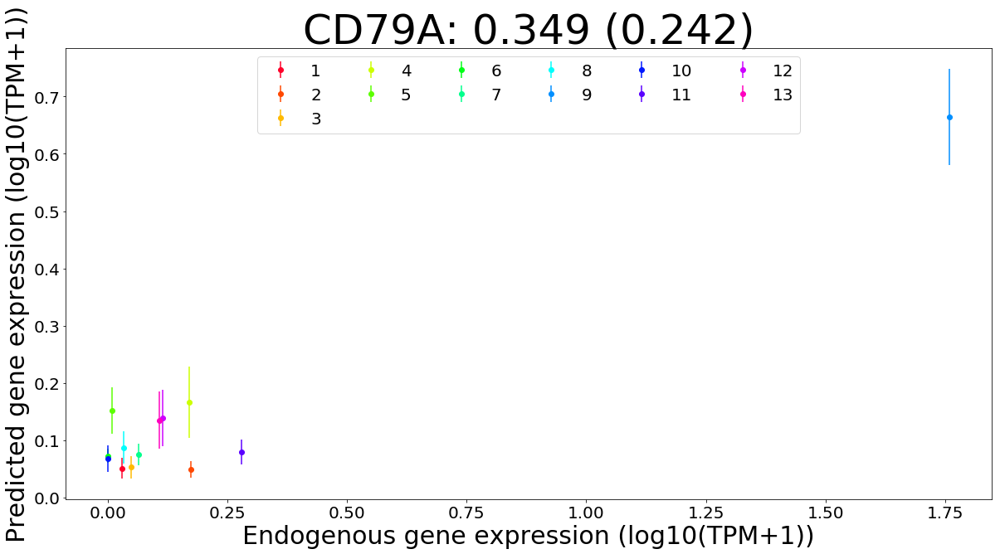

100%|██████████| 10/10 [00:07<00:00,  1.31it/s]


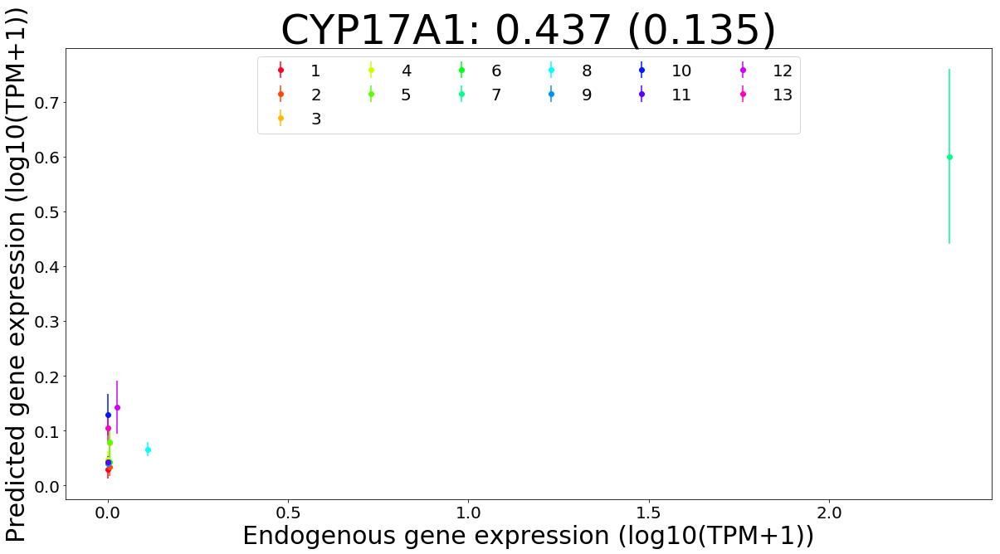

100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


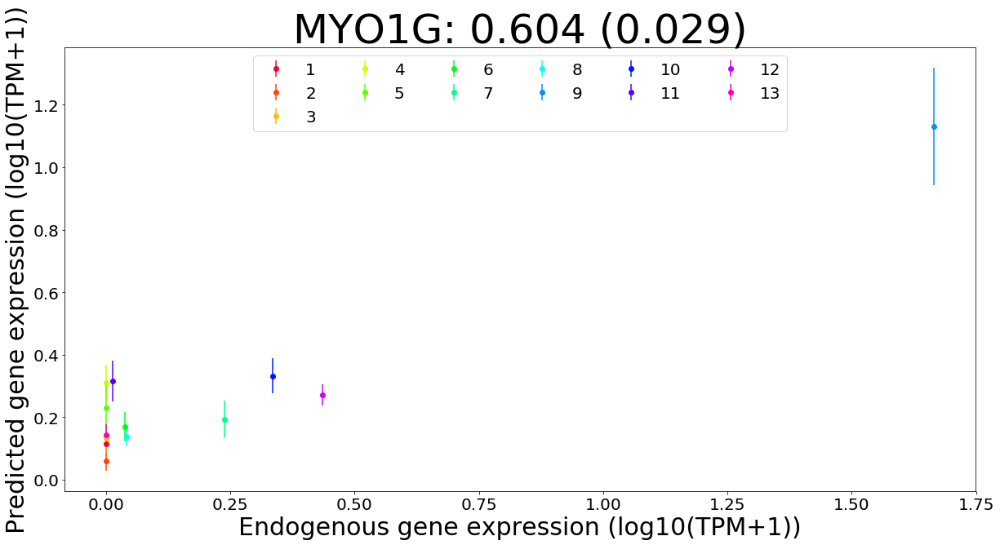

100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


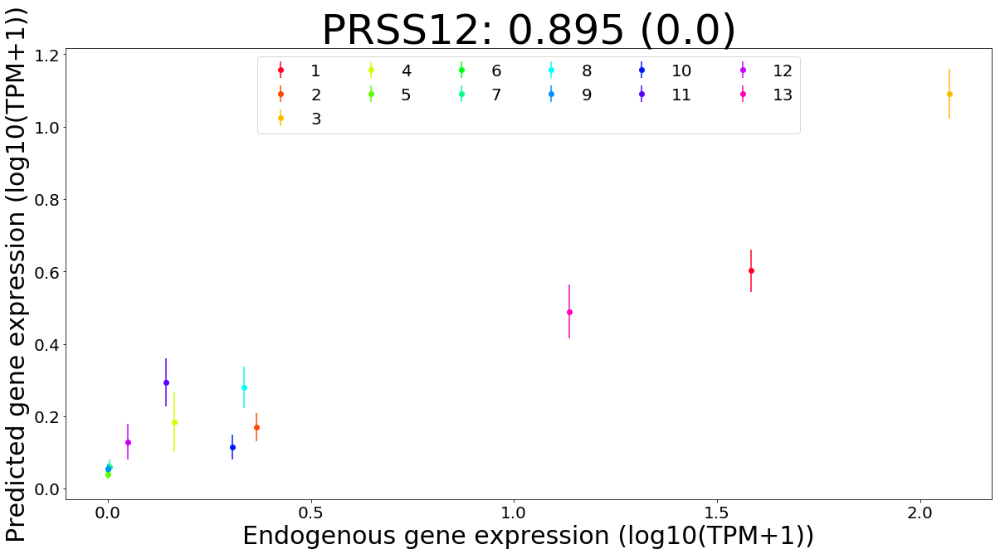

100%|██████████| 10/10 [00:07<00:00,  1.30it/s]


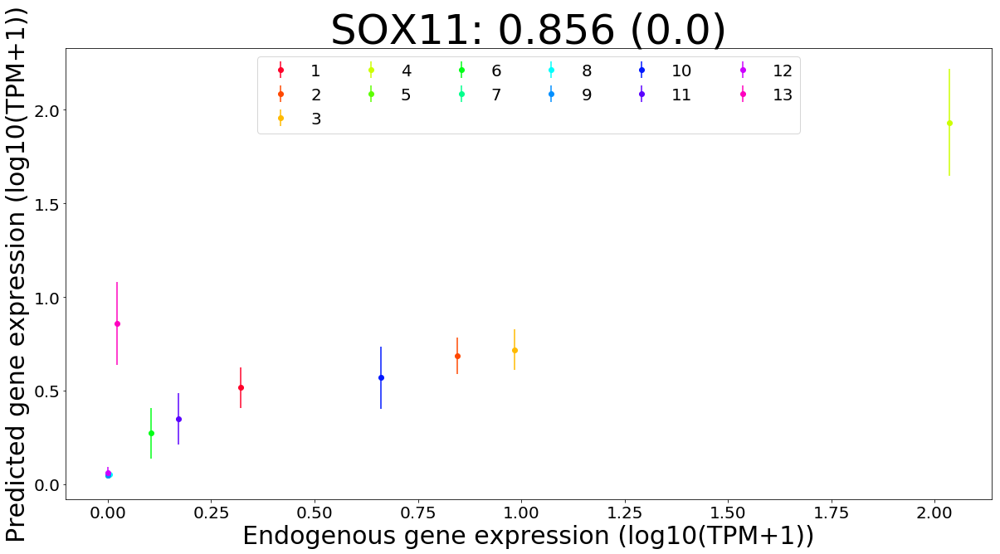

In [6]:
# Visualize the true vs predicted for each gene
colors = plt.cm.gist_rainbow(np.linspace(0.0, 1.0, len(ALL_CELL_TYPES)))

endogenous_TPM_dict = {}
predicted_TPM_dict = {}

for i, t_pair in enumerate(transcript_list):

    transcript = t_pair[0]
    gene = t_pair[1]

    endogenous_TPM_dict[transcript] = []
    predicted_TPM_dict[transcript] = []
    
    for model_type in ["maxpool"]:
        for context_size in [401]: # list(num_layers_dict.keys())[16:]:
            half_window = context_size // 2
            num_layers = num_layers_dict[context_size]

            
            
            for cell_type in np.arange(-len(ALL_CELL_TYPES), 0):

                epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".npy")
                TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".TPM.npy")) - 1)[0][0]    
            
                predicted_endogenous_TPM_list = []

                for replicate in tqdm(range(1, 101, 10)):

                    K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                    trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                    predicted_endogenous_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                    predicted_endogenous_TPM_list.append(predicted_endogenous_TPM)

                predicted_endogenous_TPM_list = np.log10(np.asarray(predicted_endogenous_TPM_list) + 1)
                mean_predicted_endogenous_TPM = round(np.mean(predicted_endogenous_TPM_list), 4)
                stdev_predicted_endogenous_TPM = round(np.std(predicted_endogenous_TPM_list), 4)
           
                endogenous_TPM_dict[transcript].append(TPM)
                predicted_TPM_dict[transcript].append(mean_predicted_endogenous_TPM)
        
                plt.errorbar(x=np.log10(TPM+1), y=mean_predicted_endogenous_TPM, yerr=stdev_predicted_endogenous_TPM, marker='o', linestyle = 'None', color=colors[cell_type+len(ALL_CELL_TYPES)], label=1+cell_type+len(ALL_CELL_TYPES))
   
            plt.xlabel("Endogenous gene expression (log10(TPM+1))", fontsize=30)
            plt.ylabel("Predicted gene expression (log10(TPM+1))", fontsize=30)
            plt.xticks(fontsize=20)
            plt.yticks(fontsize=20)
            plt.legend(loc="upper center", ncol=6, fontsize=20)
            sc, sp = spearmanr(endogenous_TPM_dict[transcript], predicted_TPM_dict[transcript])
            plt.title(gene + ": " + str(round(sc, 3)) + " (" + str(round(sp, 3)) + ")"  , fontsize=50)
            plt.show()
            plt.close()
            


In [53]:
def combined_visualize(x, mode):
    
    pred_values = []
    pred_ranks = []
    true_ranks = []
    true_values = []
    for gene in pd.unique(x.gene):
        num_genes = (x.gene == gene).sum()
        these_pred_ranks = x.loc[x.gene == gene, 'pred'].rank()
        these_pred_ranks -= np.mean(these_pred_ranks)
        these_pred_ranks /= np.std(these_pred_ranks)
        pred_ranks.extend([(gene, x) for x in these_pred_ranks])

        pred_values.extend((gene, v) for v in x.loc[x.gene == gene, 'pred'])

        these_true_ranks = x.loc[x.gene == gene, 'true'].rank()
        these_true_ranks -= np.mean(these_true_ranks)
        these_true_ranks /= np.std(these_true_ranks)
        true_ranks.extend([(gene, x) for x in these_true_ranks])

        true_values.extend((gene, v) for v in x.loc[x.gene == gene, 'true'])

    genes_list = [x[0] for x in pred_ranks]            
    pred_values = [x[1] for x in pred_values]        
    pred_ranks = [x[1] for x in pred_ranks] # np.array(pred_ranks).flatten()
    true_ranks = [x[1] for x in true_ranks] # np.array(qpcr_ranks).flatten()
    true_values = [x[1] for x in true_values]

    # add some noise to ranks
    true_ranks = [x + np.random.normal(0, 0.05, 1) for x in true_ranks]
    pred_ranks = [x + np.random.normal(0, 0.05, 1) for x in pred_ranks]

    cross_gene_spearman = spearmanr(true_ranks, pred_ranks)

    colors = plt.cm.cool(np.linspace(0.0, 1.0, 8))
    gene_2_index = {}
    for i, v in enumerate(transcript_list):
        if(mode == "endogenous"):
            gene_2_index[v[0]] = i
        elif(mode == "CRISPRa"):
            gene_2_index[v[1]] = i
        else:
            print("WRONG MODE")
            
    Color_Blind_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                      '#f781bf', '#a65628', '#984ea3',
                      '#999999', '#e41a1c']# , '#dede00']

    index_2_color = dict((i, Color_Blind_color_cycle[i]) for i in range(len(Color_Blind_color_cycle)))
    colors_list = [index_2_color[gene_2_index[gene]] for gene in genes_list]    

    transcript_dict = dict(transcript_list)

#     print(list(zip(true_ranks, pred_ranks, genes_list)))
    
    merged = [(v[0][0], v[1][0], v[2]) for v in list(zip(true_ranks, pred_ranks, genes_list))]
    values = set(map(lambda v:v[2], merged))
    newlist = [[(y[0], y[1], y[2]) for y in merged if y[2]==v] for v in values]

    fig = plt.figure()
    
    for i, l in enumerate(newlist):
        tr = [v[0] for v in l]
        pr = [v[1] for v in l]
        g = [v[2] for v in l]

        assert(list(set(g))[0] == g[0])
        
        if(mode == "endogenous"):
            label_value = transcript_dict[g[0]]
        elif(mode == "CRISPRa"):
            label_value = g[0]
        else:
            print("WRONG MODE")

        plt.scatter(tr, pr, color=index_2_color[gene_2_index[g[0]]], label=label_value, s=200)

    plt.xlim(-1.79, 1.99)
    plt.ylim(-1.79, 1.99)

    if(mode == "endogenous"):
        pass
#         plt.xlabel("Normalized rank across cell types", fontsize=35)
#         plt.ylabel("Normalized rank, predicted", fontsize=35)
    elif(mode == "CRISPRa"):
        pass    
#         plt.xlabel("Normalized rank across gRNAs", fontsize=35)
#         plt.ylabel("Normalized rank, predicted", fontsize=35)
    else:
        print("WRONG MODE")
        

    plt.tick_params(axis='x', labelrotation=0, labelsize=30, width=5, size=10)
    plt.tick_params(axis='y', labelrotation=0, labelsize=30, width=5, size=10)

    
    if(mode == "endogenous"):
        pass
#         plt.title("Endogenous expression", fontsize=40)
#         plt.title("Spearman correlation = " + str(round(cross_gene_spearman[0], 2)) + " for endogenous expression", fontsize=38)
    elif(mode == "CRISPRa"):
        pass
#         plt.title("Epigenome editing fold change", fontsize=40)
#         plt.title("Spearman correlation = " + str(round(cross_gene_spearman[0], 2)) + " for CRISPRa fold change", fontsize=38)        
    else:
        print("WRONG MODE")
        
    handles, labels = plt.gca().get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    
    if(mode == "endogenous"):
#         pass
        plt.legend(handles, labels, loc="upper center", ncol=4, fontsize=32, markerscale=2, frameon=True, edgecolor='black',
                   bbox_to_anchor=(0.5, 1.35))
    elif(mode == "CRISPRa"):
        pass
    else:
        print("WRONG MODE")

    return fig
    
#     plt.show()
#     plt.close()



In [14]:
# Load these dfs to save time
# df_alan_predictions = pd.read_csv("../../../Data/df_alan_predictions", sep='\t')
# endogenous_df = pd.read_csv("../../../Data/endogenous_df", sep='\t')

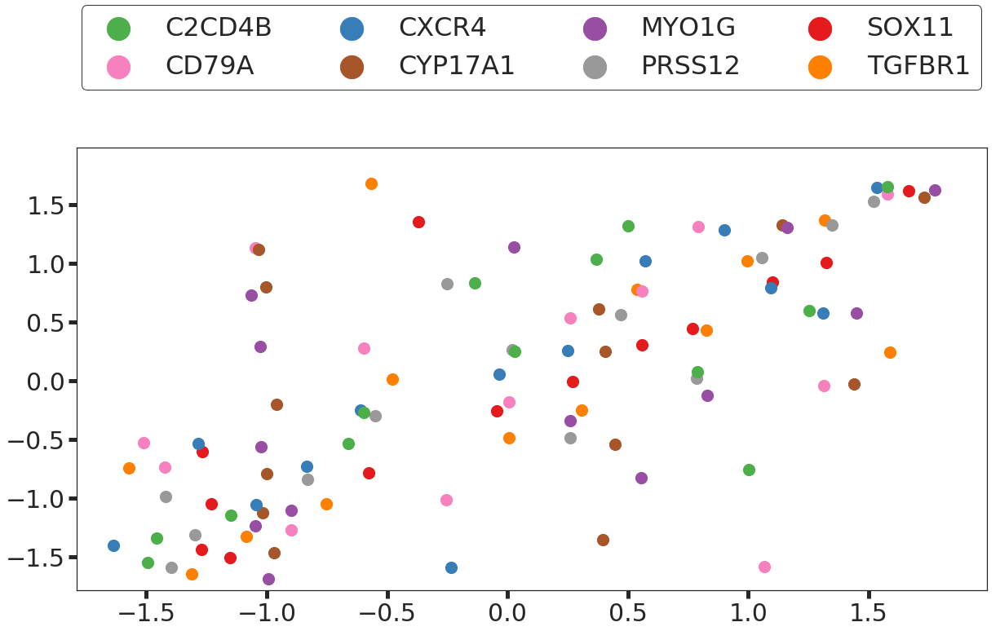

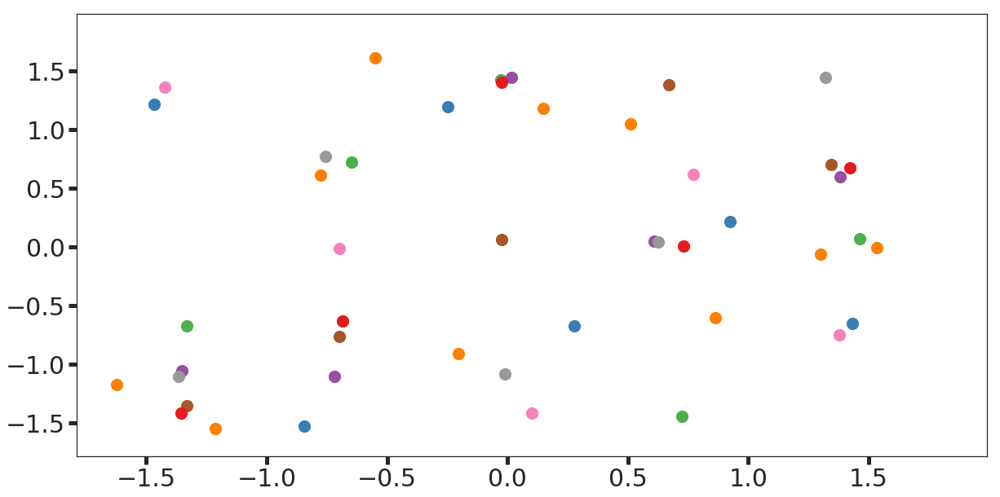

In [54]:
# endogenous_TPM_dict and predicted_TPM_dict contain len(CELL_TYPES) entries for each transcript
# these can be used to compute the same metric as we computed using ranks
# endogenous_TPM_dict
# predicted_TPM_dict

# '''
# convert these dicts into a dataframe
true_values = []
pred_values = []
genes = []
for t in transcript_list:
    transcript = t[0]
    
    true_values.extend(endogenous_TPM_dict[transcript])
    pred_values.extend(predicted_TPM_dict[transcript])
    
    genes.extend([transcript] * len(endogenous_TPM_dict[transcript]) )
    
# # add some noise to values
# true_values = [x + np.random.normal(0, 0.0001, 1) for x in true_values]
# pred_values = [x + np.random.normal(0, 0.0001, 1) for x in pred_values]
    
endogenous_df = pd.DataFrame(list(zip(true_values, pred_values, genes)), columns =['true', 'pred', 'gene'])
# '''

# convert alan's data predictions into data frame
CRISPRa_df = df_alan_predictions[["mean_qPCR", "mean_predicted_fold_change", "gene"]].set_axis(['true', 'pred', 'gene'], axis=1, inplace=False)

plt.rcParams.update({'text.color': "black",
                     'axes.labelcolor': "black"})

sns.set_style(style='white')

f = combined_visualize(endogenous_df, 'endogenous')
plt.savefig("Figure_6.A.pdf", dpi=f.dpi, bbox_inches = 'tight')
plt.show()
plt.close()

f = combined_visualize(CRISPRa_df, 'CRISPRa')
plt.savefig("Figure_6.B.pdf", dpi=f.dpi, bbox_inches = 'tight')
plt.show()
plt.close()



In [11]:
# Compute the correlation across cell types, for each of the 8 genes, for both model types
for i, t_pair in enumerate(transcript_list):

    transcript = t_pair[0]
    gene = t_pair[1]

    for model_type in ["linear", "maxpool"]:

        for context_size in [401]: # list(num_layers_dict.keys())[16:]:
            half_window = context_size // 2

            num_layers = num_layers_dict[context_size]

            across_cell_type_spearman = []
                
            for replicate in range(1, 11):

                K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                trained_model = load_model("../../../Models/manuscript.R12.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    
                
                l = []
                for cell_type in np.arange(-len(ALL_CELL_TYPES), 0):
    
                    epigenetic_features = np.expm1(np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".npy"))
                    TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".TPM.npy")) - 1)[0][0]    
                
                    predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                    
                    l.append((TPM, predicted_native_TPM))

                across_cell_type_spearman.append(spearmanr([x[0] for x in l], [x[1] for x in l])[0])

            print(gene, model_type_rename_dict[model_type], round(np.mean(across_cell_type_spearman), 2), round(np.std(across_cell_type_spearman), 2))
        

CXCR4 ridge 0.68 0.05


KeyboardInterrupt: 

100%|██████████| 10/10 [00:02<00:00,  3.52it/s]


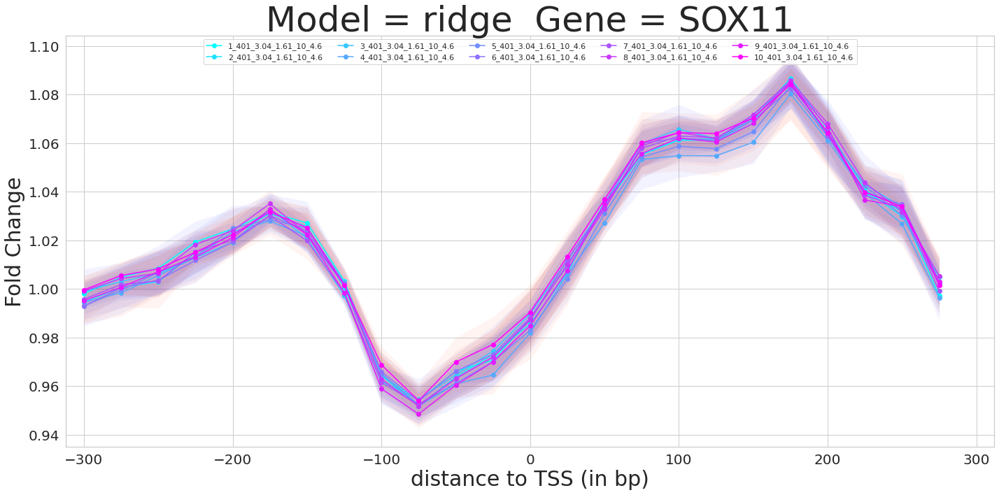

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


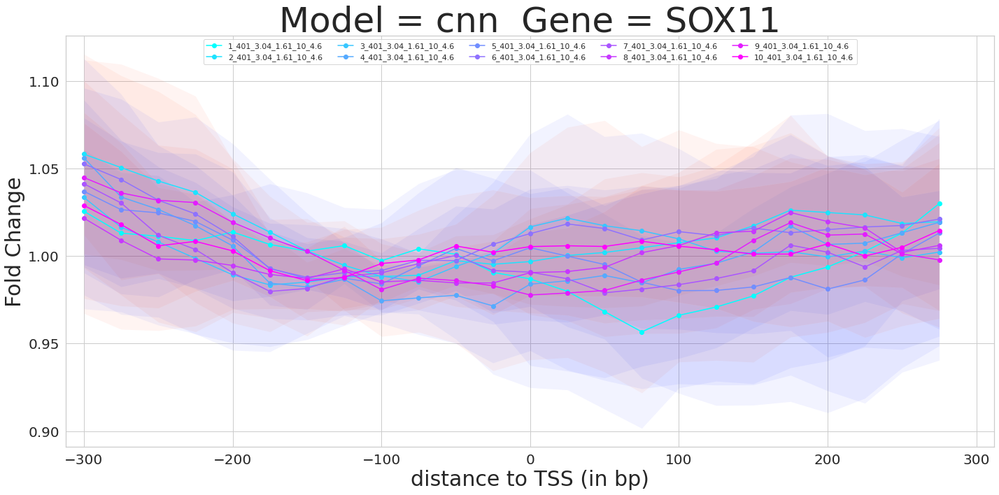

100%|██████████| 10/10 [00:02<00:00,  3.79it/s]


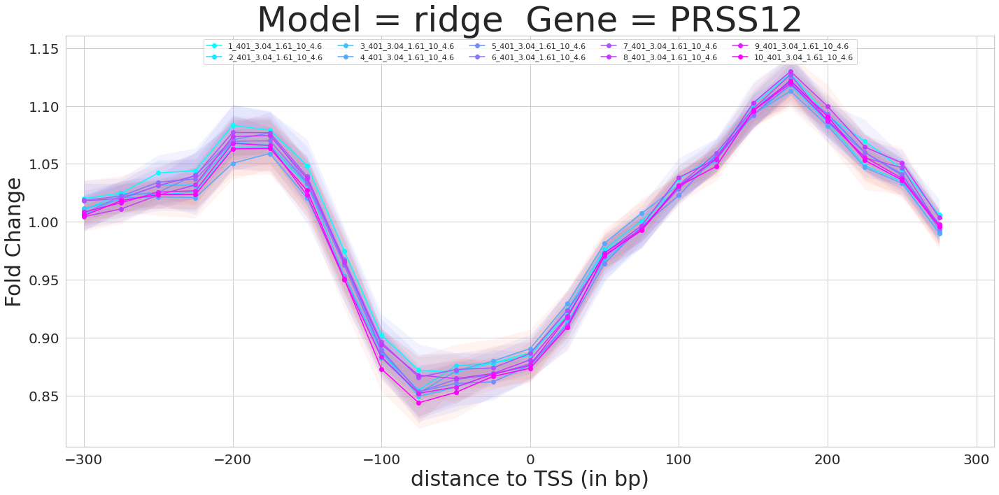

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


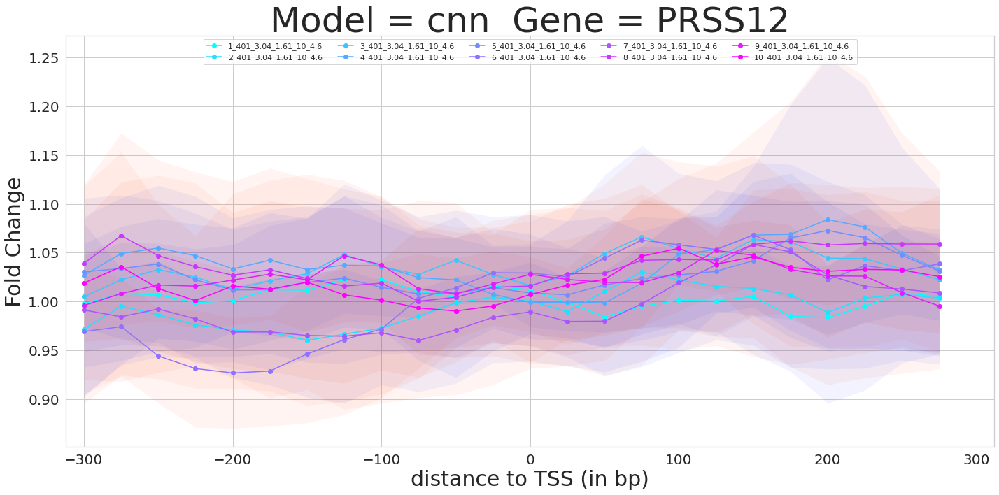

100%|██████████| 10/10 [00:02<00:00,  3.59it/s]


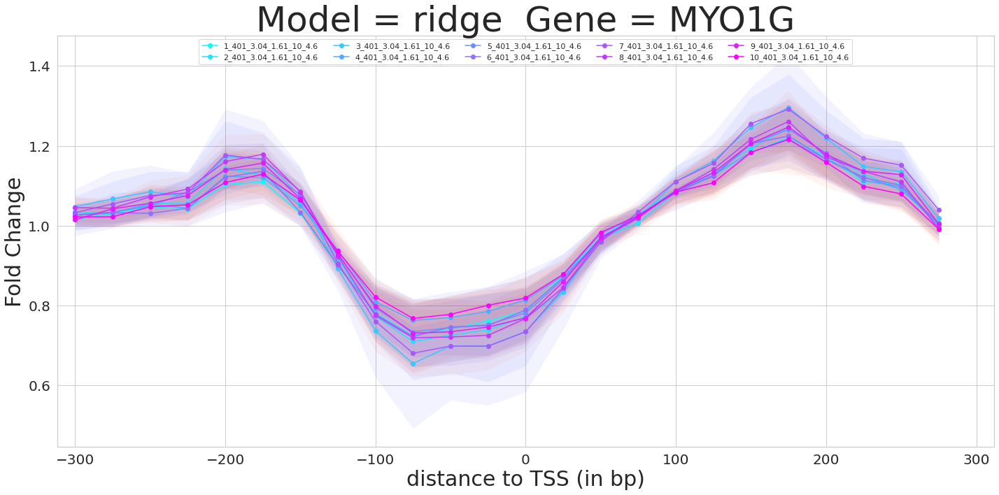

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


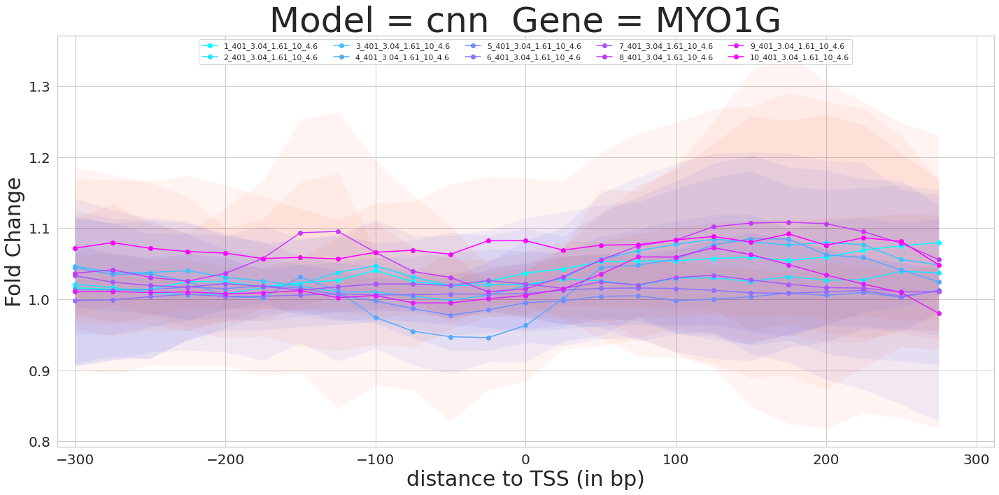

100%|██████████| 10/10 [00:02<00:00,  3.80it/s]


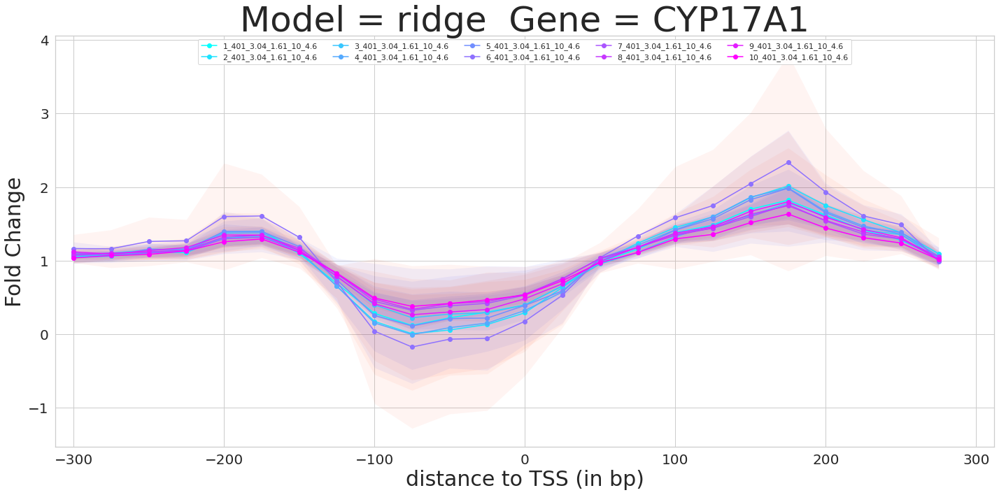

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


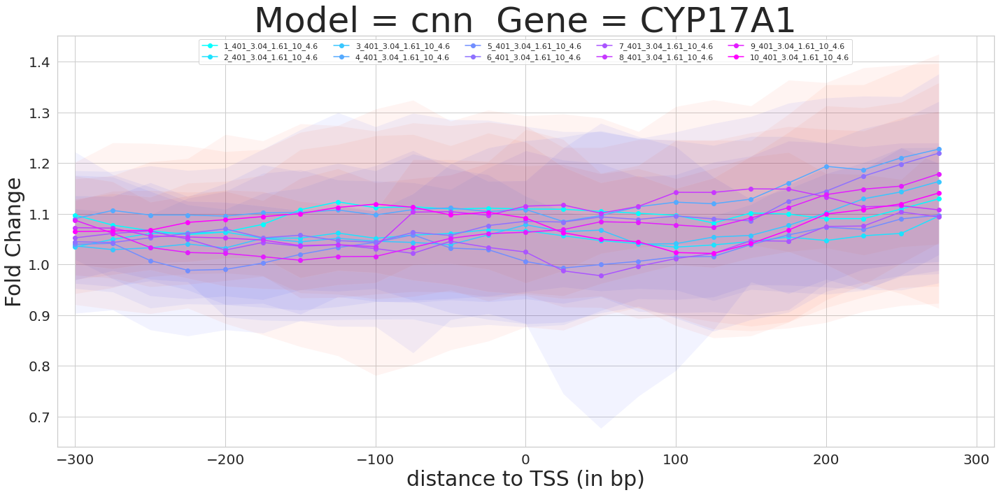

100%|██████████| 10/10 [00:02<00:00,  3.57it/s]


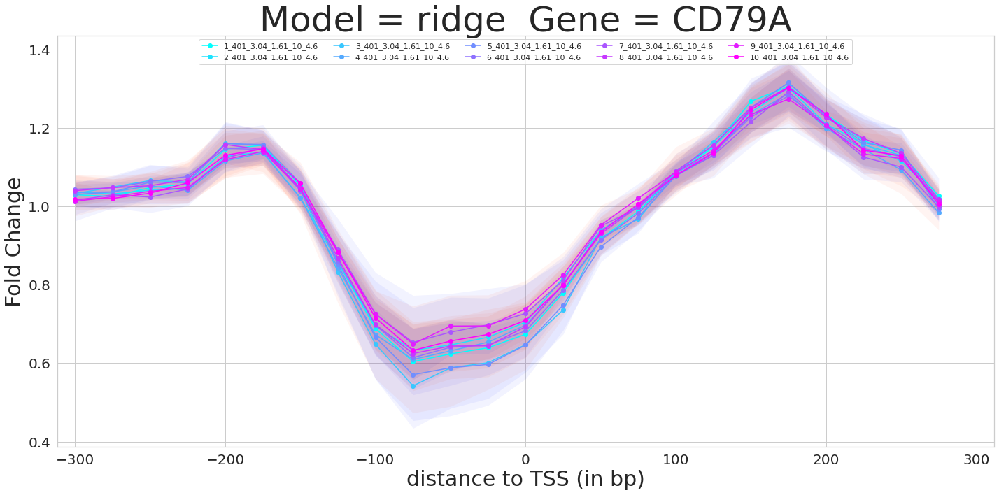

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


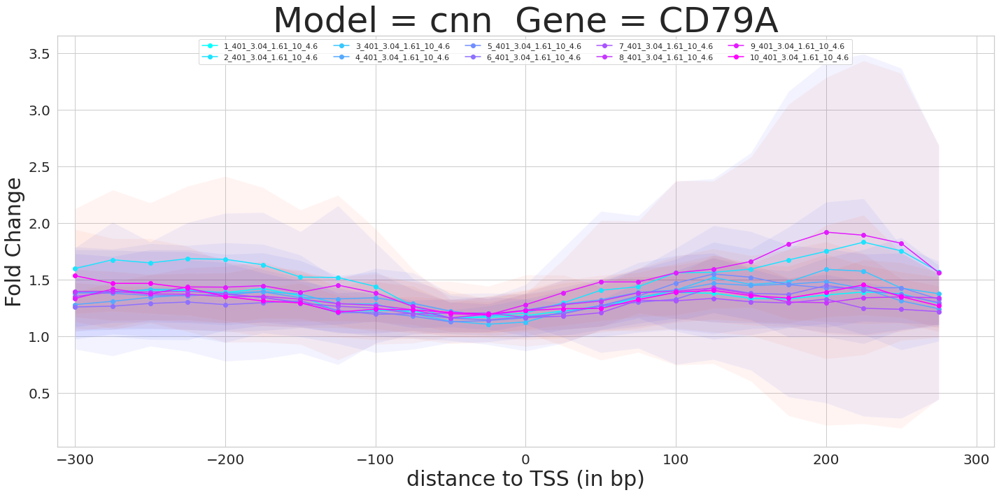

100%|██████████| 10/10 [00:02<00:00,  3.78it/s]


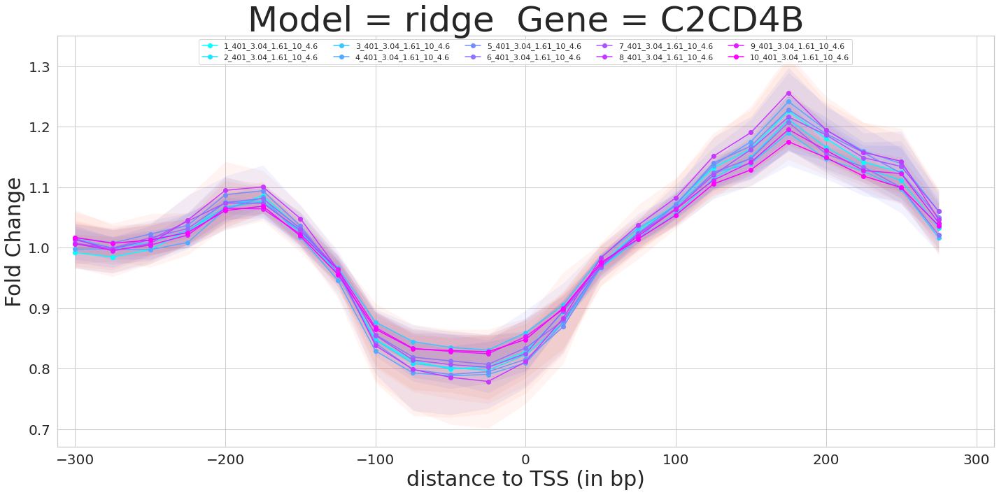

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


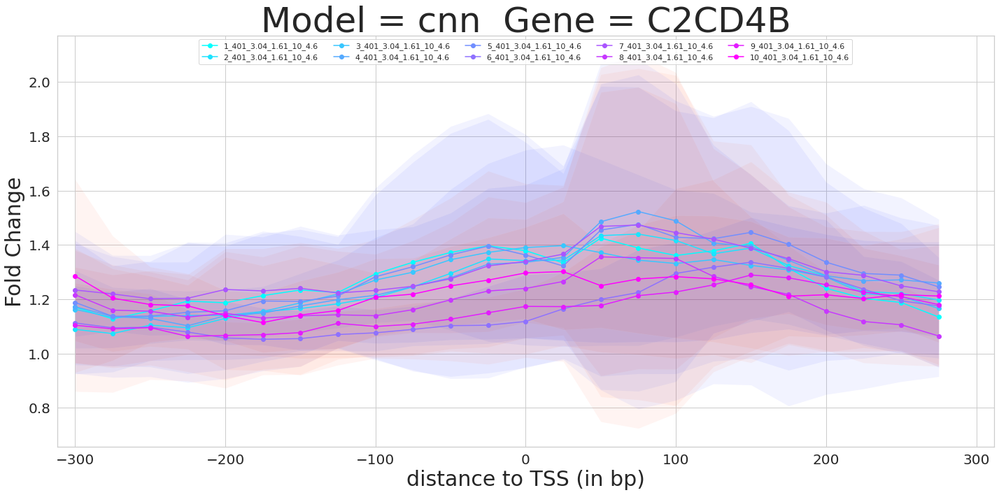

100%|██████████| 10/10 [00:02<00:00,  3.54it/s]


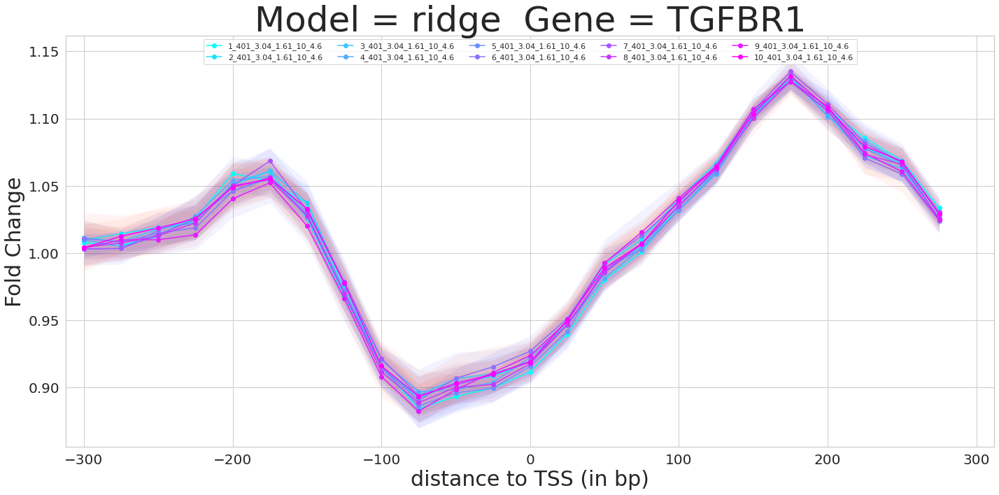

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


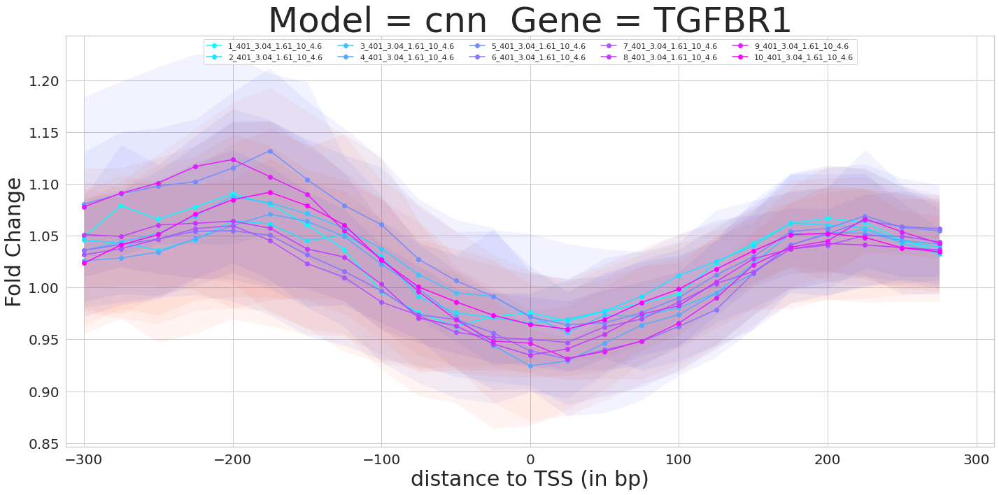

100%|██████████| 10/10 [00:02<00:00,  3.56it/s]


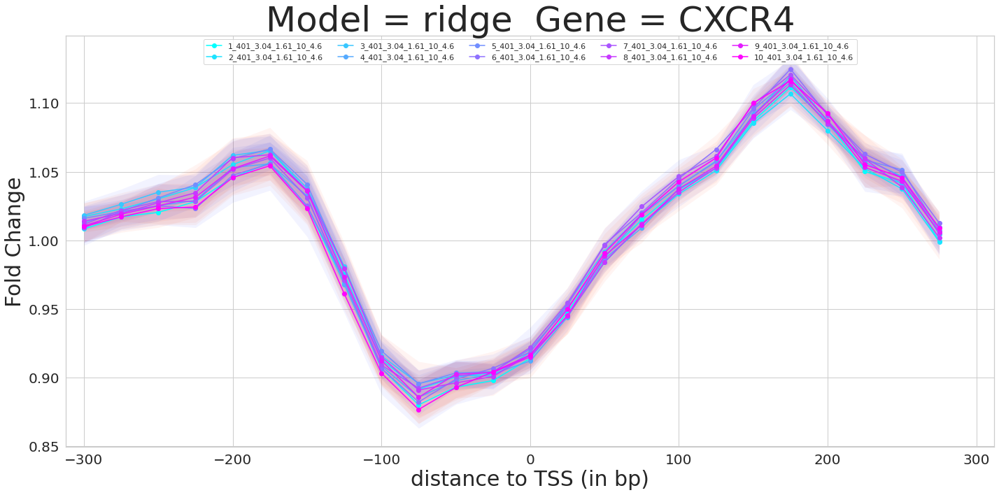

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


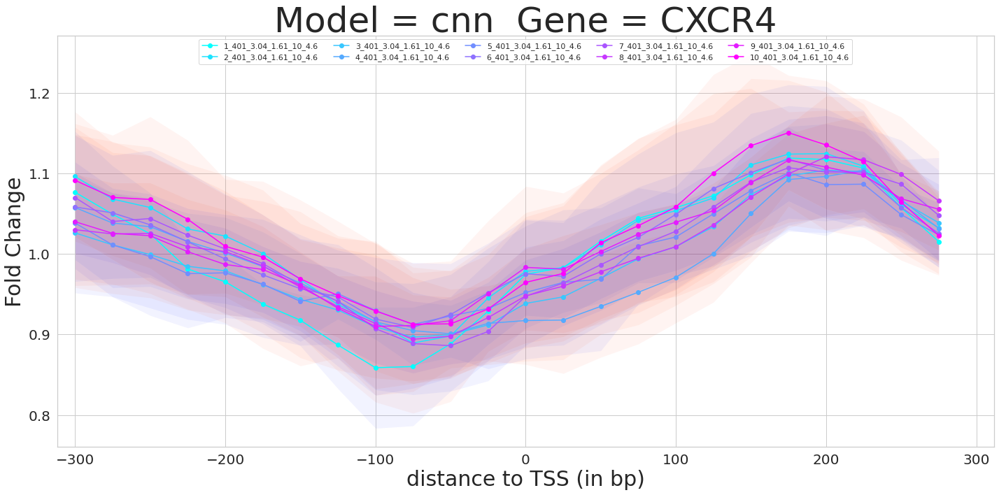

'                    \n            ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list\n            ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list\n\n            # Now we compare the model predictions w.r.t Alan\'s data\n\n            scatter_dict = {}                \n            scatter_dict[gene] = {}\n            scatter_dict[gene][model_type_rename_dict[model_type]] = []\n\n            max_fold_change = 1\n\n            for (transcript, gRNA, pos) in p300_dict[gene].keys():\n\n                # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore\n                if(abs(pos) > ise_radius):\n                    print(ise_radius, pos, file=sys.stderr)\n                    continue\n\n                fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]\n                mean_fold_change = np.mean(fold_change_list)\n                std

In [47]:
# Compute in silico perturbation plots for 100 replicate models
# We create a pipeline to predict the correlation with Alan's data (near the TSS within +-250bp)
# And analyze if we can overfit to what the perturbation should be like?

from tensorflow.keras.models import load_model
import sys
sys.path.insert(1, '../../../Code/deepENCODE/')
from chrmt_inference import perturb_x
from tensorflow.keras import backend as K


# Set plotting parameters
plt.rcParams["figure.figsize"] = (20, 10)
plt.gca().set_prop_cycle(None)
colors = plt.cm.cool(np.linspace(0.0, 1.0, 10))

# Initialize some dicts
transcript_list = [("ENST00000241393.3", "CXCR4"),
                   ("ENST00000374994.8", "TGFBR1"),
                   ("ENST00000380392.3", "C2CD4B"),
                   ("ENST00000221972.7", "CD79A"),
                   ("ENST00000369887.3", "CYP17A1"),
                   ("ENST00000258787.11", "MYO1G"),
                   ("ENST00000296498.3", "PRSS12"),
                   ("ENST00000322002.4", "SOX11")]

num_layers_dict = {9:2, 13:2, 17:2, 21:2, 25:2,
                   31:3, 41:3, 51:3, 61:3, 71:3,
                   81:4, 101:4, 121:4, 141:4, 161:4, 181:4, 201:4, 221:4, 241:4,
                   261:5, 281:5, 301:5, 321:5, 341:5, 361:5, 381:5, 401:5}

ise_mean_fold_change_dict = {}
ise_stdev_fold_change_dict = {}

results_list = []

# Then, for a particular transcript, we compute the ISE scores mean-ed across many models and compare with Alan's data
for transcript_index in np.arange(len(transcript_list)-1, -1, -1):

    inserted_peak_width = 10
    inserted_lnp1_minuslog10_p_value = 3.04 # ln(x+1) = 3.04  => x+1 => 21 => x == -log10(p-value) = 20
    maximum_inserted_lnp1_minuslog10_p_value = 1.61 # np.arange(0.11, 5.12, 0.5)  
    gaussian_bandwidth = 4.6 # np.arange(0.1, 7.11, +0.5)
    stranded_MNase_offset = 0

    ise_radius = 12
    bin_wrt_tss_choices = list(range(-ise_radius, ise_radius)) # region where we perform ISE
    
    for t_pair in [transcript_list[transcript_index]]:

        transcript = t_pair[0]
        gene = t_pair[1]

        epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
        TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".TPM.npy")) - 1)[0][0]    
#             print(epigenetic_features.shape, TPM)

        for model_type in ["linear", "maxpool"]:

            for replicate_set in range(1, 11):

                context_size = 401
                half_window = context_size // 2

                num_layers = num_layers_dict[context_size]

                fold_change_dict = {}

                for replicate in tqdm(np.random.choice(range(1, 101), 10, replace=False)):

                    K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                    
                    key = (replicate_set, model_type, transcript)
                    
                    # R13 => 100 replicates trained on all epigenetic tracks
                    # R14 => same but with other epigenetic tracks set to 0
                    trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                    fold_change_list = []

                    for bin_wrt_tss in bin_wrt_tss_choices:
                        perturbed_epigenetic_features = perturb_x(epigenetic_features, bin_wrt_tss, inserted_peak_width, inserted_lnp1_minuslog10_p_value, stranded_MNase_offset, maximum_inserted_lnp1_minuslog10_p_value, gaussian_bandwidth)
                        predicted_log10p1_TPM = trained_model.predict(perturbed_epigenetic_features[:, 200-half_window:200+half_window+1, :-1]) # This is 200 because of the size of the loaded epigenetic features numpy array
                        predicted_TPM = (np.power(10, predicted_log10p1_TPM) - 1)[0][0]
                        predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above
                        fold_change_list.append(predicted_TPM / predicted_native_TPM)

                    if(key in fold_change_dict):
                        fold_change_dict[key].append(fold_change_list)
                    else:
                        fold_change_dict[key] = [fold_change_list]

                mean_fold_change_list = np.mean(fold_change_dict[key], axis=0)
                stdev_fold_change_list = np.std(fold_change_dict[key], axis=0)

                y_lower = [x[0] - x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]
                y_upper = [x[0] + x[1] for x in list(zip(mean_fold_change_list, stdev_fold_change_list))]

                plt.plot([RESOLUTION * x for x in bin_wrt_tss_choices], mean_fold_change_list, 'o-', color=colors[replicate_set-1],
                          label=str(replicate_set)+"_"+str(context_size)+"_"+str(inserted_lnp1_minuslog10_p_value)+"_"+str(maximum_inserted_lnp1_minuslog10_p_value)+"_"+str(inserted_peak_width)+"_"+str(gaussian_bandwidth))
                plt.fill_between([RESOLUTION * x for x in bin_wrt_tss_choices], y_lower, y_upper, alpha = 0.05, label='')

            plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
#             plt.ylim(0.5, 1.5)

            plt.xticks(fontsize=20)
            plt.yticks(fontsize=20)    
            plt.ylabel("Fold Change", fontsize=30)
            plt.xlabel("distance to TSS (in bp)", fontsize=30)

            plt.legend(loc="upper center", ncol=5)
            plt.title("Model = " + str(model_type_rename_dict[model_type]) + "  Gene = " + str(gene), fontsize=50)
            plt.show()
            plt.close()
                 
                    
'''                    
            ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list
            ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list

            # Now we compare the model predictions w.r.t Alan's data

            scatter_dict = {}                
            scatter_dict[gene] = {}
            scatter_dict[gene][model_type_rename_dict[model_type]] = []

            max_fold_change = 1

            for (transcript, gRNA, pos) in p300_dict[gene].keys():

                # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore
                if(abs(pos) > ise_radius):
                    print(ise_radius, pos, file=sys.stderr)
                    continue

                fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]
                mean_fold_change = np.mean(fold_change_list)
                stdev_fold_change = np.std(fold_change_list)

#                         plt.errorbar(x=RESOLUTION * pos, y=mean_fold_change, marker='o', markersize=10, yerr=stdev_fold_change, color="k")

                if(mean_fold_change > max_fold_change):
                    max_fold_change = mean_fold_change

                scatter_dict[gene][model_type_rename_dict[model_type]].append((mean_fold_change, ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)][ise_radius + pos]))

            # Then we overlay with the predictions from the models by creating a scatter plot and computing spearman
            model_type_color_dict = {"linear":"red", "maxpool":"blue"}
            mean_predictions = ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)]
            stdev_predictions = ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)]

#                 plt.errorbar(x=[RESOLUTION * x for x in range(-ise_radius, ise_radius)], y=[1.8 * x * max_fold_change for x in mean_predictions], yerr=[0.1 * x * max_fold_change for x in stdev_predictions], marker='o', color=model_type_color_dict[model_type], label=model_type_rename_dict[model_type])

            # Plot epigenetic features instead of model predictions
            # Load epigenetic features in HEK293T
#                 epigenetic_features = np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(-1)+".npy")
#                 print(epigenetic_features.shape)
#                 assay_index = 2
#                 plt.plot([RESOLUTION * x for x in range(-ise_radius, ise_radius)], [1 * x * max_fold_change for x in epigenetic_features[0, 200-ise_radius:200+ise_radius, assay_index]], 'o-', label=assays[assay_index])

#                 plt.xlim((RESOLUTION + 1) * -ise_radius, (RESOLUTION + 1) * ise_radius)
#                 plt.yticks(fontsize=20)
#                 plt.title(gene + " " + transcript)
#                 plt.legend(loc="upper right", fontsize=40)
#                 plt.show()
#                 plt.close()

            scatter_x = [x[0] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]
            scatter_y = [x[1] for x in scatter_dict[gene][model_type_rename_dict[model_type]]]

#                     plt.scatter(scatter_x, scatter_y, s=100)

            sc, sp = spearmanr(scatter_x, scatter_y)
            results_list.append([transcript, gene, round(key[0], 4), round(key[1], 4), model_type_rename_dict[model_type], round(sc, 2), round(sp, 2)])
#                     print(results_list)

#                     plt.title(gene + " " + str(round(sc, 2)) + " " + str(round(sp, 2)), fontsize=50)
#                     plt.show()
#                     plt.close()

'''




100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


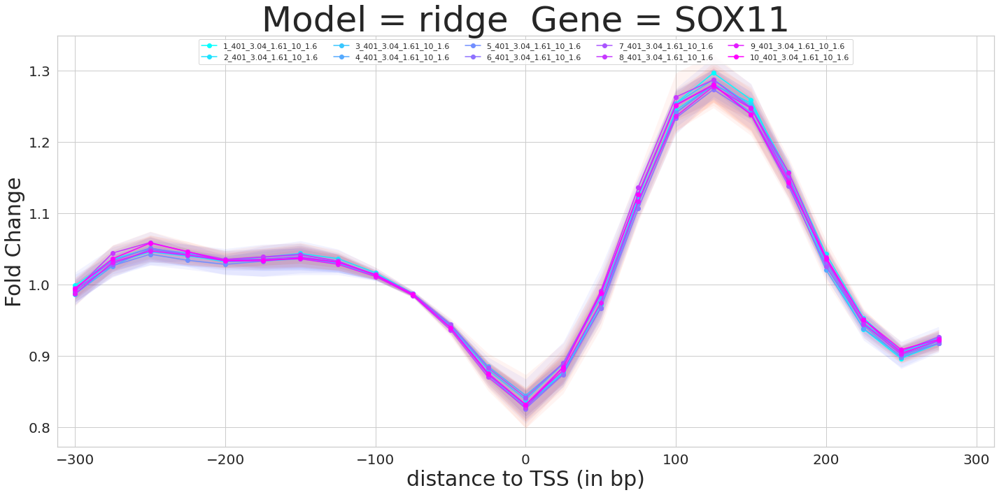

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


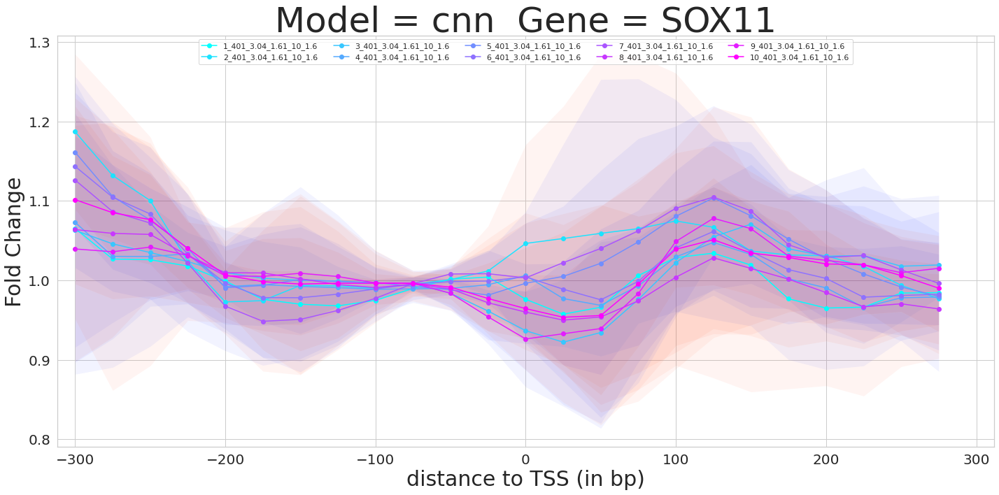

100%|██████████| 10/10 [00:02<00:00,  3.84it/s]


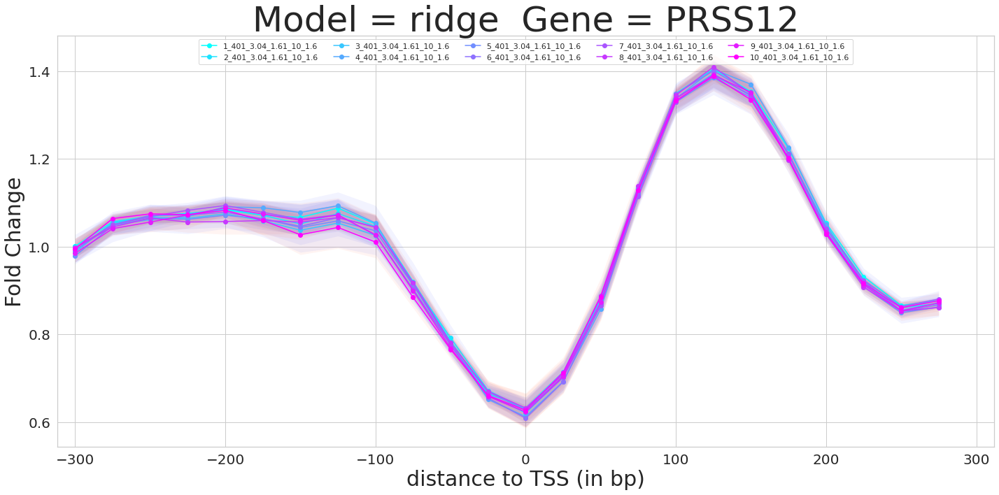

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


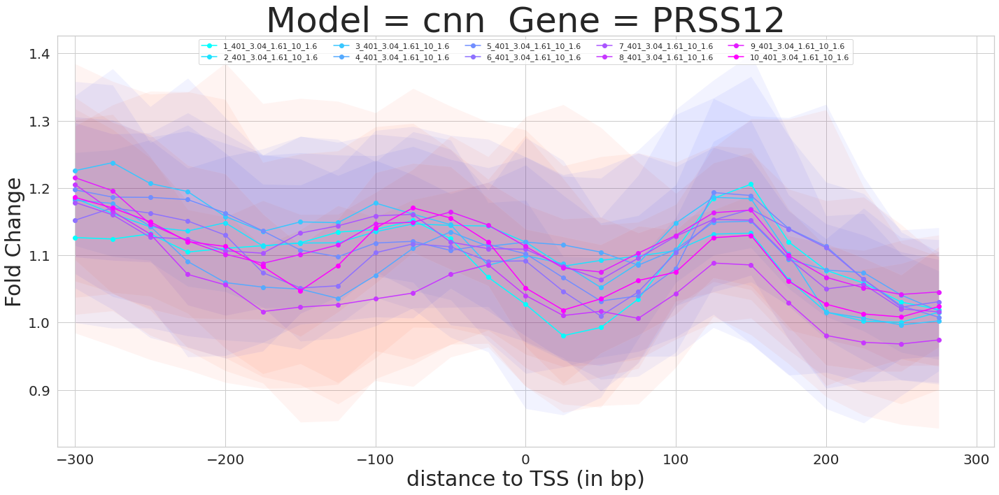

100%|██████████| 10/10 [00:02<00:00,  3.63it/s]


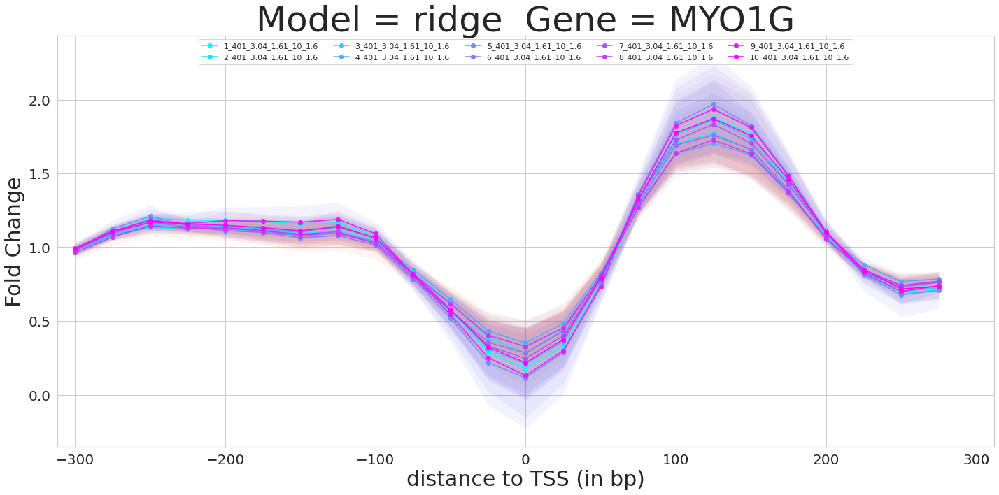

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


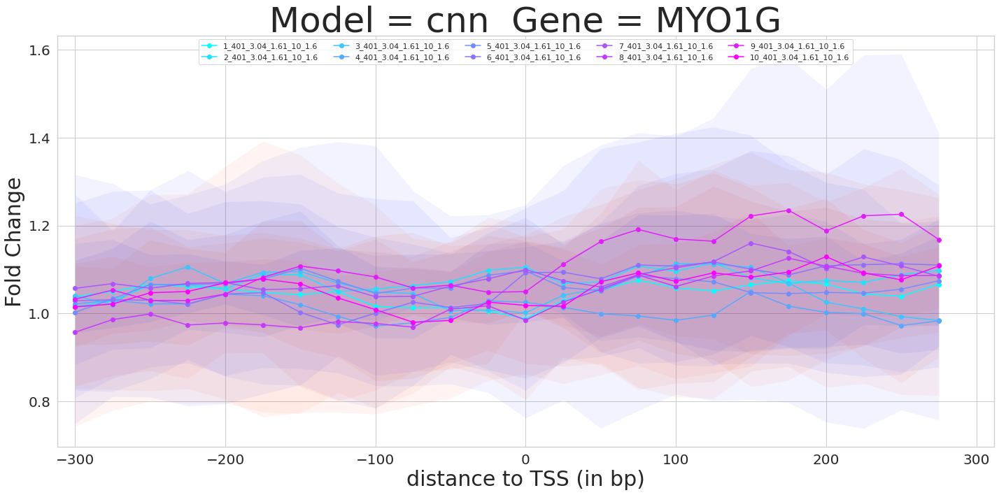

100%|██████████| 10/10 [00:02<00:00,  3.81it/s]


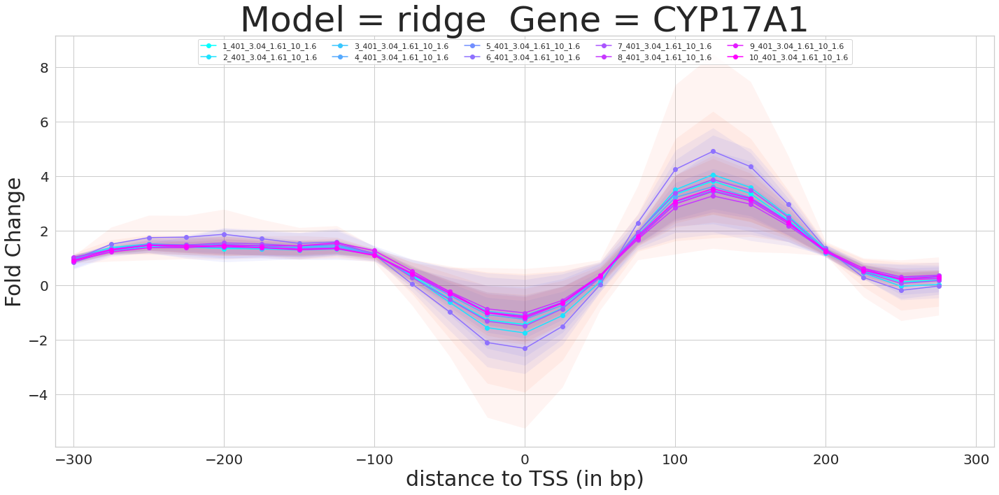

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


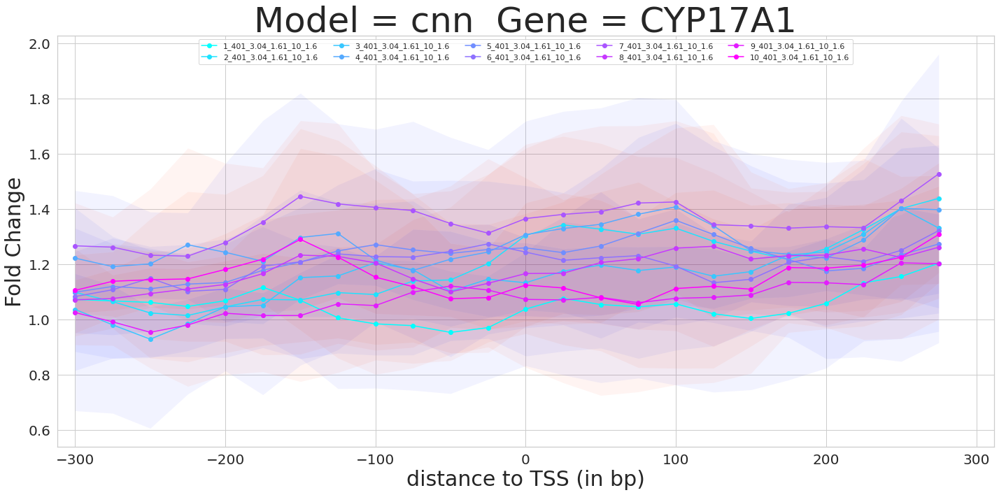

100%|██████████| 10/10 [00:02<00:00,  3.82it/s]


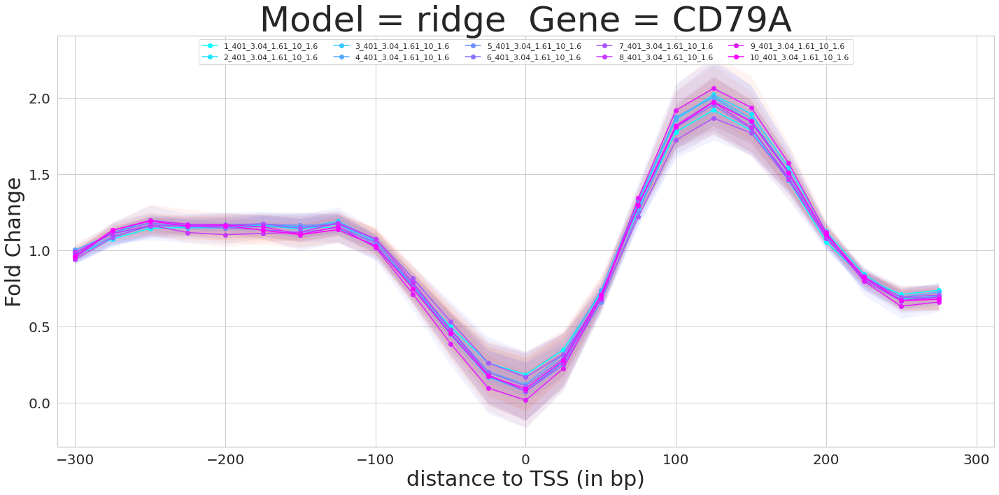

100%|██████████| 10/10 [00:10<00:00,  1.08s/it]


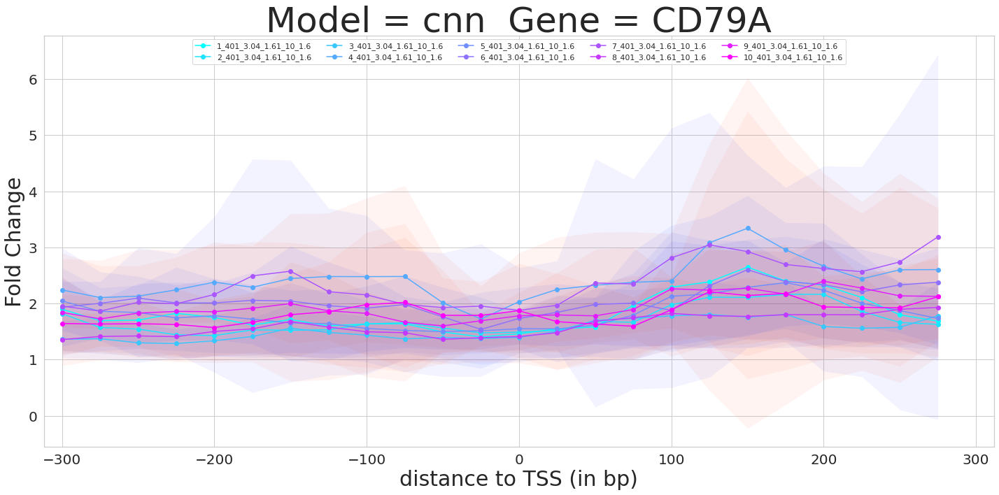

100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


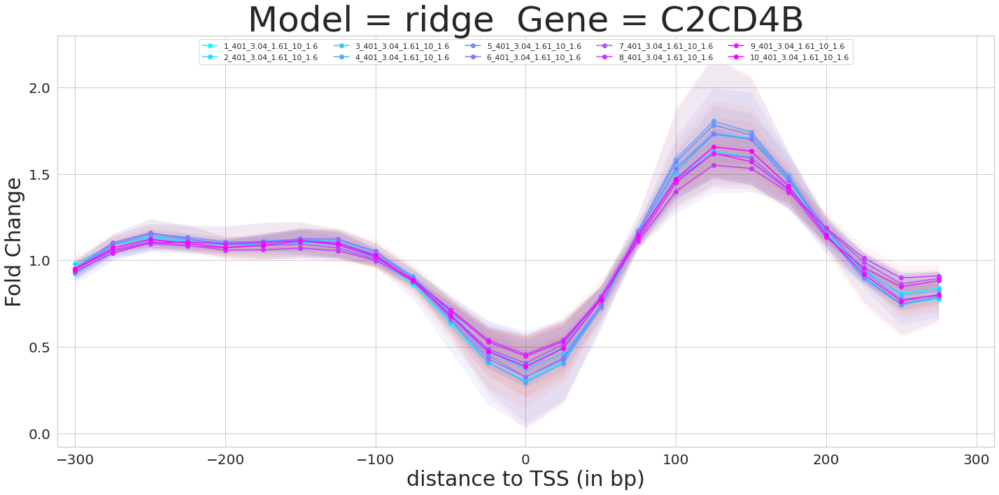

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


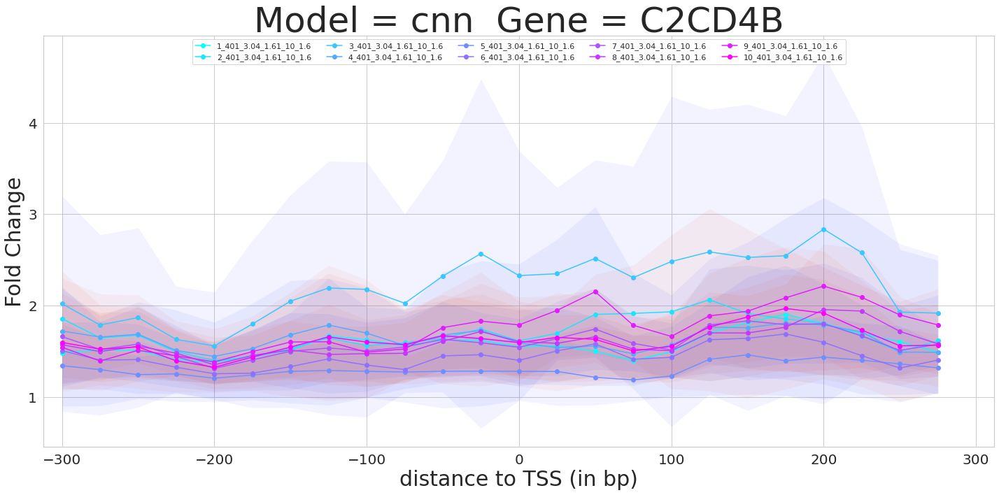

100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


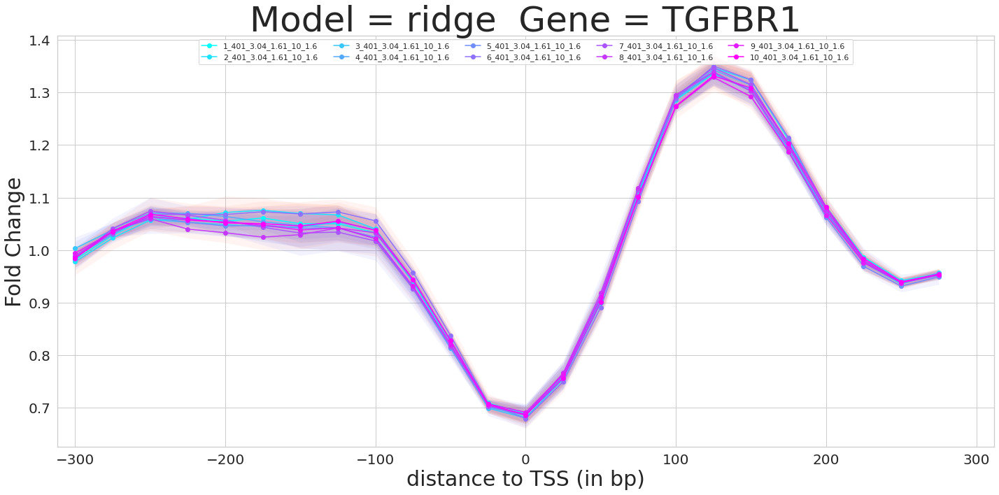

100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


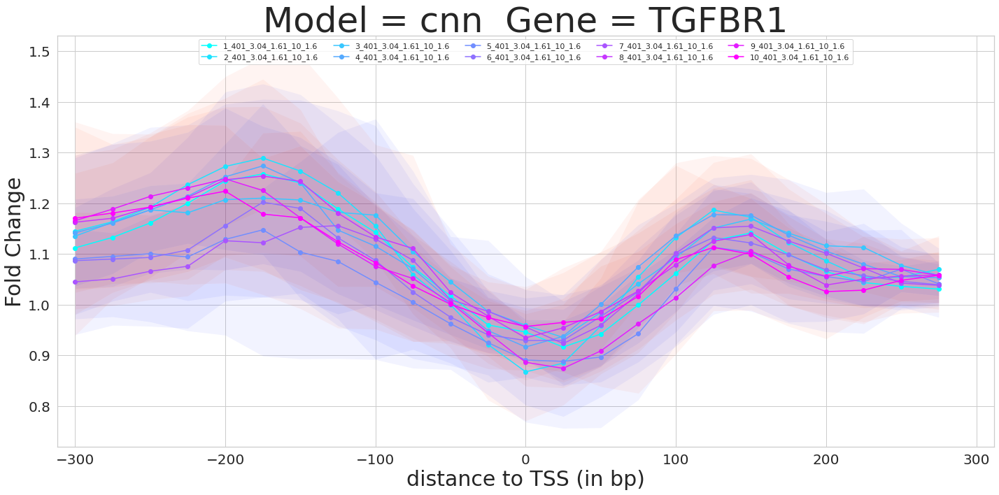

100%|██████████| 10/10 [00:02<00:00,  3.82it/s]


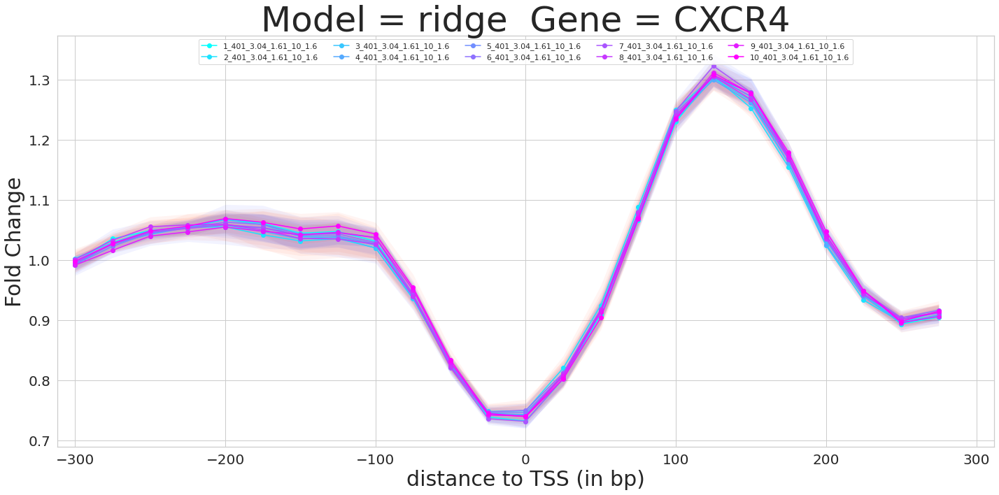

100%|██████████| 10/10 [00:10<00:00,  1.05s/it]


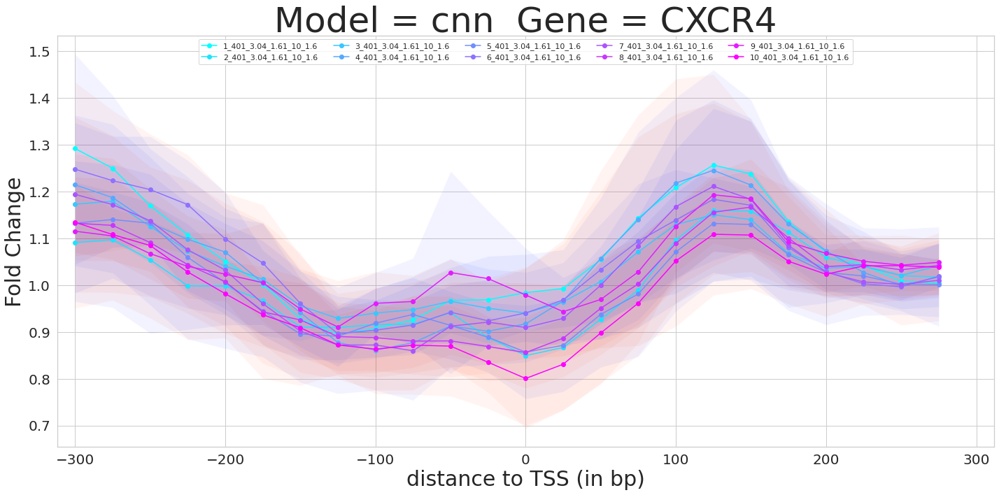

'                    \n            ise_mean_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = mean_fold_change_list\n            ise_stdev_fold_change_dict[(transcript, model_type_rename_dict[model_type], key)] = stdev_fold_change_list\n\n            # Now we compare the model predictions w.r.t Alan\'s data\n\n            scatter_dict = {}                \n            scatter_dict[gene] = {}\n            scatter_dict[gene][model_type_rename_dict[model_type]] = []\n\n            max_fold_change = 1\n\n            for (transcript, gRNA, pos) in p300_dict[gene].keys():\n\n                # If the gRNA_bin_wrt_TSS which is named pos, is not within the ise_radius, then ignore\n                if(abs(pos) > ise_radius):\n                    print(ise_radius, pos, file=sys.stderr)\n                    continue\n\n                fold_change_list = p300_dict[gene][(transcript, gRNA, pos)]\n                mean_fold_change = np.mean(fold_change_list)\n                std

In [40]:
# gaussian_bandwidth = 1.6

In [ ]:
# Compute CRISPRa-bility by comparing:
# 1) a model trained on all the epigenetic tracks 
# 2) a model trained on all the epigenetic tracks with all except H3K27ac set to 0

for i, t_pair in enumerate(transcript_list):

    transcript = t_pair[0]
    gene = t_pair[1]

    for model_type in ["linear", "maxpool"]:

        across_cell_type_spearman = []

        for replicate_set in range(10):

            context_size = 401
            half_window = context_size // 2
            num_layers = num_layers_dict[context_size]

            l_predicted = []

            for replicate in [x + (10 * replicate_set) for x in range(1, 11)]:
            
                K.clear_session() # 2022 and what an insane bug in Keras! Time to switch to PyTorch
                trained_model = load_model("../../../Models/manuscript.R13.stochastic_chromosomes.replicate_"+str(replicate)+"_0_transcriptome_"+str(context_size)+"_"+str(num_layers)+"_32_"+str(model_type)+"_mse_1_-1.hdf5", compile=False)    

                l_true = []
                
                for cell_type in np.arange(-len(ALL_CELL_TYPES), 0):

                    epigenetic_features = np.expm1(np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".npy"))
                    TPM = (np.power(10, np.load("../../../Data/saved_npy_arrays/." + transcript + ".CT_"+str(cell_type)+".TPM.npy")) - 1)[0][0]    
                
#                     # Set other epigenetic tracks to 0 for CRISPRa-bility
#                     epigenetic_features[:, :, np.r_[0,1,3,4,5]] = 0
                    
                    predicted_native_TPM = np.power(10, trained_model.predict(epigenetic_features[:, 200-half_window:200+half_window+1, :-1])[0][0]) -1 # Same reason for 200, as above

                    l_true.append(TPM)
                    l_predicted.append(predicted_native_TPM)

            # Take the mean of every len(ALL_CELL_TYPES) entry in l_predicted before computing spearman
            l_predicted_mean = []
            for ct in range(len(ALL_CELL_TYPES)):
                l_predicted_mean.append(np.mean(l_predicted[ct::len(ALL_CELL_TYPES)]))
            
            across_cell_type_spearman.append(spearmanr([x for x in l_true], [x for x in l_predicted_mean])[0])

        print(gene, model_type_rename_dict[model_type], round(np.mean(across_cell_type_spearman), 2), round(np.std(across_cell_type_spearman), 2))

In [46]:
# Training with all epigenetic tracks        

CXCR4 ridge 0.66 0.02
CXCR4 cnn 0.64 0.04
TGFBR1 ridge 0.14 0.03
TGFBR1 cnn 0.23 0.06
C2CD4B ridge 0.5 0.02
C2CD4B cnn 0.49 0.1
CD79A ridge 0.26 0.06
CD79A cnn 0.24 0.07
CYP17A1 ridge 0.73 0.06
CYP17A1 cnn 0.56 0.08
MYO1G ridge 0.17 0.05
MYO1G cnn 0.35 0.15
PRSS12 ridge 0.79 0.0
PRSS12 cnn 0.9 0.01
SOX11 ridge 0.84 0.02
SOX11 cnn 0.9 0.01


In [45]:
# Training with only H3K27ac with other epigenetic tracks 0-ed out        

CXCR4 ridge 0.77 0.01
CXCR4 cnn 0.83 0.02
TGFBR1 ridge -0.06 0.03
TGFBR1 cnn 0.19 0.06
C2CD4B ridge 0.67 0.01
C2CD4B cnn 0.44 0.03
CD79A ridge 0.09 0.03
CD79A cnn 0.3 0.04
CYP17A1 ridge 0.43 0.03
CYP17A1 cnn 0.08 0.02
MYO1G ridge 0.42 0.03
MYO1G cnn 0.59 0.05
PRSS12 ridge 0.84 0.0
PRSS12 cnn 0.76 0.01
SOX11 ridge 0.77 0.01
SOX11 cnn 0.79 0.02


In [43]:
# CRISPRability cnn spearman delta
CYP17A1: 0.48
PRSS12: 0.14
SOX11: 0.11    
C2CD4B: 0.05
TGFBR1: 0.04
CD79A: -0.06
CXCR4: -0.19
MYO1G: -0.24
    
# CRISPRability ridge spearman delta    
CYP17A1: 0.3
PRSS12: -0.05
SOX11: 0.07
C2CD4B: -0.17
TGFBR1: 0.2
CD79A: 0.17
CXCR4: -0.11
MYO1G: -0.25


In [ ]:
# Add variance across 

In [30]:
# For creating Supplementary Table S2, we need endogenous gene expression levels, cross_cell_correlations
# and Maximum Fold Change observed
ccc = {'PRSS12': 0.896, 'MYO1G': 0.621, 'TGFBR1': 0.689, 'C2CD4B': 0.726, 'CXCR4': 0.852, 'CD79A': 0.364, 'SOX11': 0.846, 'CYP17A1': 0.397}

transcript_list = [
                   ("ENST00000241393.3", "CXCR4"),
                   ("ENST00000374994.8", "TGFBR1"),
                   ("ENST00000380392.3", "C2CD4B"),
                   ("ENST00000221972.7", "CD79A"),
                   ("ENST00000369887.3", "CYP17A1"),
                   ("ENST00000258787.11", "MYO1G"),
                   ("ENST00000296498.3", "PRSS12"),
                   ("ENST00000322002.4", "SOX11")
                  ]
df_HEK293T[df_HEK293T['gene_id'].str.contains('ENST00000296498.3')]



,chrom,TSS,TTS,strand,gene_id,transcript_id,transcript_length,RSEM_expected_count,HEK293.SRR3997504_TPM,HEK293T.SRR13341848_TPM,HEK293T.SRR15013784_TPM
3280,chr4,118280038,118353003,-,ENST00000296498.3,ENSG00000164099.3,4809,1771.53,12.71,8.44798,6.91031


In [15]:
# Comparing HEK293T gene expression datasets
df_HEK293T = pd.read_csv("../../../Data/HEK293T_Data/HEK293_True_union_HEK293T_Avocado_for_remaining_tracks/HEK293T_Gene_Expression/HEK293T.TPM.tsv", sep="\t")
df_HEK293T

,chrom,TSS,TTS,strand,gene_id,transcript_id,transcript_length,RSEM_expected_count,HEK293.SRR3997504_TPM,HEK293T.SRR13341848_TPM,HEK293T.SRR15013784_TPM
0,chr1,685679,686673,-,ENST00000332831.3,ENSG00000273547.1,995,0.00000,0.000000,0.112644,0.219669
1,chr1,1173880,1197936,+,ENST00000379289.5,ENSG00000162571.13,2259,0.00000,0.000000,0.015339,0.000000
2,chr1,1203508,1206571,-,ENST00000328596.10,ENSG00000186891.13,851,0.00000,0.000000,0.000000,0.000000
3,chr1,1203508,1206592,-,ENST00000379268.6,ENSG00000186891.13,1179,2.24902,0.073758,0.031844,1.148260
4,chr1,1211340,1214153,-,ENST00000379236.3,ENSG00000186827.10,1068,1.00000,0.036816,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
12126,chrX,155061622,155071136,-,ENST00000369484.7,ENSG00000182712.15,1107,948.50200,33.478200,16.736100,18.906200
12127,chrX,155064034,155071136,-,ENST00000369476.7,ENSG00000214827.9,2274,145.24500,2.293170,3.902200,2.293040
12128,chrX,155208904,155239810,+,ENST00000625964.2,ENSG00000155959.10,1547,208.85700,5.028990,11.380600,61.701900
12129,chrX,155216460,155239841,+,ENST00000286428.5,ENSG00000155959.10,1686,6543.32000,143.180000,166.552000,82.051900


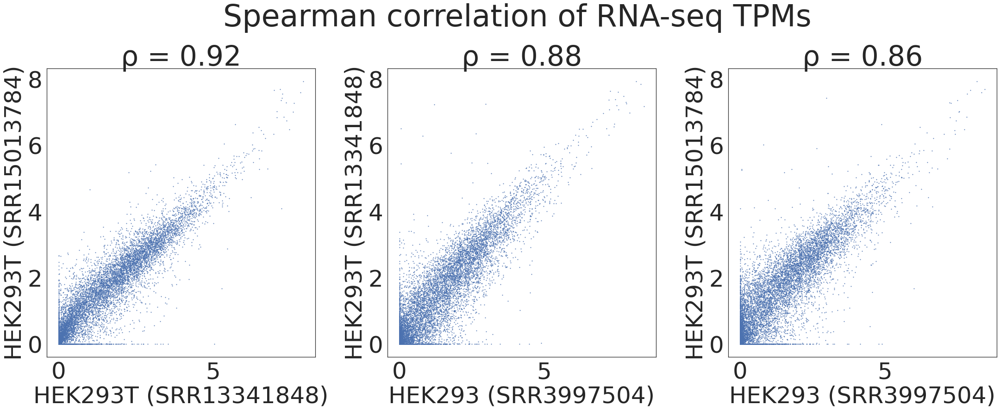

In [31]:
x_1 = df_HEK293T["HEK293.SRR3997504_TPM"]
x_2 = df_HEK293T["HEK293T.SRR13341848_TPM"]
x_3 = df_HEK293T["HEK293T.SRR15013784_TPM"]

sns.set(style="white")
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 10), sharey=False, sharex=False)
fig.tight_layout(pad=3, w_pad=10, h_pad=15)

# plt.rcParams["figure.figsize"] = (10, 10)
ax = axes[0]
x = x_2
y = x_3
ax.plot(np.log1p(x), np.log1p(y), 'o', markersize=1)
sc, sp = spearmanr(x, y)
ax.set_title("\u03C1 = " + str(round(sc, 2)), fontsize=60)
ax.set_xlabel("HEK293T (SRR13341848)", fontsize=50)
ax.set_ylabel("HEK293T (SRR15013784)", fontsize=50)
ax.tick_params(axis='both', which='major', labelsize=50)

ax = axes[1]
x = x_1
y = x_2
ax.plot(np.log1p(x), np.log1p(y), 'o', markersize=1)
sc, sp = spearmanr(x, y)
ax.set_title("\u03C1 = " + str(round(sc, 2)), fontsize=60)
ax.set_xlabel("HEK293 (SRR3997504)", fontsize=50)
ax.set_ylabel("HEK293T (SRR13341848)", fontsize=50)
ax.tick_params(axis='both', which='major', labelsize=50)

ax = axes[2]
x = x_1
y = x_3
ax.plot(np.log1p(x), np.log1p(y), 'o', markersize=1)
sc, sp = spearmanr(x, y)
ax.set_title("\u03C1 = " + str(round(sc, 2)), fontsize=60)
ax.set_xlabel("HEK293 (SRR3997504)", fontsize=50)
ax.set_ylabel("HEK293T (SRR15013784)", fontsize=50)
ax.tick_params(axis='both', which='major', labelsize=50)

plt.suptitle("Spearman correlation of RNA-seq TPMs", fontsize=65, y=1.14)
plt.savefig("HEK293_HEK293T_RNA_seq_TPM_spearman.pdf", dpi=200, bbox_inches = "tight")
plt.show()
plt.close()

In [14]:
# Correlate MNase data between HEK293 and HEK293T
bedGraph_colnames = ["chrom", "start", "end", "value"]

# HEK293_MNase = pd.read_csv("../../../Data/HEK293T_Data/Data_for_Alan_18_June_2022/HEK293.primary_chromosomes.1Kbp.MNase.bedGraph", sep="\t", names=bedGraph_colnames)
# HEK293T_MNase = pd.read_csv("../../../Data/HEK293T_Data/Data_for_Alan_18_June_2022/HEK293T.primary_chromosomes.1Kbp.MNase.bedGraph", sep="\t", names=bedGraph_colnames)
# v_HEK293 = HEK293_MNase["value"].astype('float').to_numpy()
# v_HEK293T = HEK293T_MNase["value"].astype('float').to_numpy()

HEK293_H3K27ac = pd.read_csv("../../../Data/HEK293T_Data/H3K27ac_HEK293T/HEK293.primary_chromosomes.1Kbp.H3K27ac.bedGraph", sep="\t", names=bedGraph_colnames)
HEK293T_H3K27ac = pd.read_csv("../../../Data/HEK293T_Data/H3K27ac_HEK293T/HEK293T.primary_chromosomes.1Kbp.H3K27ac.bedGraph", sep="\t", names=bedGraph_colnames)
v_HEK293 = HEK293_H3K27ac["value"].astype('float').to_numpy()
v_HEK293T = HEK293T_H3K27ac["value"].astype('float').to_numpy()

sc, sp = spearmanr(v_HEK293, v_HEK293T)

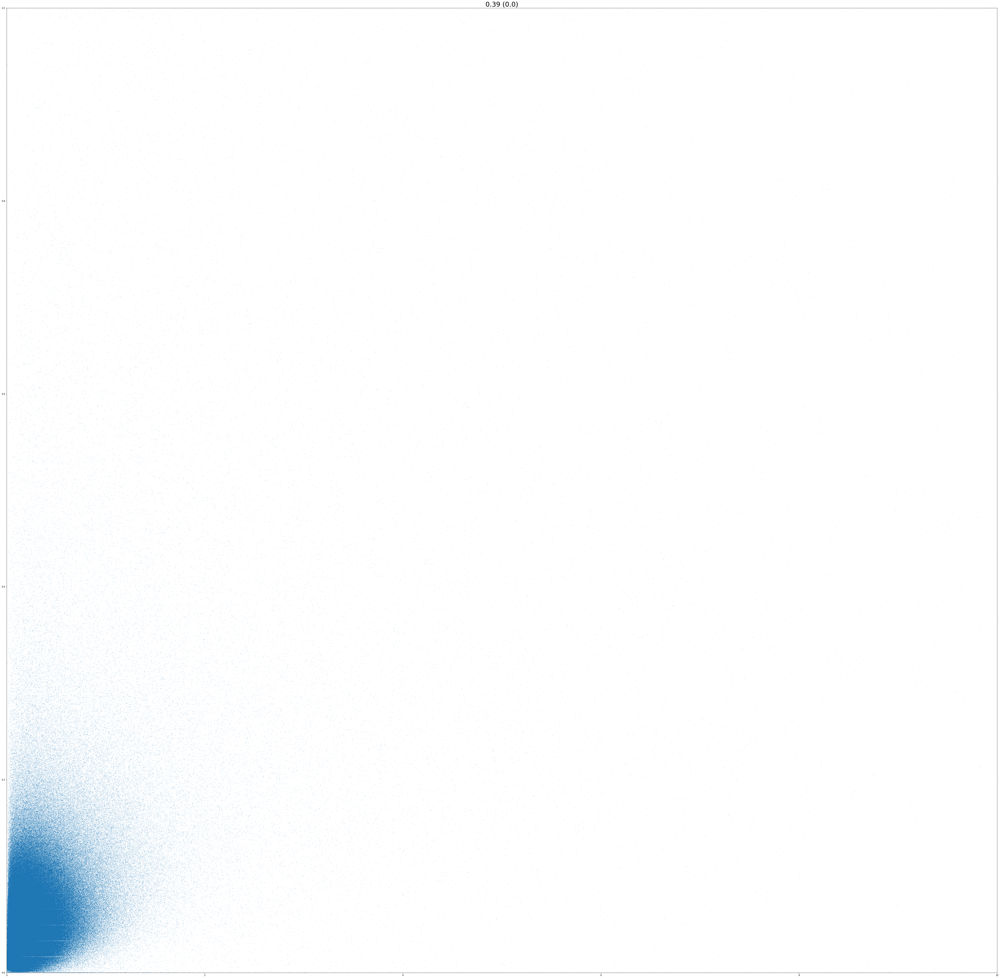

In [15]:
plt.rcParams["figure.figsize"] = (80, 80)
plt.plot(v_HEK293, v_HEK293T, ',', markersize=1)
plt.title(str(round(sc, 2)) + " (" + str(round(sp, 2)) + ")", fontsize=30)
plt.xlim(0, 10)
plt.ylim(0, 1)
plt.show()
plt.close()

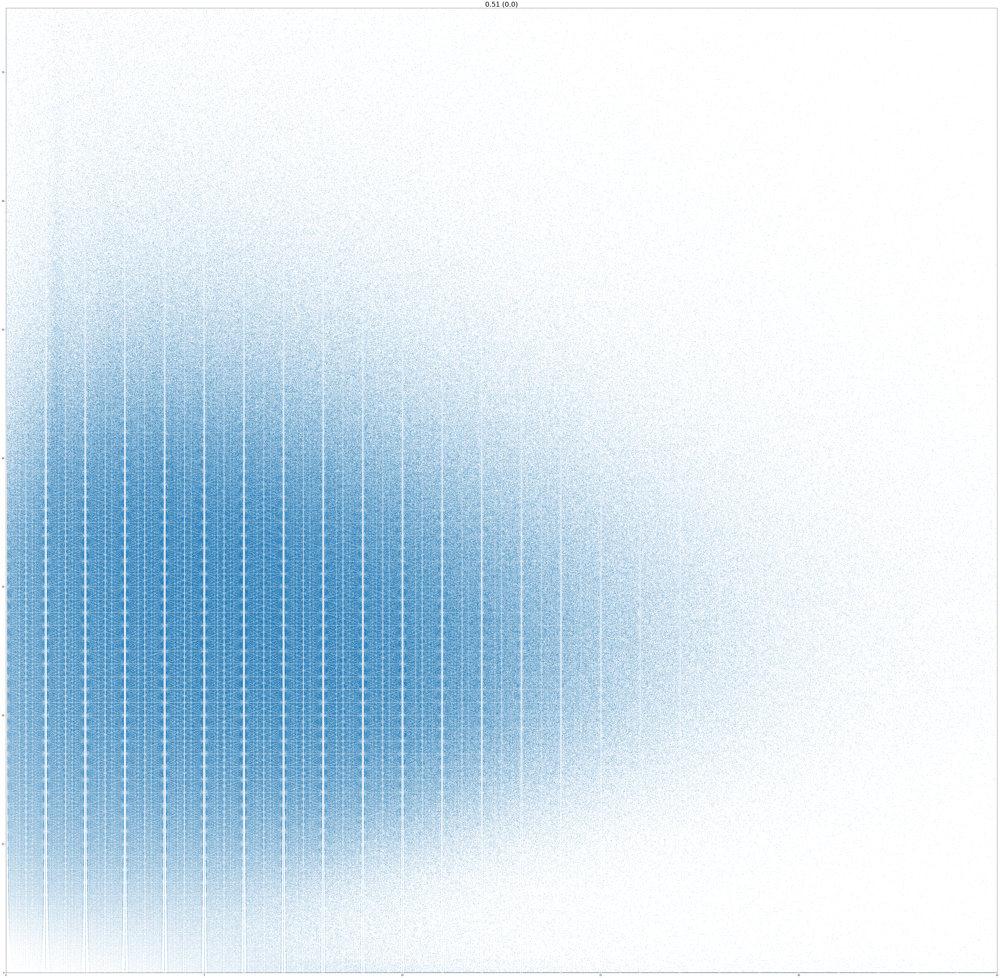

In [19]:
v_HEK293

array([0.0, 0.0, 0.0, ..., '.', '.', '.'], dtype=object)

In [111]:
# Create a bar chart for visualizing cross-cell type correlations for the 8 genes
ccc = {'PRSS12': 0.896, 'MYO1G': 0.621, 'TGFBR1': 0.689, 'C2CD4B': 0.726, 'CXCR4': 0.852, 'CD79A': 0.364, 'SOX11': 0.846, 'CYP17A1': 0.397}

plt.rcParams['axes.edgecolor']='#333F4B'
plt.rcParams['axes.linewidth']=0.8
plt.rcParams['xtick.color']='#333F4B'
plt.rcParams['ytick.color']='#333F4B'
plt.rcParams['text.color']='#333F4B'

df = pd.DataFrame.from_dict(ccc, orient='index', columns=['spearman'])

# we first need a numeric placeholder for the y axis
my_range=list(range(1,len(df.index)+1))

fig, ax = plt.subplots(figsize=(10, 5))

plt.hlines(y=my_range, xmin=0.2, xmax=df['spearman'], color='darkorange', alpha=0.9, linewidth=18)

# create for each expense type a dot at the level of the expense percentage value
plt.plot(df['spearman'], my_range, "o", markersize=0, color='black', alpha=1.0)

# set labels
ax.set_xlabel('spearman correlation', fontsize=15, fontweight='black', color = 'darkorange')
ax.set_ylabel('')

# set axis
ax.tick_params(axis='both', which='major', labelsize=15)
plt.yticks(my_range, df.index, color='black')

# add an horizonal label for the y axis 
fig.text(0.23, 0.96, '           Cross-cell type spearman correlation\nbetween true RNA-seq TPM and CNN predictions', fontsize=15, fontweight='black', color = 'black')

# # change the style of the axis spines
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# ax.spines['left'].set_bounds((1, len(my_range)))
# ax.set_xlim(0,1)

# ax.spines['left'].set_position(('outward', 8))
# ax.spines['bottom'].set_position(('outward', 5))

# plt.show()
plt.savefig("cross_cell_type_spearman_barchart.pdf", dpi=300, bbox_inches = "tight")
plt.close()

In [4]:
# Supplementary Figure for CUT&RUN data
df_4 = pd.read_csv("../../../Data/Supplementary_Table_4.csv", sep=",")
df_4

,gene,gRNA_ID,gRNA_position,amplicon_position,H3K27ac_fold_enrichment,Sample_id
0,CXCR4,gpJL111,-170,-846,2.877740,EXP1-S1
1,CXCR4,gpJL111,-170,-846,2.857758,EXP2-S1
2,CXCR4,gpJL111,-170,-846,2.220031,EXP3-S1
3,CXCR4,gpJL111,-170,-609,2.877740,EXP1-S2
4,CXCR4,gpJL111,-170,-609,2.857758,EXP2-S2
...,...,...,...,...,...,...
88,TGFBR1,gAC171,-240,-355,8.204081,EXP5-S3
89,TGFBR1,gAC171,-240,-355,1.993270,EXP6-S3
90,TGFBR1,gAC171,-240,-238,6.285241,EXP4-S4
91,TGFBR1,gAC171,-240,-238,3.007702,EXP5-S4


In [14]:
d_4 = {}
gRNA_to_gene = {}

for index, row in df_4.iterrows():
    k = row['gene'] + "_" + str(row['gRNA_position']) + "_" + str(row['amplicon_position'])
    d = abs(int(row['gRNA_position']) - int(row['amplicon_position']))
    g = row['gRNA_ID']

    gRNA_to_gene[g] = row['gene']
    
    key = (k, g, d)
    fc = row['H3K27ac_fold_enrichment']
    
    if(key in d_4):            
        d_4[key].append(fc)
    else:
        d_4[key] = [fc]

d_4    

{('CXCR4_-170_-238', 'gpJL111', 68): [1.994935, 2.205279, 1.689887],
 ('CXCR4_-170_-350', 'gpJL111', 180): [2.34328, 2.503423, 2.055698],
 ('CXCR4_-170_-609', 'gpJL111', 439): [2.87774, 2.857758, 2.220031],
 ('CXCR4_-170_-70', 'gpJL111', 100): [2.6983, 3.396026, 2.75947],
 ('CXCR4_-170_-846', 'gpJL111', 676): [2.87774, 2.857758, 2.220031],
 ('CXCR4_-201_-238', 'gAC127', 37): [4.785368, 2.155023, 1.928737],
 ('CXCR4_-201_-350', 'gAC127', 149): [5.454628, 2.730725, 1.986578],
 ('CXCR4_-201_-609', 'gAC127', 408): [5.67117, 2.813263, 2.288192],
 ('CXCR4_-201_-70', 'gAC127', 131): [5.648907, 3.372778, 2.591915],
 ('CXCR4_-201_-846', 'gAC127', 645): [5.67117, 2.813263, 2.288192],
 ('CXCR4_-34_-238', 'gAC138', 204): [3.9104330000000003, 5.603263, 3.046533],
 ('CXCR4_-34_-350', 'gAC138', 316): [2.954952, 4.753491, 2.416296],
 ('CXCR4_-34_-609', 'gAC138', 575): [3.6706510000000003,
  5.615908999999999,
  3.226458],
 ('CXCR4_-34_-70', 'gAC138', 36): [4.074821, 6.296844, 3.071568],
 ('CXCR4_-34_-

In [15]:
d_4_mean = {}
d_4_g = {}
for key in d_4:
    d_4_mean[key] = np.mean(d_4[key])

d_4_mean

{('CXCR4_-170_-238', 'gpJL111', 68): 1.9633669999999999,
 ('CXCR4_-170_-350', 'gpJL111', 180): 2.300800333333333,
 ('CXCR4_-170_-609', 'gpJL111', 439): 2.651843,
 ('CXCR4_-170_-70', 'gpJL111', 100): 2.9512653333333336,
 ('CXCR4_-170_-846', 'gpJL111', 676): 2.651843,
 ('CXCR4_-201_-238', 'gAC127', 37): 2.956376,
 ('CXCR4_-201_-350', 'gAC127', 149): 3.390643666666666,
 ('CXCR4_-201_-609', 'gAC127', 408): 3.590875,
 ('CXCR4_-201_-70', 'gAC127', 131): 3.8712,
 ('CXCR4_-201_-846', 'gAC127', 645): 3.590875,
 ('CXCR4_-34_-238', 'gAC138', 204): 4.186743,
 ('CXCR4_-34_-350', 'gAC138', 316): 3.3749130000000007,
 ('CXCR4_-34_-609', 'gAC138', 575): 4.171005999999999,
 ('CXCR4_-34_-70', 'gAC138', 36): 4.481077666666667,
 ('CXCR4_-34_-846', 'gAC138', 812): 4.171005999999999,
 ('TGFBR1_-195_-238', 'gAC075', 43): 3.9794126666666667,
 ('TGFBR1_-195_-355', 'gAC075', 160): 6.407092666666667,
 ('TGFBR1_-195_-447', 'gAC075', 252): 7.625393,
 ('TGFBR1_-195_-749', 'gAC075', 554): 6.474214666666666,
 ('TGFBR1

In [16]:
d_4_g = {}
for key in d_4_mean:
        if(key[1] in d_4_g):
            d_4_g[key[1]].append((key[2], d_4_mean[key]))
        else:
            d_4_g[key[1]] = [(key[2], d_4_mean[key])]

d_4_g            


{'gAC075': [(554, 6.474214666666666),
  (252, 7.625393),
  (160, 6.407092666666667),
  (43, 3.9794126666666667)],
 'gAC078': [(727, 3.417647),
  (425, 3.575783),
  (333, 4.170469333333333),
  (216, 1.3539459999999999)],
 'gAC127': [(645, 3.590875),
  (408, 3.590875),
  (149, 3.390643666666666),
  (37, 2.956376),
  (131, 3.8712)],
 'gAC138': [(812, 4.171005999999999),
  (575, 4.171005999999999),
  (316, 3.3749130000000007),
  (204, 4.186743),
  (36, 4.481077666666667)],
 'gAC170': [(512, 8.552143333333333),
  (210, 10.080742666666666),
  (118, 9.761039666666667),
  (1, 19.076890666666667)],
 'gAC171': [(509, 7.259843333333333),
  (207, 7.544622),
  (115, 9.232670333333333),
  (2, 3.530714)],
 'gpJL111': [(676, 2.651843),
  (439, 2.651843),
  (180, 2.300800333333333),
  (68, 1.9633669999999999),
  (100, 2.9512653333333336)]}

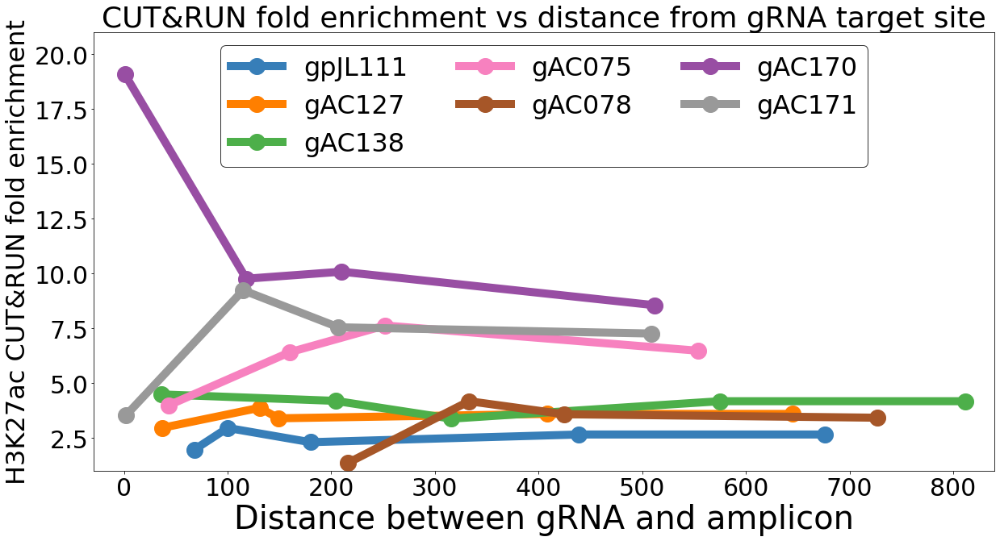

In [48]:
plt.rcParams["figure.figsize"] = (20, 10)

Color_Blind_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

index_2_color = dict((i, Color_Blind_color_cycle[i]) for i in range(len(Color_Blind_color_cycle)))

for i, key in enumerate(d_4_g):
    gene = gRNA_to_gene[key]
    l = d_4_g[key]
    l.sort(key=lambda x: x[0])
    
    plt.plot([x[0] for x in l], [x[1] for x in l], 'o-', linewidth=10, markersize=20, label=key, color=index_2_color[i])
    
plt.xlabel("Distance between gRNA and amplicon", fontsize=40)
plt.ylabel("H3K27ac CUT&RUN fold enrichment", fontsize=32)
plt.tick_params(axis='x', labelsize=30)
plt.tick_params(axis='y', labelsize=30)

plt.title("CUT&RUN fold enrichment vs distance from gRNA target site", fontsize=36)
# handles, labels = plt.gca().get_legend_handles_labels()
# labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    
plt.legend(loc="upper center", ncol=3, fontsize=32, markerscale=1, frameon=True, edgecolor='black')
#                    bbox_to_anchor=(0, 1.5))
    
plt.xlim(-29, 840)    
plt.ylim(1, 21)

plt.savefig("CUTnRUN.pdf", dpi=200, bbox_inches = "tight")

plt.show()
plt.close()
    
    
    

In [40]:
my_range

[1, 2, 3, 4, 5, 6, 7, 8]

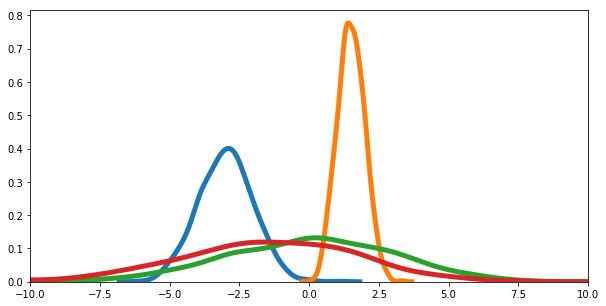

In [27]:
plt.rcParams["figure.figsize"] = (10, 5)

x1 = np.random.normal(-3, 1, size=1000)
x2 = 0.5 * np.random.normal(+3, 1, size=1000)
x = np.random.normal(0, 3, size=1000)

sns.distplot(x1, hist=False, kde_kws=dict(linewidth=5))
sns.distplot(x2, hist=False, kde_kws=dict(linewidth=5))
sns.distplot(x, hist=False, kde_kws=dict(linewidth=5))

# sns.distplot(x1+x2, hist=False, kde_kws=dict(linewidth=5))
sns.distplot(x1+x2+x, hist=False, kde_kws=dict(linewidth=5))

plt.xlim(-10, 10)
plt.show()
plt.close()